In [2]:
import torch
from torchvision import transforms
from torchvision import datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn.functional as F
import numpy as np

In [3]:
import torchvision
batch_size = 64
transform  = transforms.Compose([
    transforms.ToTensor(), #convert pil image to tensor
    transforms.Normalize((0.1307,),( 0.3081,)) # mean & std,数字是对mnist计算出的经验值
])
train_dataset = datasets.MNIST(root='../dataset/mnist',train = True,transform=transform,download = True)
test_dataset = datasets.MNIST(root='../dataset/mnist',train = False,transform=transform,download = True)
train_loader = DataLoader(dataset= train_dataset,batch_size= batch_size ,shuffle= True)
test_loader = DataLoader(dataset= test_dataset,batch_size= batch_size ,shuffle= False)


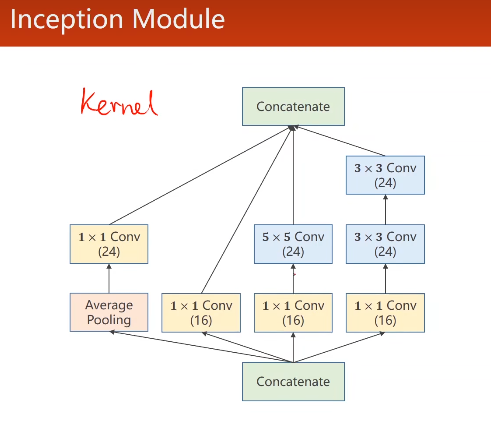
1*1convolution :kernel_size = 1,作用：改变通道数
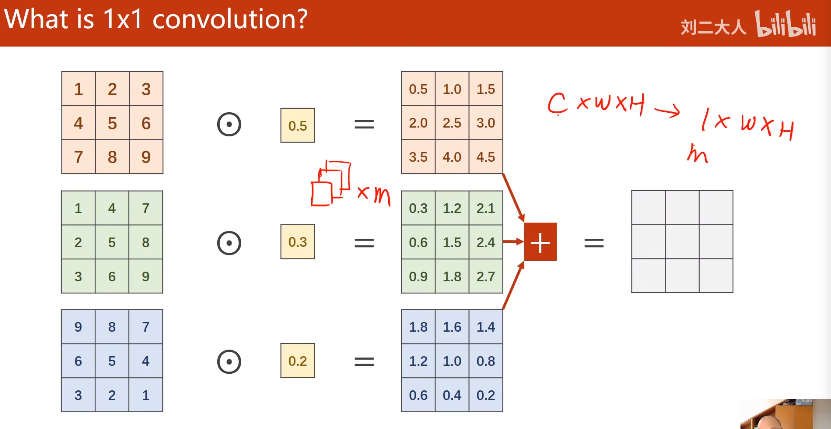 
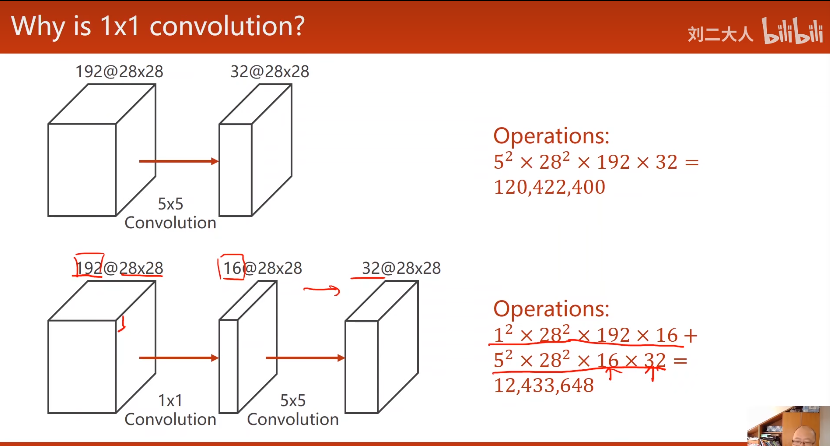
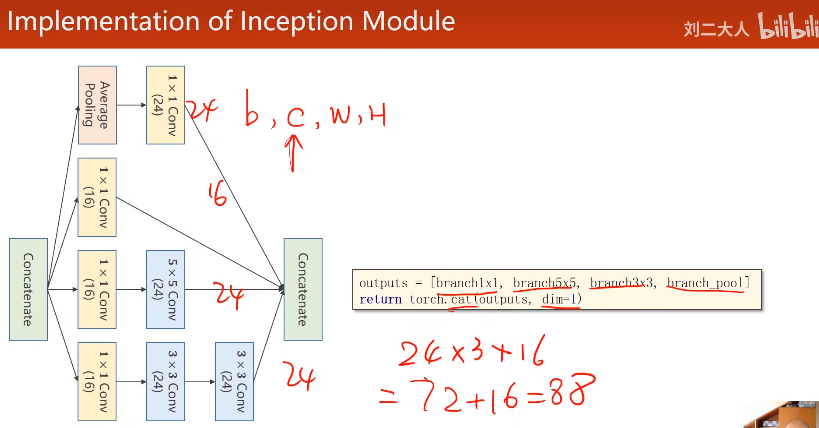

In [96]:
class InceptionA(torch.nn.Module):
    def __init__(self,input_channels):
        super(InceptionA, self).__init__()
        self.b1_avgPool_layer1 = torch.nn.AvgPool2d(kernel_size= 1,stride=1)#默认stride是按照kernel_size大小来的
        self.b1_conv_layer2 = torch.nn.Conv2d(input_channels,24,kernel_size=1,padding=0,stride=1,bias = False)
                
        self.b2_conv_layer1 = torch.nn.Conv2d(input_channels,16,kernel_size=1,padding=0,stride=1,bias = False)
        
        self.b3_conv_layer1 = torch.nn.Conv2d(input_channels,16,kernel_size=1,padding=0,stride=1,bias = False)
        self.b3_conv_layer2 = torch.nn.Conv2d(16,24,kernel_size=5,padding=2,stride=1,bias = False)

        self.b4_conv_layer1 = torch.nn.Conv2d(input_channels,16,kernel_size=1,padding=0,stride=1,bias = False)
        self.b4_conv_layer2 = torch.nn.Conv2d(16,24,kernel_size=3,padding=1,stride=1,bias = False)
        self.b4_conv_layer3 = torch.nn.Conv2d(24,24,kernel_size=3,padding=1,stride=1,bias = False)

    def forward(self, x):
        branch1 = F.relu(self.b1_conv_layer2(self.b1_avgPool_layer1(x)))
        branch2 = F.relu(self.b2_conv_layer1(x))
        branch3 = F.relu(self.b3_conv_layer2(F.relu(self.b3_conv_layer1(x))))
        branch4 = F.relu(self.b4_conv_layer3(F.relu(self.b4_conv_layer2( F.relu(self.b4_conv_layer1(x))))))
        outputs = [branch1 , branch2 , branch3 , branch4]
        # print ("b1 =",branch1.shape);        print ("b2 =",branch2.shape);        print ("b3 =",branch3.shape);        print ("b4 =",branch4.shape)
        outputs = torch.cat(outputs,dim =1)
        # print ("outputs.shape = ",outputs.shape)
        return outputs


In [97]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model = InceptionA(10).to(device)

cuda:0


In [98]:
from torchsummary import summary
summary(model,(10,28,28),batch_size = 24)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         AvgPool2d-1           [24, 10, 28, 28]               0
            Conv2d-2           [24, 24, 28, 28]             240
            Conv2d-3           [24, 16, 28, 28]             160
            Conv2d-4           [24, 16, 28, 28]             160
            Conv2d-5           [24, 24, 28, 28]           9,600
            Conv2d-6           [24, 16, 28, 28]             160
            Conv2d-7           [24, 24, 28, 28]           3,456
            Conv2d-8           [24, 24, 28, 28]           5,184
Total params: 18,960
Trainable params: 18,960
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.72
Forward/backward pass size (MB): 22.11
Params size (MB): 0.07
Estimated Total Size (MB): 22.90
----------------------------------------------------------------


In [99]:
class Net(torch.nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = torch.nn.Conv2d(1,10,kernel_size=5,padding=0,stride=1,bias = False)
        self.conv2 = torch.nn.Conv2d(88,20,kernel_size=5,padding=0,stride=1,bias = False)
                     
        self.incep1 =InceptionA(input_channels = 10)
        self.incep2 =InceptionA(input_channels = 20)
        self.mp = torch.nn.MaxPool2d(2)
        self.fc = torch.nn.Linear(1408,10)
        
    def forward(self, x):
        in_size = x.size(0)
        x = F.relu(self.mp(self.conv1(x)))
        x = self.incep1(x)
        x = F.relu(self.mp(self.conv2(x)))
        x = self.incep2(x)
        x = x.view(in_size,-1)
        x = self.fc(x)
        return x
    
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model = Net().to(device)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=1e-3,momentum=0.5)

cuda:0


In [100]:
summary(model,(1,28,28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 10, 24, 24]             250
         MaxPool2d-2           [-1, 10, 12, 12]               0
         AvgPool2d-3           [-1, 10, 12, 12]               0
            Conv2d-4           [-1, 24, 12, 12]             240
            Conv2d-5           [-1, 16, 12, 12]             160
            Conv2d-6           [-1, 16, 12, 12]             160
            Conv2d-7           [-1, 24, 12, 12]           9,600
            Conv2d-8           [-1, 16, 12, 12]             160
            Conv2d-9           [-1, 24, 12, 12]           3,456
           Conv2d-10           [-1, 24, 12, 12]           5,184
       InceptionA-11           [-1, 88, 12, 12]               0
           Conv2d-12             [-1, 20, 8, 8]          44,000
        MaxPool2d-13             [-1, 20, 4, 4]               0
        AvgPool2d-14             [-1, 2

In [101]:
def train(rpoch):
    running_loss= 0.0
    for batch_idx,data in enumerate(train_loader,0):
        inputs,target = data
        inputs = inputs.to(device)
        target = target.to(device)
        optimizer.zero_grad() #优化器清零
        outputs = model(inputs)
        loss = criterion(outputs, target)
        loss.backward() 
        optimizer.step()
        running_loss += loss.item()
        if batch_idx %100 ==99:
            print('[%d,%5d] loss : %.3f' % (epoch, batch_idx+1, running_loss/100))
            running_loss = 0 

def test():
    correct =0
    total = 0
    with torch.no_grad():
        for data in test_loader:
            images,labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _,predicted = torch.max(outputs.data,dim = 1 ) #dim=0 :row
            total += labels.size(0)
            correct+= (predicted==labels).sum().item()
    print('acc = ',(100 * correct)/total)


In [102]:
def show_images(images, labels , pred, nrows=4, ncols=4):
    """
    显示一个批次的图片和标签
    Args:
        images: torch.Tensor, 形状 [batch, 1, 28, 28]
        labels: torch.Tensor, 形状 [batch]
        nrows: 显示的行数
        ncols: 显示的列数
    """
    plt.figure(figsize=(12, 6))
    for i in range(nrows * ncols):
        plt.subplot(nrows, ncols, i+1)
        img = images[i].squeeze().cpu().numpy()  # 去掉通道维度 -> [28, 28]
        plt.imshow(img, cmap='gray')
        if labels[i].item()==pred[i].item():
            plt.title(f"✔ ,Label: {labels[i].item()}")
        else:
            plt.title(f" X ,Label: {labels[i].item()}, Pred: {pred[i].item()}")
        
        plt.axis('off')
    plt.tight_layout()
    plt.show()

[0,  100] loss : 2.300
[0,  200] loss : 2.298
[0,  300] loss : 2.293
[0,  400] loss : 2.289
[0,  500] loss : 2.282
[0,  600] loss : 2.273
[0,  700] loss : 2.256
[0,  800] loss : 2.232
[0,  900] loss : 2.185
acc =  46.87


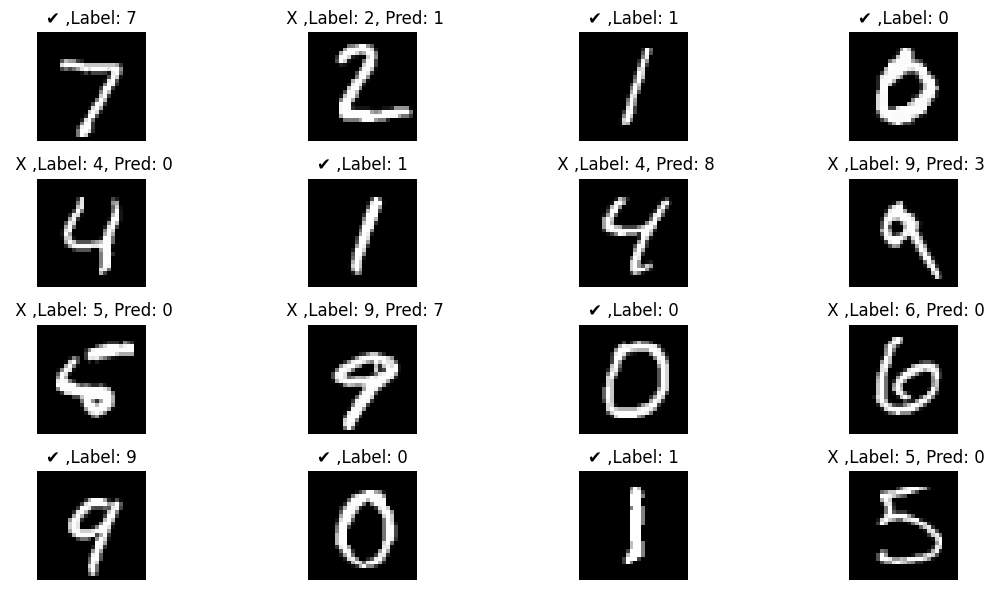

[1,  100] loss : 2.025
[1,  200] loss : 1.722
[1,  300] loss : 1.278
[1,  400] loss : 0.937
[1,  500] loss : 0.731
[1,  600] loss : 0.622
[1,  700] loss : 0.567
[1,  800] loss : 0.515
[1,  900] loss : 0.494
acc =  86.18
[2,  100] loss : 0.441
[2,  200] loss : 0.441
[2,  300] loss : 0.447
[2,  400] loss : 0.427
[2,  500] loss : 0.390
[2,  600] loss : 0.385
[2,  700] loss : 0.376
[2,  800] loss : 0.378
[2,  900] loss : 0.357
acc =  89.48
[3,  100] loss : 0.348
[3,  200] loss : 0.350
[3,  300] loss : 0.341
[3,  400] loss : 0.328
[3,  500] loss : 0.317
[3,  600] loss : 0.298
[3,  700] loss : 0.295
[3,  800] loss : 0.309
[3,  900] loss : 0.300
acc =  91.21
[4,  100] loss : 0.281
[4,  200] loss : 0.277
[4,  300] loss : 0.278
[4,  400] loss : 0.293
[4,  500] loss : 0.276
[4,  600] loss : 0.237
[4,  700] loss : 0.260
[4,  800] loss : 0.255
[4,  900] loss : 0.242
acc =  93.22
[5,  100] loss : 0.250
[5,  200] loss : 0.241
[5,  300] loss : 0.228
[5,  400] loss : 0.228
[5,  500] loss : 0.213
[5,  

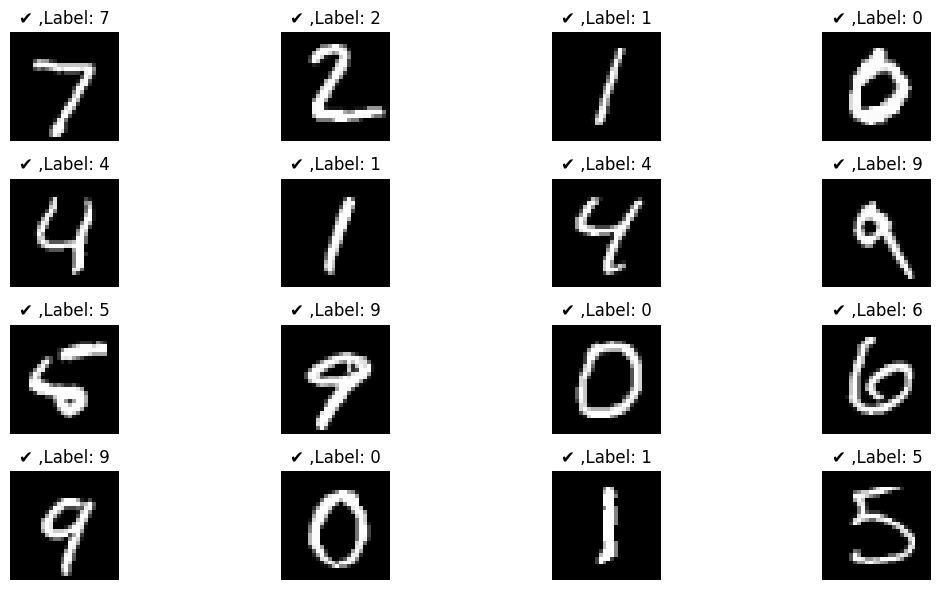

[101,  100] loss : 0.019
[101,  200] loss : 0.018
[101,  300] loss : 0.020
[101,  400] loss : 0.022
[101,  500] loss : 0.016
[101,  600] loss : 0.020
[101,  700] loss : 0.023
[101,  800] loss : 0.022
[101,  900] loss : 0.016
acc =  98.78
[102,  100] loss : 0.016
[102,  200] loss : 0.021
[102,  300] loss : 0.020
[102,  400] loss : 0.023
[102,  500] loss : 0.017
[102,  600] loss : 0.022
[102,  700] loss : 0.021
[102,  800] loss : 0.019
[102,  900] loss : 0.020
acc =  98.91
[103,  100] loss : 0.019
[103,  200] loss : 0.022
[103,  300] loss : 0.019
[103,  400] loss : 0.017
[103,  500] loss : 0.021
[103,  600] loss : 0.017
[103,  700] loss : 0.026
[103,  800] loss : 0.021
[103,  900] loss : 0.015
acc =  98.79
[104,  100] loss : 0.019
[104,  200] loss : 0.018
[104,  300] loss : 0.017
[104,  400] loss : 0.016
[104,  500] loss : 0.025
[104,  600] loss : 0.019
[104,  700] loss : 0.018
[104,  800] loss : 0.021
[104,  900] loss : 0.019
acc =  98.82
[105,  100] loss : 0.019
[105,  200] loss : 0.02

KeyboardInterrupt: 

In [103]:
if __name__ == '__main__':
    for epoch in range(100000):
        train(epoch)
        test()
        if epoch % 100 ==0:
            with torch.no_grad():
                for data in test_loader:
                    images,labels = data
                    images = images.to(device)
                    labels = labels.to(device)
                    outputs = model(images)
                    _,predicted = torch.max(outputs.data,dim = 1 ) #dim=0 :row
                    # print(predicted)
                    show_images(images,labels,predicted)
                    break
            
       

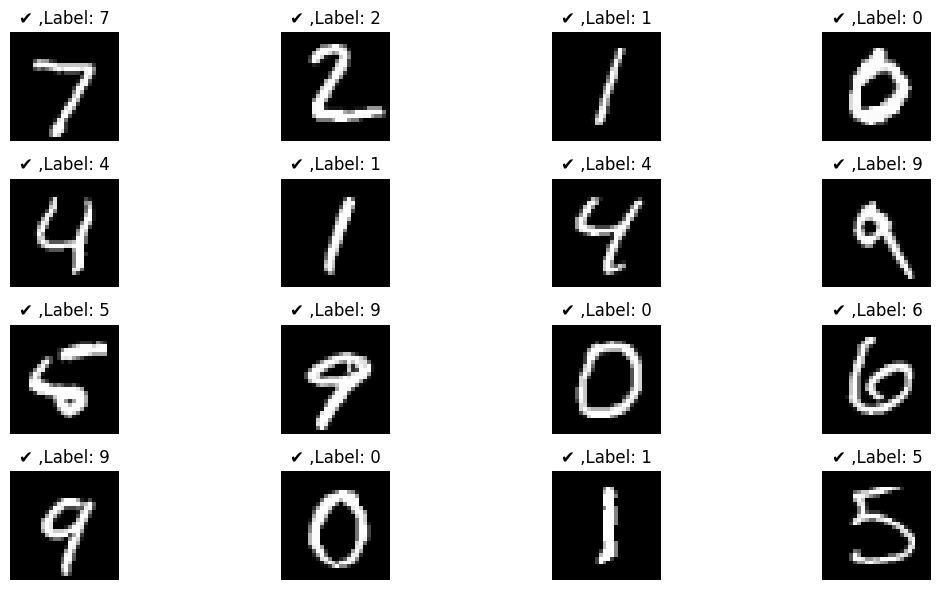

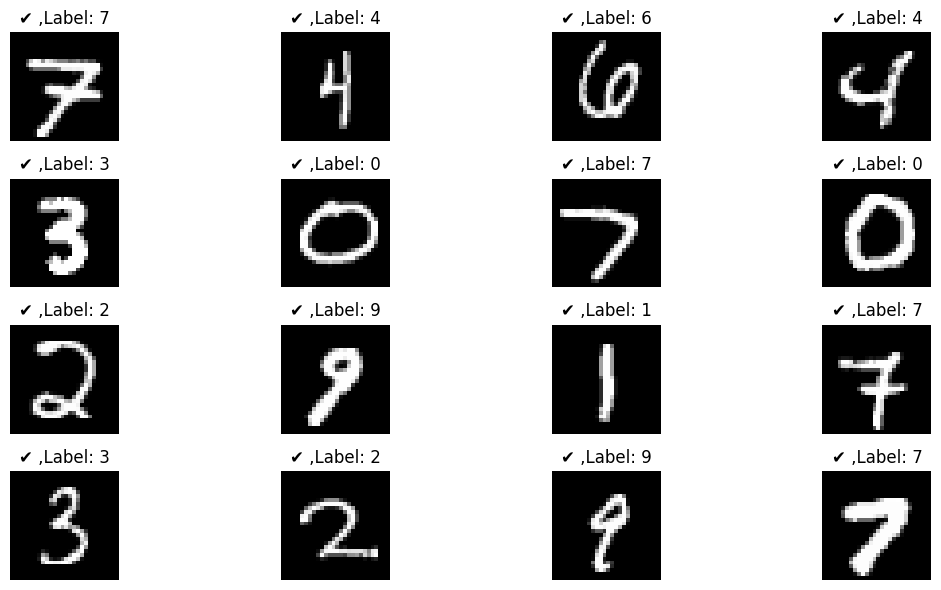

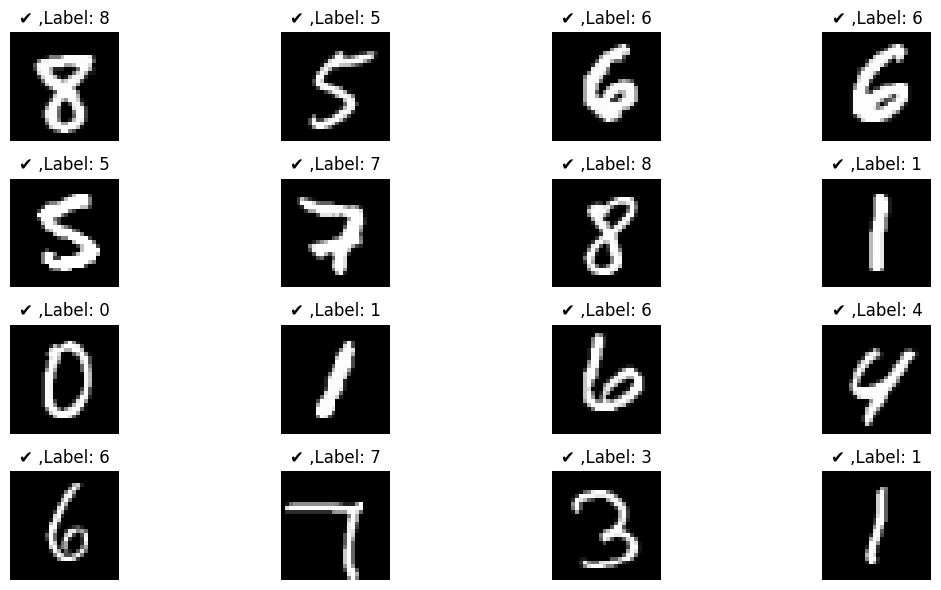

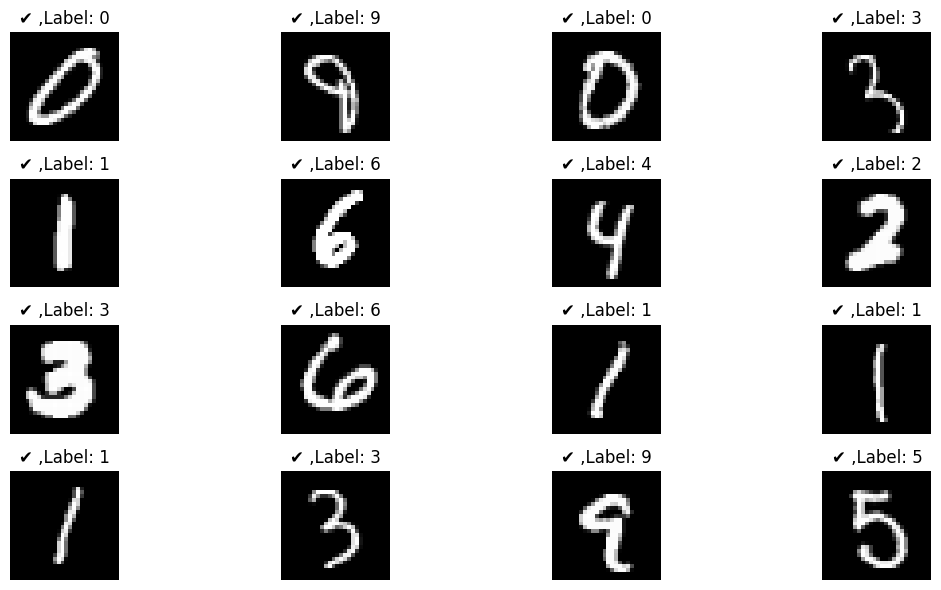

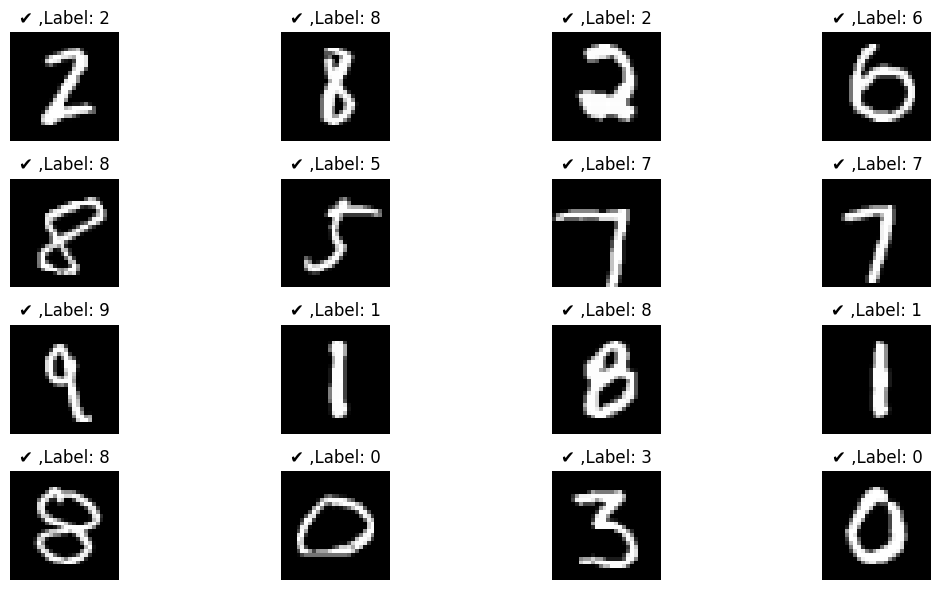

...

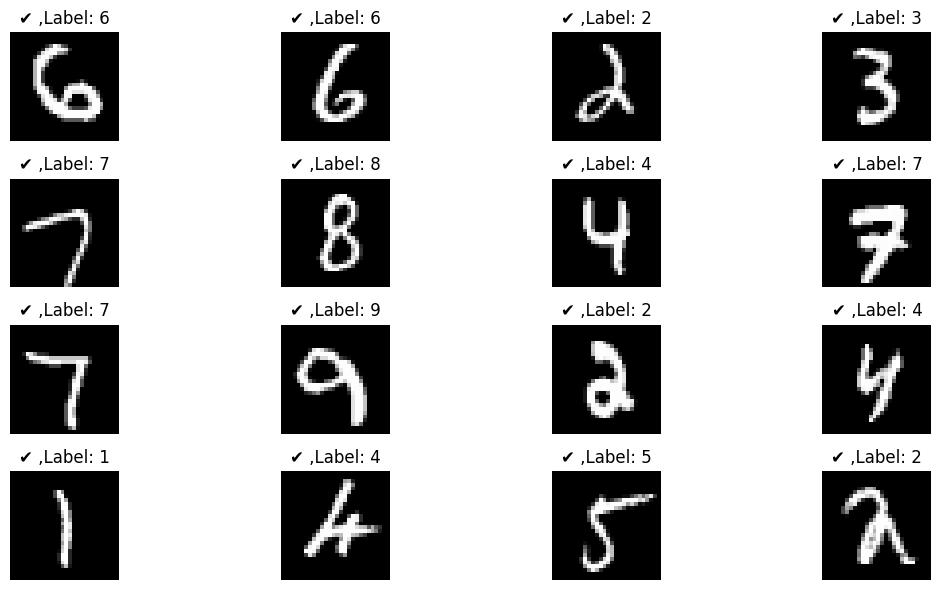

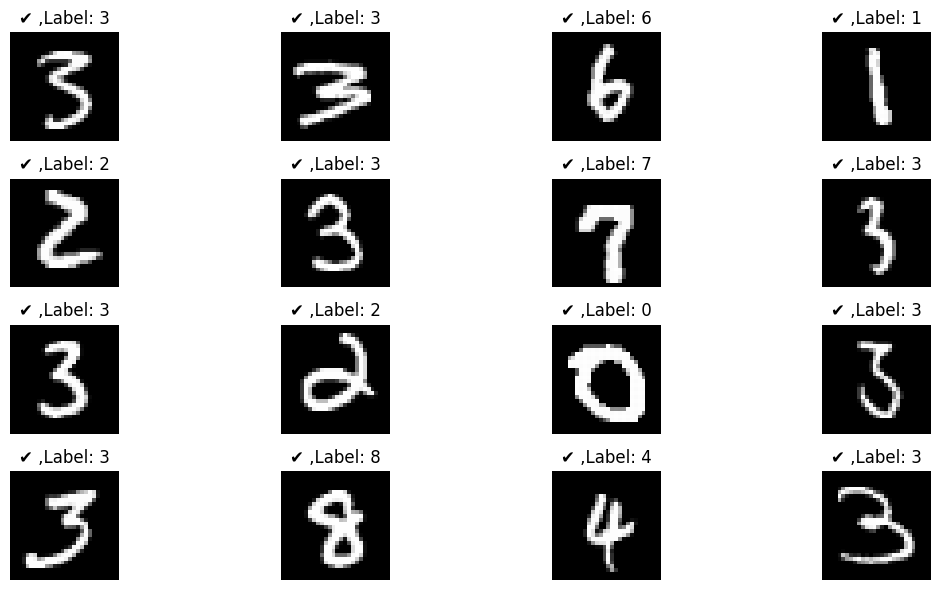

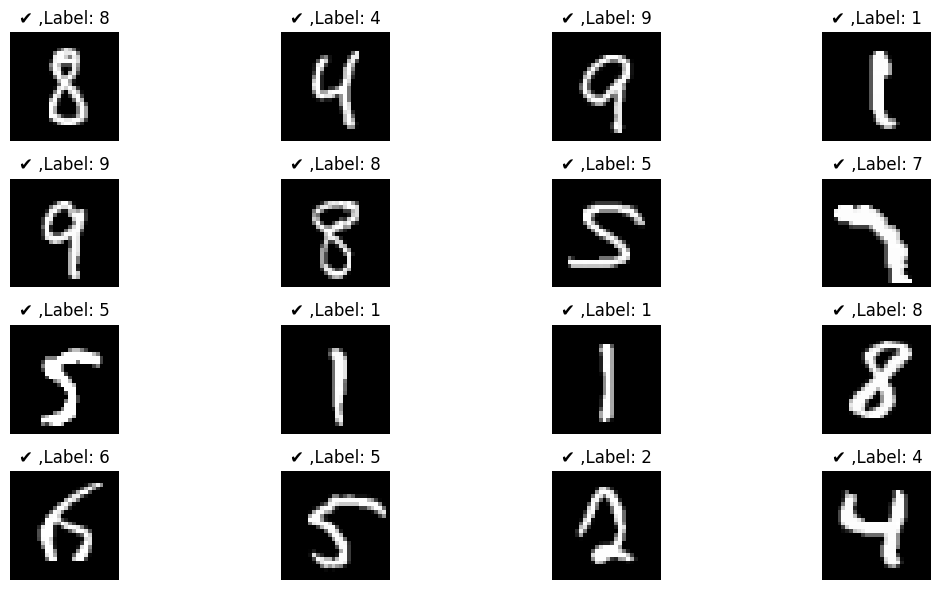

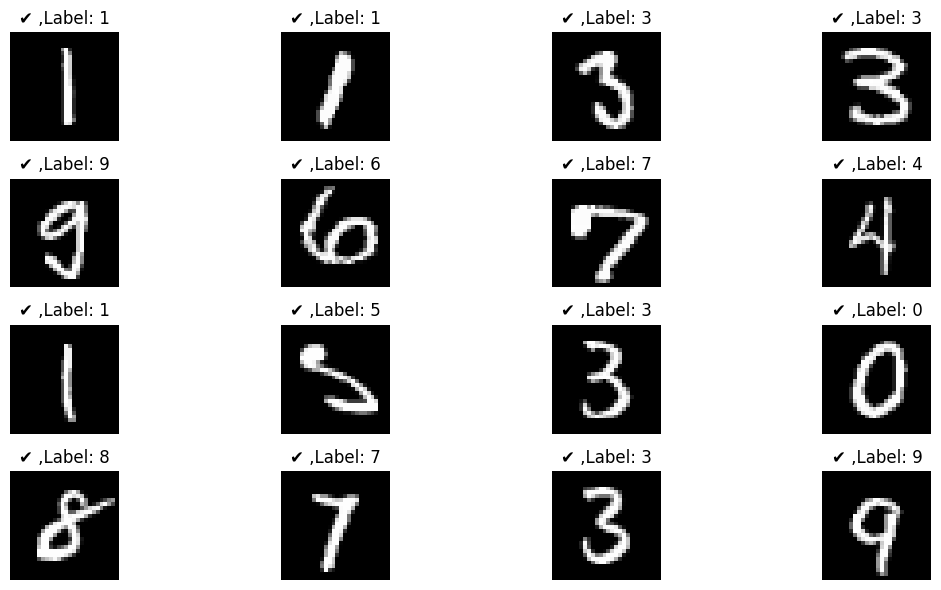

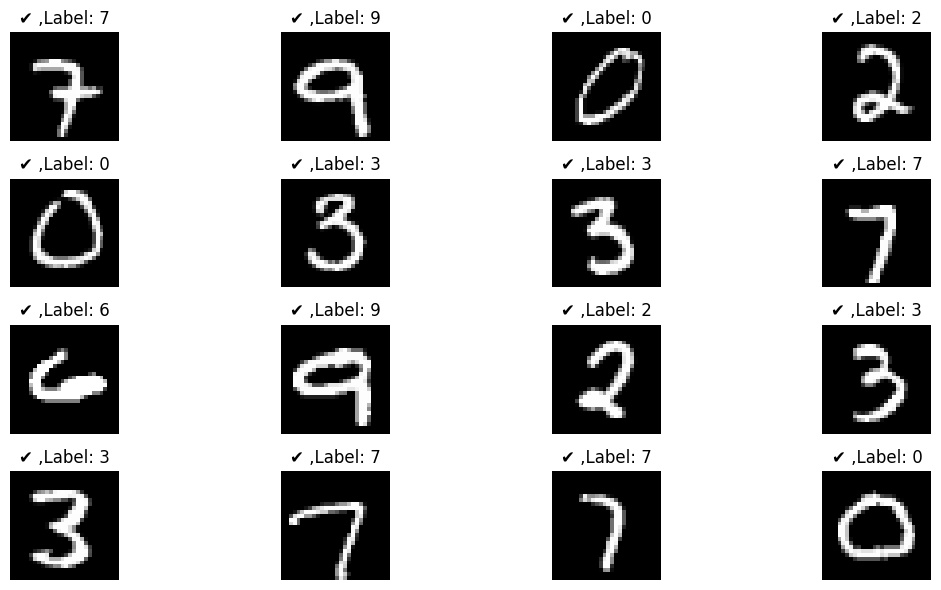

KeyboardInterrupt: 

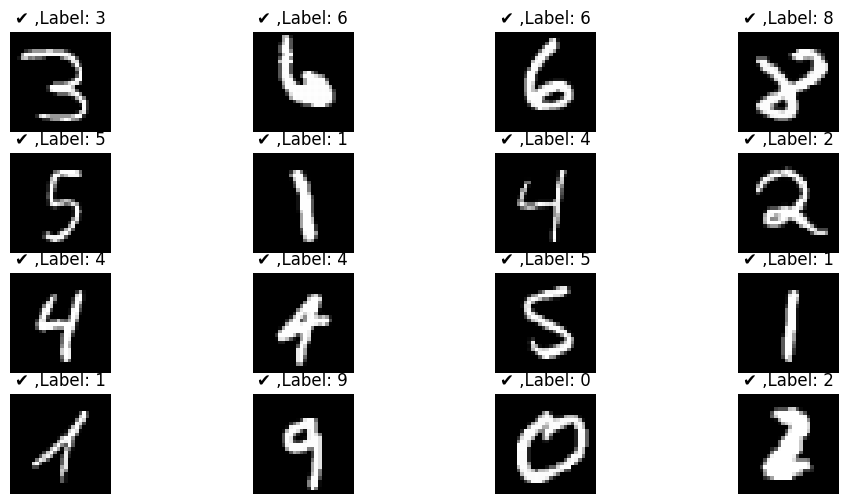

In [104]:
with torch.no_grad():
    for data in test_loader:
        images,labels = data
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _,predicted = torch.max(outputs.data,dim = 1 ) #dim=0 :row
        # print(predicted)
        show_images(images,labels,predicted)
        # break

In [109]:
import torch.nn as nn
class ResidualBlock(nn.Module):
    def __init__(self,channels):
        super(ResidualBlock,self).__init__()
        self.channels = channels
        self.conv1 = nn.Conv2d(channels,channels,kernel_size = 3,padding=1)
        self.conv2 = nn.Conv2d(channels,channels,kernel_size = 3,padding=1)

    def forward(self,x):
        y = F.relu(self.conv1(x))
        y = self.conv2(y)
        return F.relu(x + y)
class Net(nn.Module):
    def __init__(self):
        super(Net,self).__init__()
        self.conv1 = torch.nn.Conv2d(1, 16, kernel_size = 5)
        
        self.conv2 = torch.nn.Conv2d(16, 32, kernel_size = 5)
        self.mp = torch.nn.MaxPool2d(2)
        self.rblock1 = ResidualBlock(16)
        self.rblock2 = ResidualBlock(32)
        self.fc = torch.nn.Linear(512,10)
    def forward(self,x):
        in_size = x.size(0)
        x = self.mp(F.relu(self.conv1(x)))
        x = self.rblock1(x)
        x = self.mp(F.relu(self.conv2(x)))
        x = self.rblock2(x)
        x = x.view(in_size,-1)
        x = self.fc(x)
        return x
        

cuda:0
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 24, 24]             416
         MaxPool2d-2           [-1, 16, 12, 12]               0
            Conv2d-3           [-1, 16, 12, 12]           2,320
            Conv2d-4           [-1, 16, 12, 12]           2,320
     ResidualBlock-5           [-1, 16, 12, 12]               0
            Conv2d-6             [-1, 32, 8, 8]          12,832
         MaxPool2d-7             [-1, 32, 4, 4]               0
            Conv2d-8             [-1, 32, 4, 4]           9,248
            Conv2d-9             [-1, 32, 4, 4]           9,248
    ResidualBlock-10             [-1, 32, 4, 4]               0
           Linear-11                   [-1, 10]           5,130
Total params: 41,514
Trainable params: 41,514
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
For

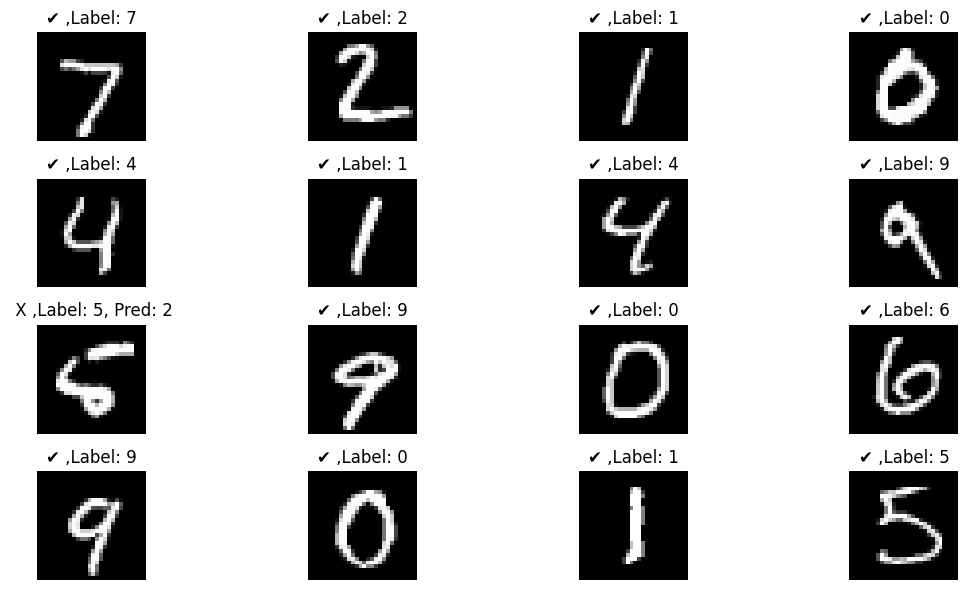

[1,  100] loss : 0.341
[1,  200] loss : 0.304
[1,  300] loss : 0.310
[1,  400] loss : 0.289
[1,  500] loss : 0.280
[1,  600] loss : 0.285
[1,  700] loss : 0.256
[1,  800] loss : 0.249
[1,  900] loss : 0.244
acc =  93.77
[2,  100] loss : 0.228
[2,  200] loss : 0.214
[2,  300] loss : 0.202
[2,  400] loss : 0.203
[2,  500] loss : 0.211
[2,  600] loss : 0.185
[2,  700] loss : 0.197
[2,  800] loss : 0.195
[2,  900] loss : 0.182
acc =  95.2
[3,  100] loss : 0.176
[3,  200] loss : 0.170
[3,  300] loss : 0.160
[3,  400] loss : 0.155
[3,  500] loss : 0.163
[3,  600] loss : 0.164
[3,  700] loss : 0.158
[3,  800] loss : 0.146
[3,  900] loss : 0.143
acc =  96.22
[4,  100] loss : 0.143
[4,  200] loss : 0.129
[4,  300] loss : 0.143
[4,  400] loss : 0.134
[4,  500] loss : 0.142
[4,  600] loss : 0.142
[4,  700] loss : 0.122
[4,  800] loss : 0.125
[4,  900] loss : 0.131
acc =  96.6
[5,  100] loss : 0.121
[5,  200] loss : 0.105
[5,  300] loss : 0.123
[5,  400] loss : 0.122
[5,  500] loss : 0.121
[5,  60

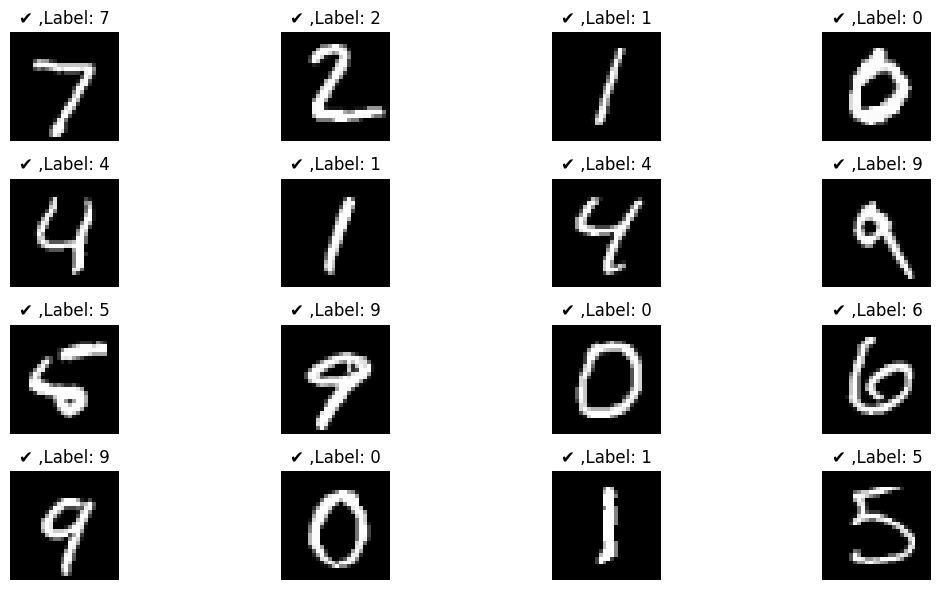

[101,  100] loss : 0.010
[101,  200] loss : 0.013
[101,  300] loss : 0.015
[101,  400] loss : 0.011
[101,  500] loss : 0.012
[101,  600] loss : 0.011
[101,  700] loss : 0.012
[101,  800] loss : 0.015
[101,  900] loss : 0.014
acc =  98.99
[102,  100] loss : 0.014
[102,  200] loss : 0.012
[102,  300] loss : 0.014
[102,  400] loss : 0.014
[102,  500] loss : 0.011
[102,  600] loss : 0.011
[102,  700] loss : 0.009
[102,  800] loss : 0.013
[102,  900] loss : 0.013
acc =  99.0
[103,  100] loss : 0.014
[103,  200] loss : 0.010
[103,  300] loss : 0.013
[103,  400] loss : 0.014
[103,  500] loss : 0.014
[103,  600] loss : 0.013
[103,  700] loss : 0.013
[103,  800] loss : 0.010
[103,  900] loss : 0.011
acc =  98.88
[104,  100] loss : 0.014
[104,  200] loss : 0.017
[104,  300] loss : 0.014
[104,  400] loss : 0.013
[104,  500] loss : 0.010
[104,  600] loss : 0.011
[104,  700] loss : 0.013
[104,  800] loss : 0.007
[104,  900] loss : 0.009
acc =  98.86
[105,  100] loss : 0.009
[105,  200] loss : 0.012

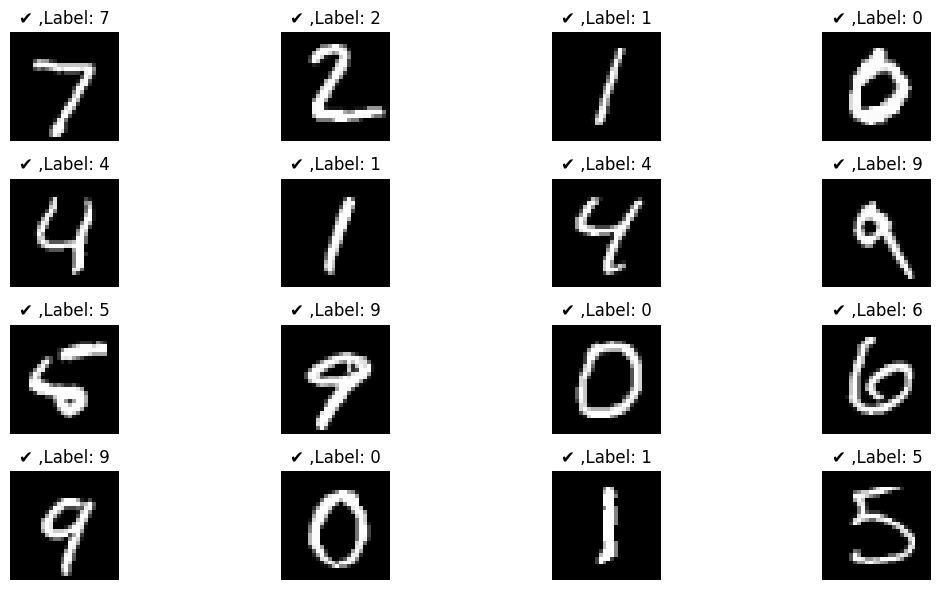

[201,  100] loss : 0.001
[201,  200] loss : 0.001
[201,  300] loss : 0.002
[201,  400] loss : 0.001
[201,  500] loss : 0.001
[201,  600] loss : 0.002
[201,  700] loss : 0.002
[201,  800] loss : 0.002
[201,  900] loss : 0.001
acc =  98.93
[202,  100] loss : 0.001
[202,  200] loss : 0.001
[202,  300] loss : 0.001
[202,  400] loss : 0.001
[202,  500] loss : 0.001
[202,  600] loss : 0.001
[202,  700] loss : 0.002
[202,  800] loss : 0.002
[202,  900] loss : 0.002
acc =  98.9
[203,  100] loss : 0.002
[203,  200] loss : 0.001
[203,  300] loss : 0.001
[203,  400] loss : 0.001
[203,  500] loss : 0.001
[203,  600] loss : 0.002
[203,  700] loss : 0.002
[203,  800] loss : 0.002
[203,  900] loss : 0.002
acc =  98.92
[204,  100] loss : 0.001
[204,  200] loss : 0.001
[204,  300] loss : 0.001
[204,  400] loss : 0.002
[204,  500] loss : 0.001
[204,  600] loss : 0.002
[204,  700] loss : 0.002
[204,  800] loss : 0.001
[204,  900] loss : 0.001
acc =  98.91
[205,  100] loss : 0.001
[205,  200] loss : 0.001

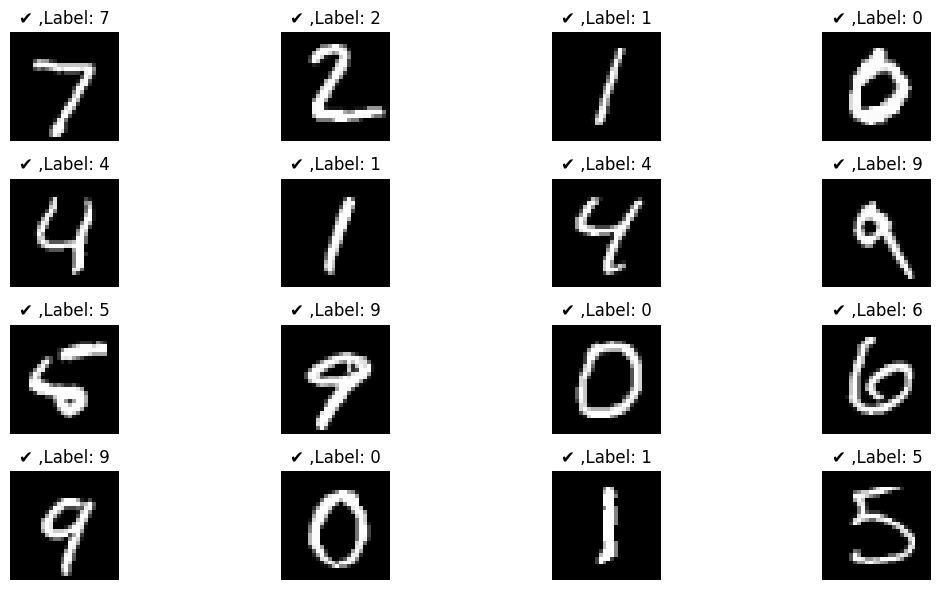

[301,  100] loss : 0.000
[301,  200] loss : 0.000
[301,  300] loss : 0.000
[301,  400] loss : 0.000
[301,  500] loss : 0.000
[301,  600] loss : 0.000
[301,  700] loss : 0.000
[301,  800] loss : 0.000
[301,  900] loss : 0.000
acc =  98.9
[302,  100] loss : 0.000
[302,  200] loss : 0.000
[302,  300] loss : 0.000
[302,  400] loss : 0.000
[302,  500] loss : 0.000
[302,  600] loss : 0.000
[302,  700] loss : 0.000
[302,  800] loss : 0.000
[302,  900] loss : 0.000
acc =  98.93
[303,  100] loss : 0.000
[303,  200] loss : 0.000
[303,  300] loss : 0.000
[303,  400] loss : 0.000
[303,  500] loss : 0.000
[303,  600] loss : 0.000
[303,  700] loss : 0.000
[303,  800] loss : 0.000
[303,  900] loss : 0.000
acc =  98.9
[304,  100] loss : 0.000
[304,  200] loss : 0.000
[304,  300] loss : 0.000
[304,  400] loss : 0.000
[304,  500] loss : 0.000
[304,  600] loss : 0.000
[304,  700] loss : 0.000
[304,  800] loss : 0.000
[304,  900] loss : 0.000
acc =  98.93
[305,  100] loss : 0.000
[305,  200] loss : 0.000


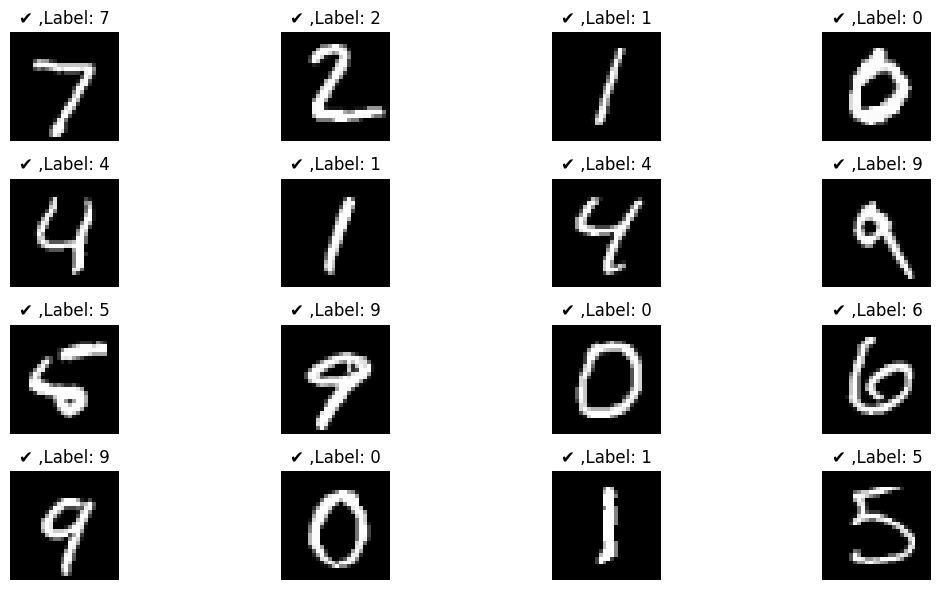

[401,  100] loss : 0.000
[401,  200] loss : 0.000
[401,  300] loss : 0.000
[401,  400] loss : 0.000
[401,  500] loss : 0.000
[401,  600] loss : 0.000
[401,  700] loss : 0.000
[401,  800] loss : 0.000
[401,  900] loss : 0.000
acc =  98.9
[402,  100] loss : 0.000
[402,  200] loss : 0.000
[402,  300] loss : 0.000
[402,  400] loss : 0.000
[402,  500] loss : 0.000
[402,  600] loss : 0.000
[402,  700] loss : 0.000
[402,  800] loss : 0.000
[402,  900] loss : 0.000
acc =  98.9
[403,  100] loss : 0.000
[403,  200] loss : 0.000
[403,  300] loss : 0.000
[403,  400] loss : 0.000
[403,  500] loss : 0.000
[403,  600] loss : 0.000
[403,  700] loss : 0.000
[403,  800] loss : 0.000
[403,  900] loss : 0.000
acc =  98.9
[404,  100] loss : 0.000
[404,  200] loss : 0.000
[404,  300] loss : 0.000
[404,  400] loss : 0.000
[404,  500] loss : 0.000
[404,  600] loss : 0.000
[404,  700] loss : 0.000
[404,  800] loss : 0.000
[404,  900] loss : 0.000
acc =  98.92
[405,  100] loss : 0.000
[405,  200] loss : 0.000
[

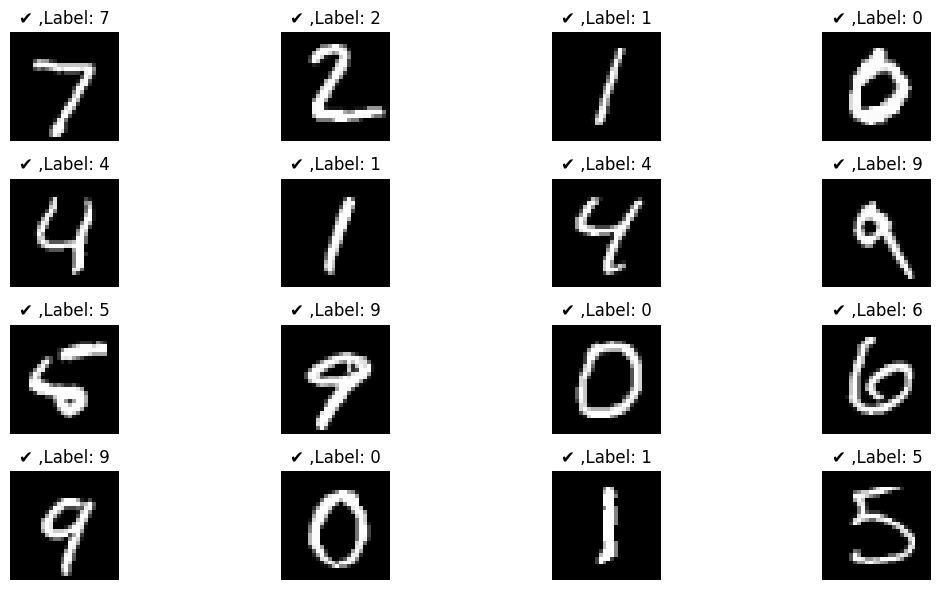

[501,  100] loss : 0.000
[501,  200] loss : 0.000
[501,  300] loss : 0.000
[501,  400] loss : 0.000
[501,  500] loss : 0.000
[501,  600] loss : 0.000
[501,  700] loss : 0.000
[501,  800] loss : 0.000
[501,  900] loss : 0.000
acc =  98.91
[502,  100] loss : 0.000
[502,  200] loss : 0.000
[502,  300] loss : 0.000
[502,  400] loss : 0.000
[502,  500] loss : 0.000
[502,  600] loss : 0.000
[502,  700] loss : 0.000
[502,  800] loss : 0.000
[502,  900] loss : 0.000
acc =  98.91
[503,  100] loss : 0.000
[503,  200] loss : 0.000
[503,  300] loss : 0.000
[503,  400] loss : 0.000
[503,  500] loss : 0.000
[503,  600] loss : 0.000
[503,  700] loss : 0.000
[503,  800] loss : 0.000
[503,  900] loss : 0.000
acc =  98.92
[504,  100] loss : 0.000
[504,  200] loss : 0.000
[504,  300] loss : 0.000
[504,  400] loss : 0.000
[504,  500] loss : 0.000
[504,  600] loss : 0.000
[504,  700] loss : 0.000
[504,  800] loss : 0.000
[504,  900] loss : 0.000
acc =  98.91
[505,  100] loss : 0.000
[505,  200] loss : 0.00

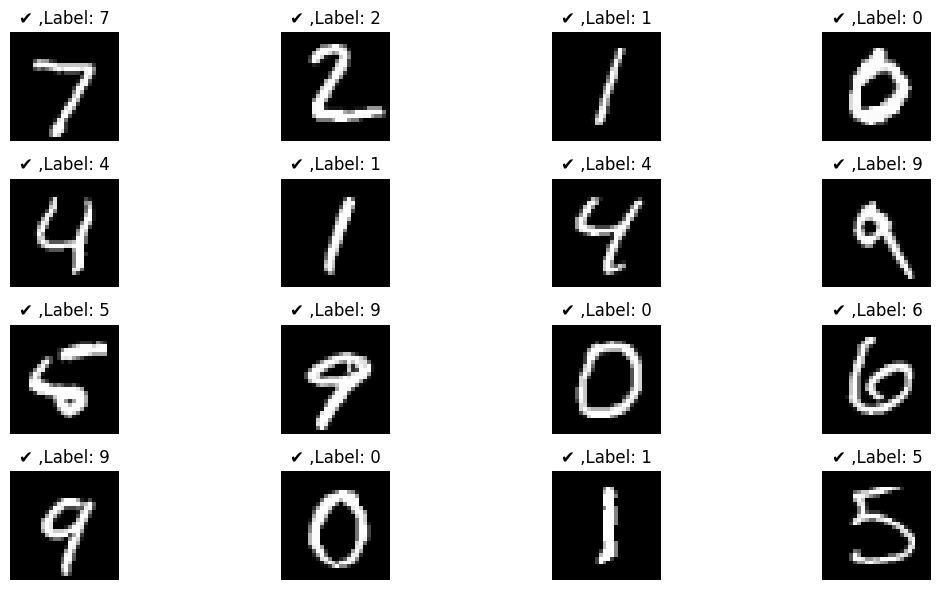

[601,  100] loss : 0.000
[601,  200] loss : 0.000
[601,  300] loss : 0.000
[601,  400] loss : 0.000
[601,  500] loss : 0.000
[601,  600] loss : 0.000
[601,  700] loss : 0.000
[601,  800] loss : 0.000
[601,  900] loss : 0.000
acc =  98.9
[602,  100] loss : 0.000
[602,  200] loss : 0.000
[602,  300] loss : 0.000
[602,  400] loss : 0.000
[602,  500] loss : 0.000
[602,  600] loss : 0.000
[602,  700] loss : 0.000
[602,  800] loss : 0.000
[602,  900] loss : 0.000
acc =  98.9
[603,  100] loss : 0.000
[603,  200] loss : 0.000
[603,  300] loss : 0.000
[603,  400] loss : 0.000
[603,  500] loss : 0.000
[603,  600] loss : 0.000
[603,  700] loss : 0.000
[603,  800] loss : 0.000
[603,  900] loss : 0.000
acc =  98.92
[604,  100] loss : 0.000
[604,  200] loss : 0.000
[604,  300] loss : 0.000
[604,  400] loss : 0.000
[604,  500] loss : 0.000
[604,  600] loss : 0.000
[604,  700] loss : 0.000
[604,  800] loss : 0.000
[604,  900] loss : 0.000
acc =  98.91
[605,  100] loss : 0.000
[605,  200] loss : 0.000


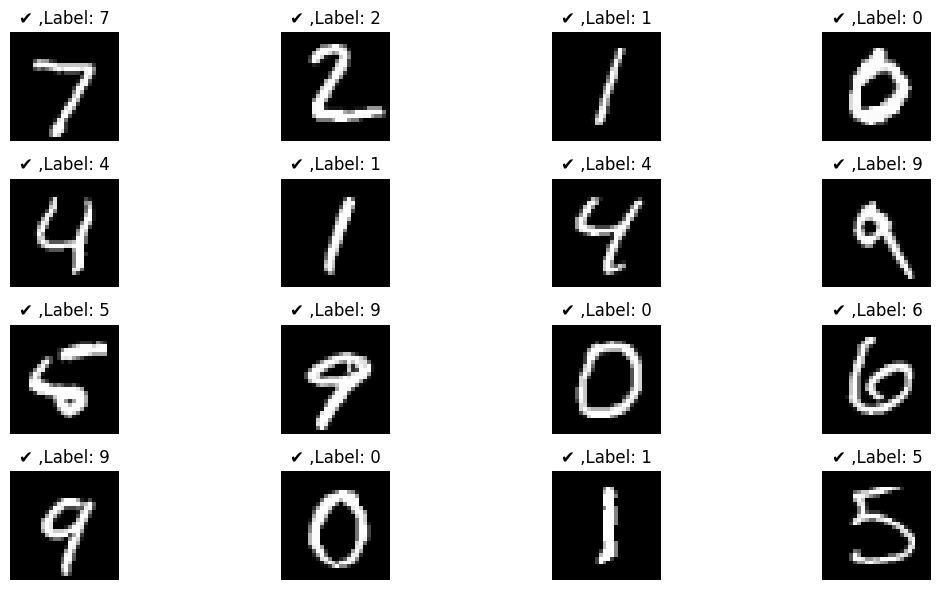

[701,  100] loss : 0.000
[701,  200] loss : 0.000
[701,  300] loss : 0.000
[701,  400] loss : 0.000
[701,  500] loss : 0.000
[701,  600] loss : 0.000
[701,  700] loss : 0.000
[701,  800] loss : 0.000
[701,  900] loss : 0.000
acc =  98.92
[702,  100] loss : 0.000
[702,  200] loss : 0.000
[702,  300] loss : 0.000
[702,  400] loss : 0.000
[702,  500] loss : 0.000
[702,  600] loss : 0.000
[702,  700] loss : 0.000
[702,  800] loss : 0.000
[702,  900] loss : 0.000
acc =  98.89
[703,  100] loss : 0.000
[703,  200] loss : 0.000
[703,  300] loss : 0.000
[703,  400] loss : 0.000
[703,  500] loss : 0.000
[703,  600] loss : 0.000
[703,  700] loss : 0.000
[703,  800] loss : 0.000
[703,  900] loss : 0.000
acc =  98.88
[704,  100] loss : 0.000
[704,  200] loss : 0.000
[704,  300] loss : 0.000
[704,  400] loss : 0.000
[704,  500] loss : 0.000
[704,  600] loss : 0.000
[704,  700] loss : 0.000
[704,  800] loss : 0.000
[704,  900] loss : 0.000
acc =  98.88
[705,  100] loss : 0.000
[705,  200] loss : 0.00

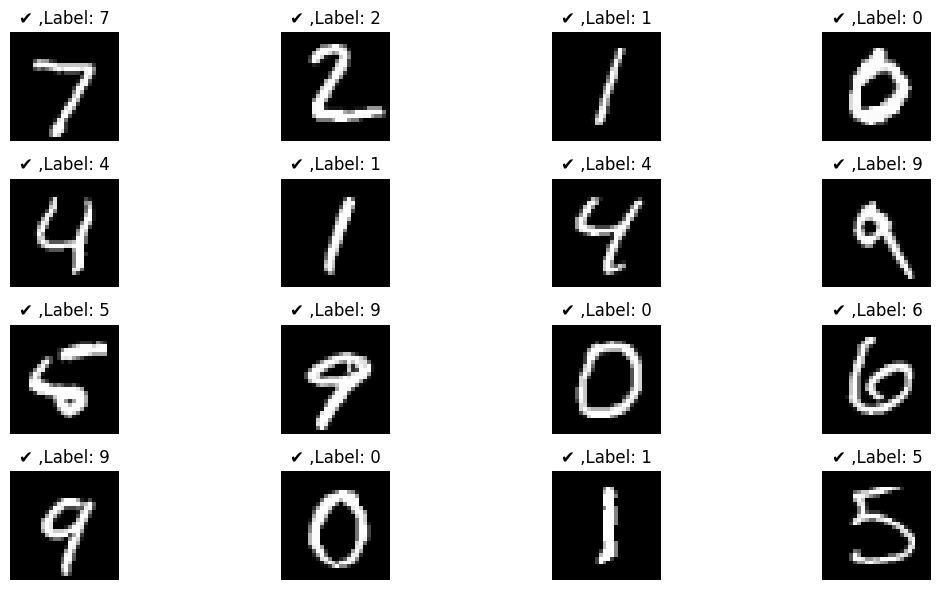

[801,  100] loss : 0.000
[801,  200] loss : 0.000
[801,  300] loss : 0.000
[801,  400] loss : 0.000
[801,  500] loss : 0.000
[801,  600] loss : 0.000
[801,  700] loss : 0.000
[801,  800] loss : 0.000
[801,  900] loss : 0.000
acc =  98.9
[802,  100] loss : 0.000
[802,  200] loss : 0.000
[802,  300] loss : 0.000
[802,  400] loss : 0.000
[802,  500] loss : 0.000
[802,  600] loss : 0.000
[802,  700] loss : 0.000
[802,  800] loss : 0.000
[802,  900] loss : 0.000
acc =  98.89
[803,  100] loss : 0.000
[803,  200] loss : 0.000
[803,  300] loss : 0.000
[803,  400] loss : 0.000
[803,  500] loss : 0.000
[803,  600] loss : 0.000
[803,  700] loss : 0.000
[803,  800] loss : 0.000
[803,  900] loss : 0.000
acc =  98.9
[804,  100] loss : 0.000
[804,  200] loss : 0.000
[804,  300] loss : 0.000
[804,  400] loss : 0.000
[804,  500] loss : 0.000
[804,  600] loss : 0.000
[804,  700] loss : 0.000
[804,  800] loss : 0.000
[804,  900] loss : 0.000
acc =  98.91
[805,  100] loss : 0.000
[805,  200] loss : 0.000


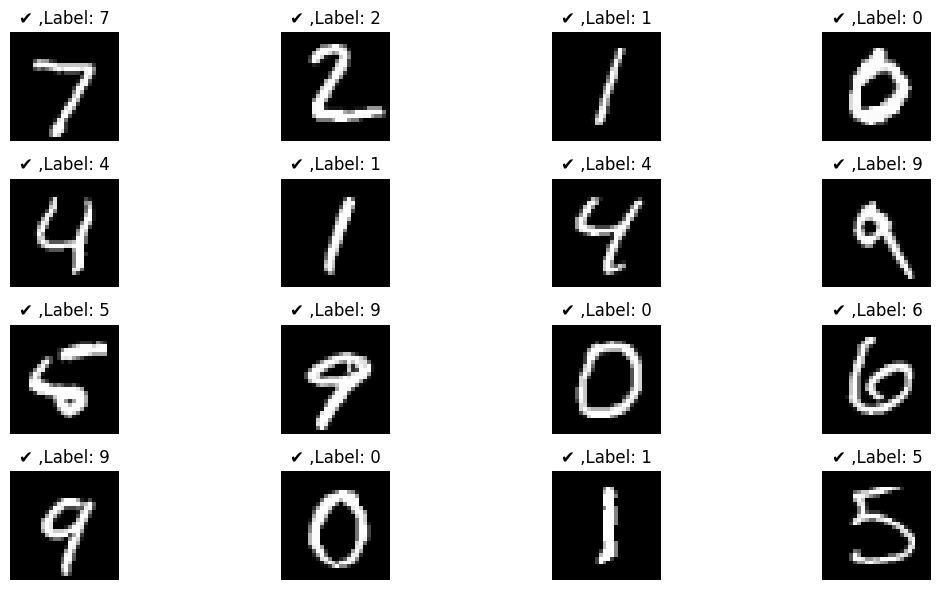

[901,  100] loss : 0.000
[901,  200] loss : 0.000
[901,  300] loss : 0.000
[901,  400] loss : 0.000
[901,  500] loss : 0.000
[901,  600] loss : 0.000
[901,  700] loss : 0.000
[901,  800] loss : 0.000
[901,  900] loss : 0.000
acc =  98.9
[902,  100] loss : 0.000
[902,  200] loss : 0.000
[902,  300] loss : 0.000
[902,  400] loss : 0.000
[902,  500] loss : 0.000
[902,  600] loss : 0.000
[902,  700] loss : 0.000
[902,  800] loss : 0.000
[902,  900] loss : 0.000
acc =  98.91
[903,  100] loss : 0.000
[903,  200] loss : 0.000
[903,  300] loss : 0.000
[903,  400] loss : 0.000
[903,  500] loss : 0.000
[903,  600] loss : 0.000
[903,  700] loss : 0.000
[903,  800] loss : 0.000
[903,  900] loss : 0.000
acc =  98.89
[904,  100] loss : 0.000
[904,  200] loss : 0.000
[904,  300] loss : 0.000
[904,  400] loss : 0.000
[904,  500] loss : 0.000
[904,  600] loss : 0.000
[904,  700] loss : 0.000
[904,  800] loss : 0.000
[904,  900] loss : 0.000
acc =  98.88
[905,  100] loss : 0.000
[905,  200] loss : 0.000

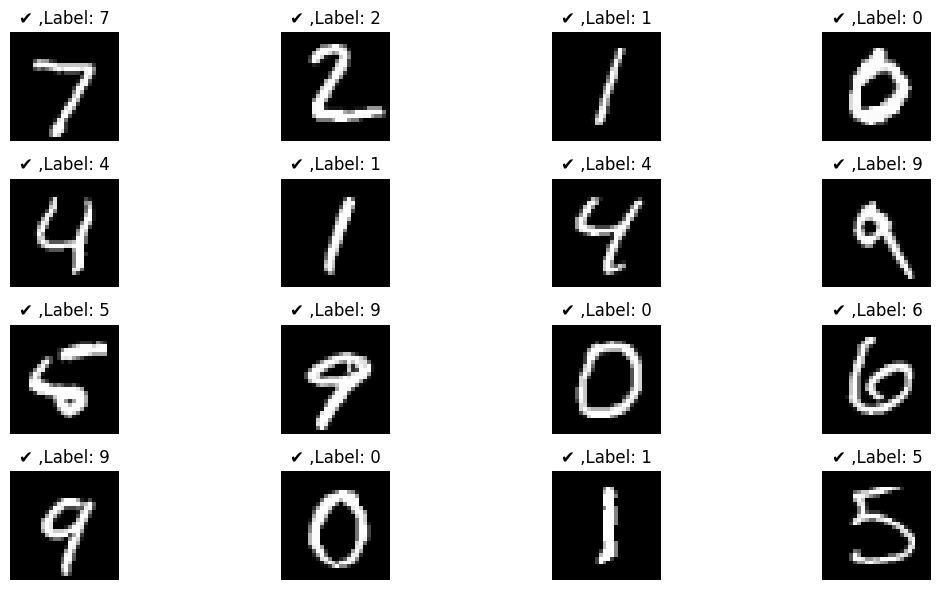

[1001,  100] loss : 0.000
[1001,  200] loss : 0.000
[1001,  300] loss : 0.000
[1001,  400] loss : 0.000
[1001,  500] loss : 0.000
[1001,  600] loss : 0.000
[1001,  700] loss : 0.000
[1001,  800] loss : 0.000
[1001,  900] loss : 0.000
acc =  98.89
[1002,  100] loss : 0.000
[1002,  200] loss : 0.000
[1002,  300] loss : 0.000
[1002,  400] loss : 0.000
[1002,  500] loss : 0.000
[1002,  600] loss : 0.000
[1002,  700] loss : 0.000
[1002,  800] loss : 0.000
[1002,  900] loss : 0.000
acc =  98.9
[1003,  100] loss : 0.000
[1003,  200] loss : 0.000
[1003,  300] loss : 0.000
[1003,  400] loss : 0.000
[1003,  500] loss : 0.000
[1003,  600] loss : 0.000
[1003,  700] loss : 0.000
[1003,  800] loss : 0.000
[1003,  900] loss : 0.000
acc =  98.88
[1004,  100] loss : 0.000
[1004,  200] loss : 0.000
[1004,  300] loss : 0.000
[1004,  400] loss : 0.000
[1004,  500] loss : 0.000
[1004,  600] loss : 0.000
[1004,  700] loss : 0.000
[1004,  800] loss : 0.000
[1004,  900] loss : 0.000
acc =  98.9
[1005,  100] l

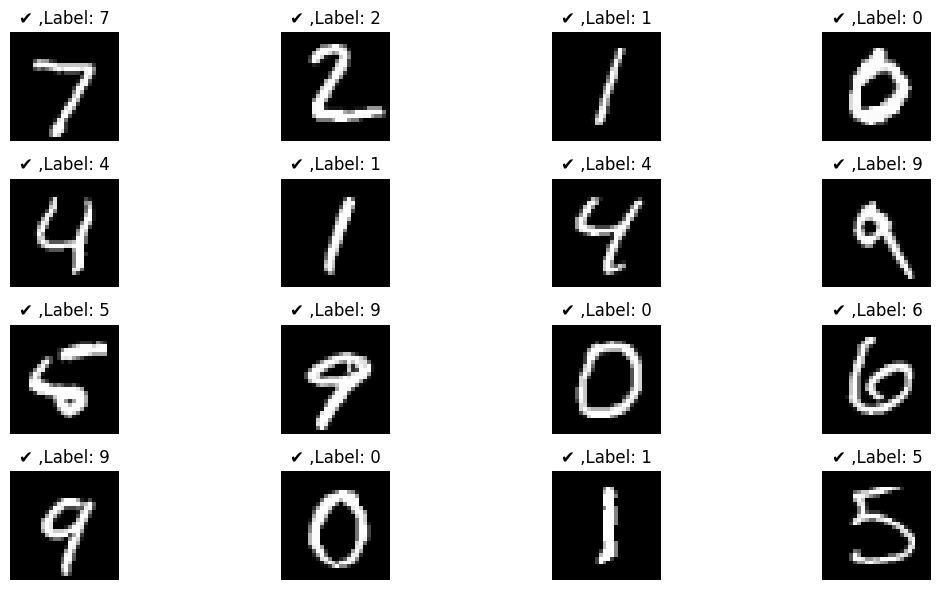

[1101,  100] loss : 0.000
[1101,  200] loss : 0.000
[1101,  300] loss : 0.000
[1101,  400] loss : 0.000
[1101,  500] loss : 0.000
[1101,  600] loss : 0.000
[1101,  700] loss : 0.000
[1101,  800] loss : 0.000
[1101,  900] loss : 0.000
acc =  98.9
[1102,  100] loss : 0.000
[1102,  200] loss : 0.000
[1102,  300] loss : 0.000
[1102,  400] loss : 0.000
[1102,  500] loss : 0.000
[1102,  600] loss : 0.000
[1102,  700] loss : 0.000
[1102,  800] loss : 0.000
[1102,  900] loss : 0.000
acc =  98.9
[1103,  100] loss : 0.000
[1103,  200] loss : 0.000
[1103,  300] loss : 0.000
[1103,  400] loss : 0.000
[1103,  500] loss : 0.000
[1103,  600] loss : 0.000
[1103,  700] loss : 0.000
[1103,  800] loss : 0.000
[1103,  900] loss : 0.000
acc =  98.89
[1104,  100] loss : 0.000
[1104,  200] loss : 0.000
[1104,  300] loss : 0.000
[1104,  400] loss : 0.000
[1104,  500] loss : 0.000
[1104,  600] loss : 0.000
[1104,  700] loss : 0.000
[1104,  800] loss : 0.000
[1104,  900] loss : 0.000
acc =  98.88
[1105,  100] l

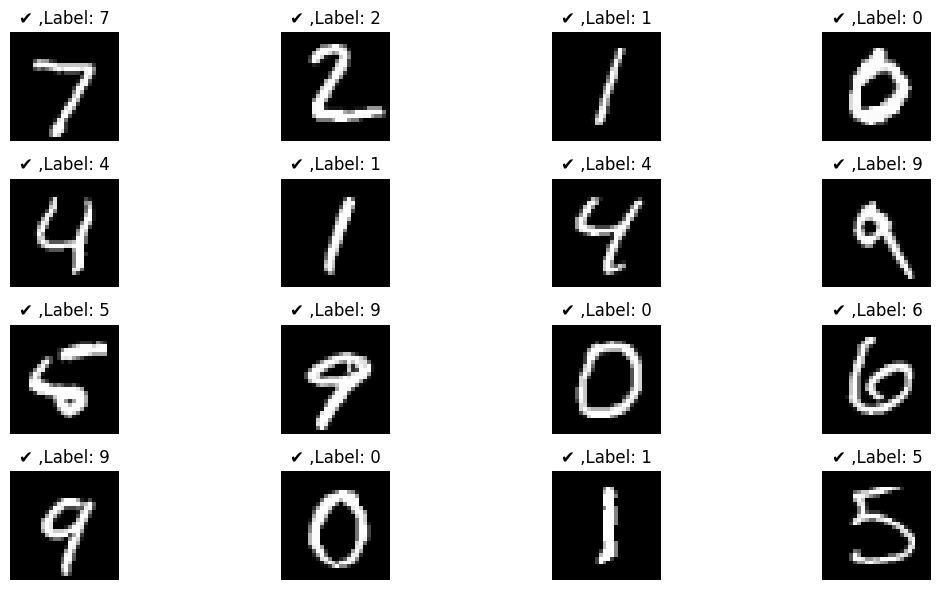

[1201,  100] loss : 0.000
[1201,  200] loss : 0.000
[1201,  300] loss : 0.000
[1201,  400] loss : 0.000
[1201,  500] loss : 0.000
[1201,  600] loss : 0.000
[1201,  700] loss : 0.000
[1201,  800] loss : 0.000
[1201,  900] loss : 0.000
acc =  98.9
[1202,  100] loss : 0.000
[1202,  200] loss : 0.000
[1202,  300] loss : 0.000
[1202,  400] loss : 0.000
[1202,  500] loss : 0.000
[1202,  600] loss : 0.000
[1202,  700] loss : 0.000
[1202,  800] loss : 0.000
[1202,  900] loss : 0.000
acc =  98.9
[1203,  100] loss : 0.000
[1203,  200] loss : 0.000
[1203,  300] loss : 0.000
[1203,  400] loss : 0.000
[1203,  500] loss : 0.000
[1203,  600] loss : 0.000
[1203,  700] loss : 0.000
[1203,  800] loss : 0.000
[1203,  900] loss : 0.000
acc =  98.9
[1204,  100] loss : 0.000
[1204,  200] loss : 0.000
[1204,  300] loss : 0.000
[1204,  400] loss : 0.000
[1204,  500] loss : 0.000
[1204,  600] loss : 0.000
[1204,  700] loss : 0.000
[1204,  800] loss : 0.000
[1204,  900] loss : 0.000
acc =  98.9
[1205,  100] los

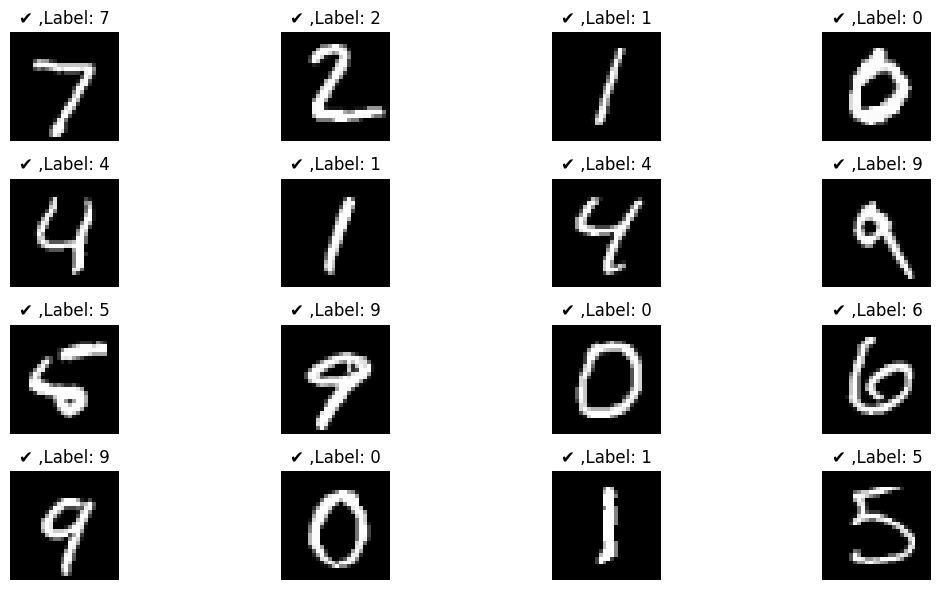

[1301,  100] loss : 0.000
[1301,  200] loss : 0.000
[1301,  300] loss : 0.000
[1301,  400] loss : 0.000
[1301,  500] loss : 0.000
[1301,  600] loss : 0.000
[1301,  700] loss : 0.000
[1301,  800] loss : 0.000
[1301,  900] loss : 0.000
acc =  98.88
[1302,  100] loss : 0.000
[1302,  200] loss : 0.000
[1302,  300] loss : 0.000
[1302,  400] loss : 0.000
[1302,  500] loss : 0.000
[1302,  600] loss : 0.000
[1302,  700] loss : 0.000
[1302,  800] loss : 0.000
[1302,  900] loss : 0.000
acc =  98.9
[1303,  100] loss : 0.000
[1303,  200] loss : 0.000
[1303,  300] loss : 0.000
[1303,  400] loss : 0.000
[1303,  500] loss : 0.000
[1303,  600] loss : 0.000
[1303,  700] loss : 0.000
[1303,  800] loss : 0.000
[1303,  900] loss : 0.000
acc =  98.9
[1304,  100] loss : 0.000
[1304,  200] loss : 0.000
[1304,  300] loss : 0.000
[1304,  400] loss : 0.000
[1304,  500] loss : 0.000
[1304,  600] loss : 0.000
[1304,  700] loss : 0.000
[1304,  800] loss : 0.000
[1304,  900] loss : 0.000
acc =  98.9
[1305,  100] lo

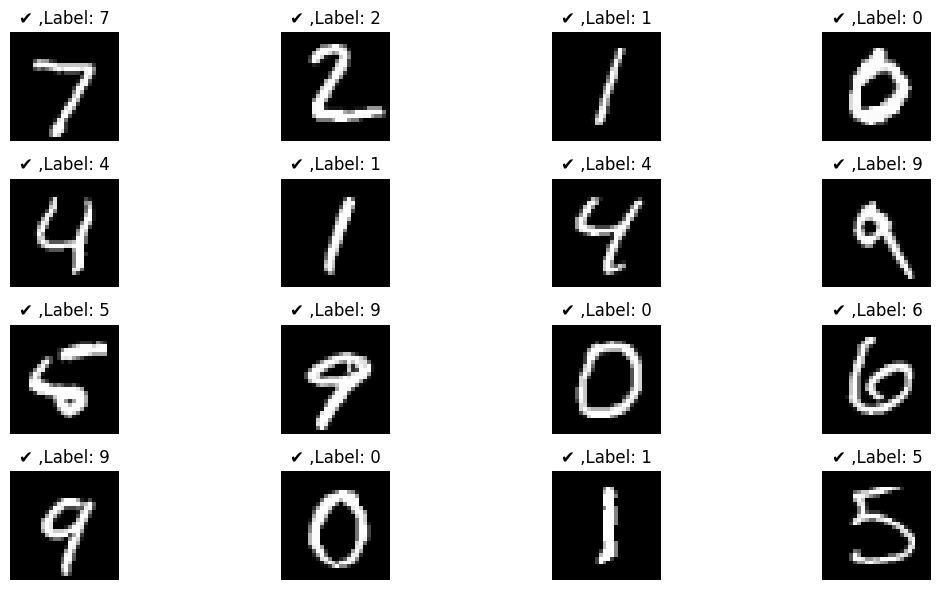

[1401,  100] loss : 0.000
[1401,  200] loss : 0.000
[1401,  300] loss : 0.000
[1401,  400] loss : 0.000
[1401,  500] loss : 0.000
[1401,  600] loss : 0.000
[1401,  700] loss : 0.000
[1401,  800] loss : 0.000
[1401,  900] loss : 0.000
acc =  98.89
[1402,  100] loss : 0.000
[1402,  200] loss : 0.000
[1402,  300] loss : 0.000
[1402,  400] loss : 0.000
[1402,  500] loss : 0.000
[1402,  600] loss : 0.000
[1402,  700] loss : 0.000
[1402,  800] loss : 0.000
[1402,  900] loss : 0.000
acc =  98.87
[1403,  100] loss : 0.000
[1403,  200] loss : 0.000
[1403,  300] loss : 0.000
[1403,  400] loss : 0.000
[1403,  500] loss : 0.000
[1403,  600] loss : 0.000
[1403,  700] loss : 0.000
[1403,  800] loss : 0.000
[1403,  900] loss : 0.000
acc =  98.88
[1404,  100] loss : 0.000
[1404,  200] loss : 0.000
[1404,  300] loss : 0.000
[1404,  400] loss : 0.000
[1404,  500] loss : 0.000
[1404,  600] loss : 0.000
[1404,  700] loss : 0.000
[1404,  800] loss : 0.000
[1404,  900] loss : 0.000
acc =  98.88
[1405,  100]

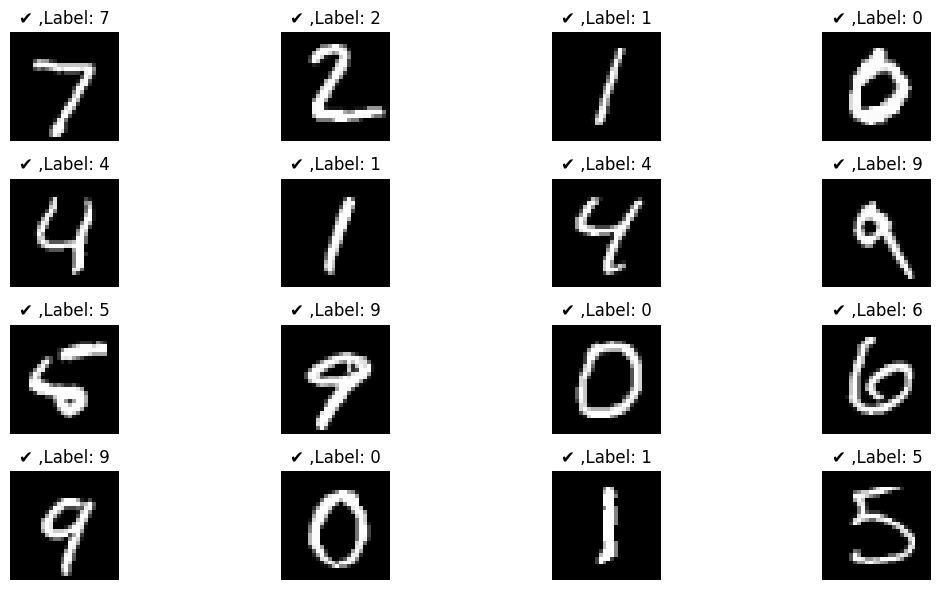

[1501,  100] loss : 0.000
[1501,  200] loss : 0.000
[1501,  300] loss : 0.000
[1501,  400] loss : 0.000
[1501,  500] loss : 0.000
[1501,  600] loss : 0.000
[1501,  700] loss : 0.000
[1501,  800] loss : 0.000
[1501,  900] loss : 0.000
acc =  98.89
[1502,  100] loss : 0.000
[1502,  200] loss : 0.000
[1502,  300] loss : 0.000
[1502,  400] loss : 0.000
[1502,  500] loss : 0.000
[1502,  600] loss : 0.000
[1502,  700] loss : 0.000
[1502,  800] loss : 0.000
[1502,  900] loss : 0.000
acc =  98.87
[1503,  100] loss : 0.000
[1503,  200] loss : 0.000
[1503,  300] loss : 0.000
[1503,  400] loss : 0.000
[1503,  500] loss : 0.000
[1503,  600] loss : 0.000
[1503,  700] loss : 0.000
[1503,  800] loss : 0.000
[1503,  900] loss : 0.000
acc =  98.89
[1504,  100] loss : 0.000
[1504,  200] loss : 0.000
[1504,  300] loss : 0.000
[1504,  400] loss : 0.000
[1504,  500] loss : 0.000
[1504,  600] loss : 0.000
[1504,  700] loss : 0.000
[1504,  800] loss : 0.000
[1504,  900] loss : 0.000
acc =  98.87
[1505,  100]

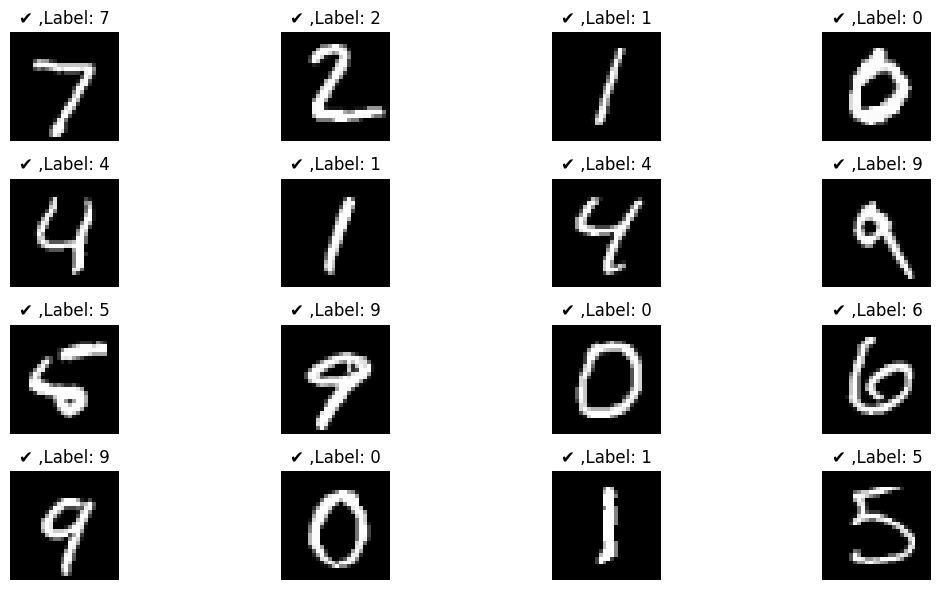

[1601,  100] loss : 0.000
[1601,  200] loss : 0.000
[1601,  300] loss : 0.000
[1601,  400] loss : 0.000
[1601,  500] loss : 0.000
[1601,  600] loss : 0.000
[1601,  700] loss : 0.000
[1601,  800] loss : 0.000
[1601,  900] loss : 0.000
acc =  98.89
[1602,  100] loss : 0.000
[1602,  200] loss : 0.000
[1602,  300] loss : 0.000
[1602,  400] loss : 0.000
[1602,  500] loss : 0.000
[1602,  600] loss : 0.000
[1602,  700] loss : 0.000
[1602,  800] loss : 0.000
[1602,  900] loss : 0.000
acc =  98.89
[1603,  100] loss : 0.000
[1603,  200] loss : 0.000
[1603,  300] loss : 0.000
[1603,  400] loss : 0.000
[1603,  500] loss : 0.000
[1603,  600] loss : 0.000
[1603,  700] loss : 0.000
[1603,  800] loss : 0.000
[1603,  900] loss : 0.000
acc =  98.88
[1604,  100] loss : 0.000
[1604,  200] loss : 0.000
[1604,  300] loss : 0.000
[1604,  400] loss : 0.000
[1604,  500] loss : 0.000
[1604,  600] loss : 0.000
[1604,  700] loss : 0.000
[1604,  800] loss : 0.000
[1604,  900] loss : 0.000
acc =  98.88
[1605,  100]

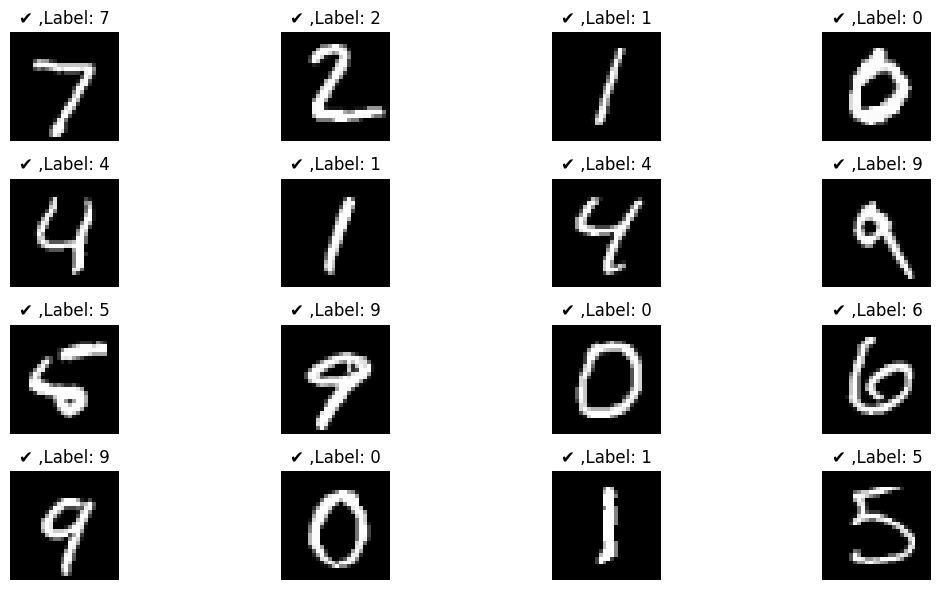

[1701,  100] loss : 0.000
[1701,  200] loss : 0.000
[1701,  300] loss : 0.000
[1701,  400] loss : 0.000
[1701,  500] loss : 0.000
[1701,  600] loss : 0.000
[1701,  700] loss : 0.000
[1701,  800] loss : 0.000
[1701,  900] loss : 0.000
acc =  98.87
[1702,  100] loss : 0.000
[1702,  200] loss : 0.000
[1702,  300] loss : 0.000
[1702,  400] loss : 0.000
[1702,  500] loss : 0.000
[1702,  600] loss : 0.000
[1702,  700] loss : 0.000
[1702,  800] loss : 0.000
[1702,  900] loss : 0.000
acc =  98.89
[1703,  100] loss : 0.000
[1703,  200] loss : 0.000
[1703,  300] loss : 0.000
[1703,  400] loss : 0.000
[1703,  500] loss : 0.000
[1703,  600] loss : 0.000
[1703,  700] loss : 0.000
[1703,  800] loss : 0.000
[1703,  900] loss : 0.000
acc =  98.89
[1704,  100] loss : 0.000
[1704,  200] loss : 0.000
[1704,  300] loss : 0.000
[1704,  400] loss : 0.000
[1704,  500] loss : 0.000
[1704,  600] loss : 0.000
[1704,  700] loss : 0.000
[1704,  800] loss : 0.000
[1704,  900] loss : 0.000
acc =  98.87
[1705,  100]

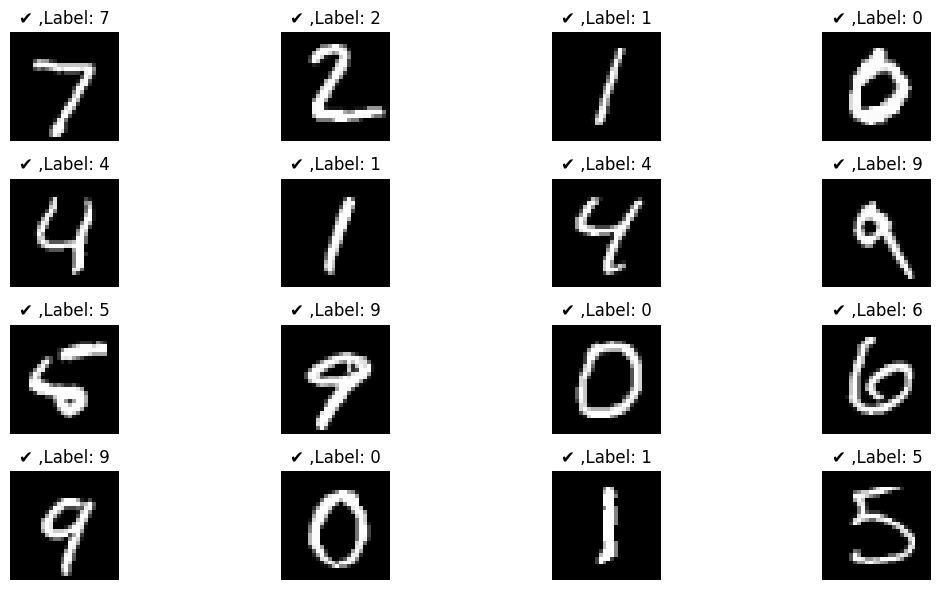

[1801,  100] loss : 0.000
[1801,  200] loss : 0.000
[1801,  300] loss : 0.000
[1801,  400] loss : 0.000
[1801,  500] loss : 0.000
[1801,  600] loss : 0.000
[1801,  700] loss : 0.000
[1801,  800] loss : 0.000
[1801,  900] loss : 0.000
acc =  98.88
[1802,  100] loss : 0.000
[1802,  200] loss : 0.000
[1802,  300] loss : 0.000
[1802,  400] loss : 0.000
[1802,  500] loss : 0.000
[1802,  600] loss : 0.000
[1802,  700] loss : 0.000
[1802,  800] loss : 0.000
[1802,  900] loss : 0.000
acc =  98.88
[1803,  100] loss : 0.000
[1803,  200] loss : 0.000
[1803,  300] loss : 0.000
[1803,  400] loss : 0.000
[1803,  500] loss : 0.000
[1803,  600] loss : 0.000
[1803,  700] loss : 0.000
[1803,  800] loss : 0.000
[1803,  900] loss : 0.000
acc =  98.87
[1804,  100] loss : 0.000
[1804,  200] loss : 0.000
[1804,  300] loss : 0.000
[1804,  400] loss : 0.000
[1804,  500] loss : 0.000
[1804,  600] loss : 0.000
[1804,  700] loss : 0.000
[1804,  800] loss : 0.000
[1804,  900] loss : 0.000
acc =  98.87
[1805,  100]

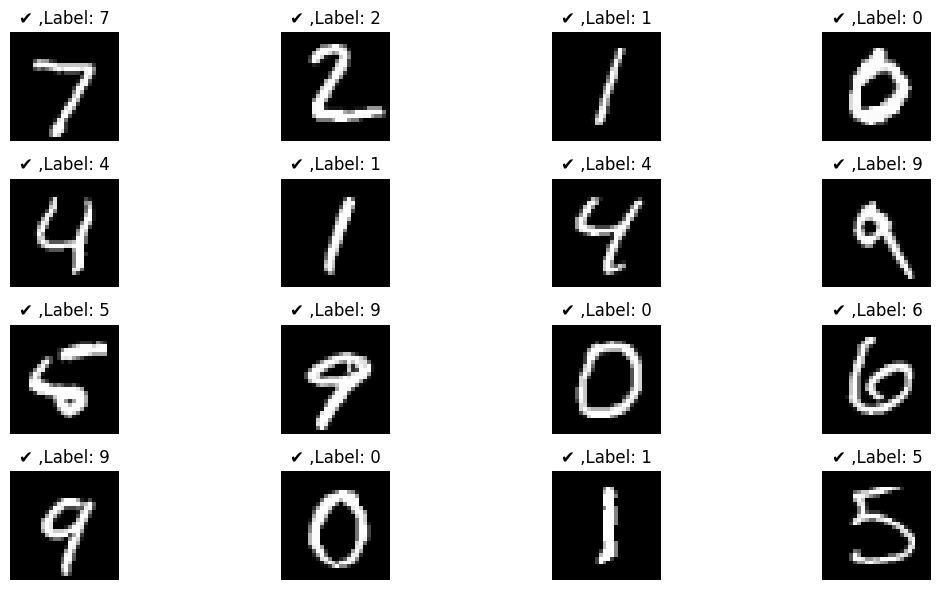

[1901,  100] loss : 0.000
[1901,  200] loss : 0.000
[1901,  300] loss : 0.000
[1901,  400] loss : 0.000
[1901,  500] loss : 0.000
[1901,  600] loss : 0.000
[1901,  700] loss : 0.000
[1901,  800] loss : 0.000
[1901,  900] loss : 0.000
acc =  98.87
[1902,  100] loss : 0.000
[1902,  200] loss : 0.000
[1902,  300] loss : 0.000
[1902,  400] loss : 0.000
[1902,  500] loss : 0.000
[1902,  600] loss : 0.000
[1902,  700] loss : 0.000
[1902,  800] loss : 0.000
[1902,  900] loss : 0.000
acc =  98.87
[1903,  100] loss : 0.000
[1903,  200] loss : 0.000
[1903,  300] loss : 0.000
[1903,  400] loss : 0.000
[1903,  500] loss : 0.000
[1903,  600] loss : 0.000
[1903,  700] loss : 0.000
[1903,  800] loss : 0.000
[1903,  900] loss : 0.000
acc =  98.86
[1904,  100] loss : 0.000
[1904,  200] loss : 0.000
[1904,  300] loss : 0.000
[1904,  400] loss : 0.000
[1904,  500] loss : 0.000
[1904,  600] loss : 0.000
[1904,  700] loss : 0.000
[1904,  800] loss : 0.000
[1904,  900] loss : 0.000
acc =  98.87
[1905,  100]

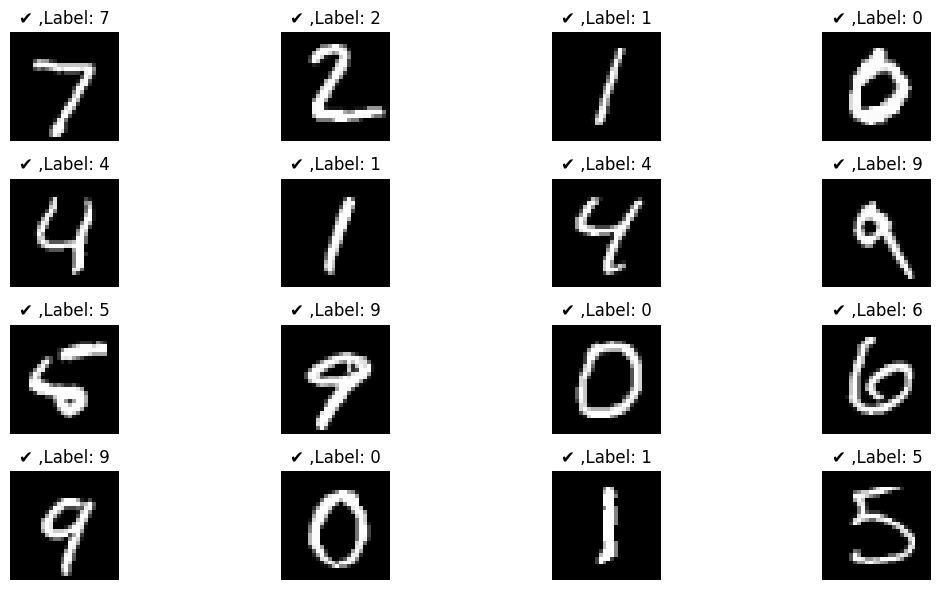

[2001,  100] loss : 0.000
[2001,  200] loss : 0.000
[2001,  300] loss : 0.000
[2001,  400] loss : 0.000
[2001,  500] loss : 0.000
[2001,  600] loss : 0.000
[2001,  700] loss : 0.000
[2001,  800] loss : 0.000
[2001,  900] loss : 0.000
acc =  98.87
[2002,  100] loss : 0.000
[2002,  200] loss : 0.000
[2002,  300] loss : 0.000
[2002,  400] loss : 0.000
[2002,  500] loss : 0.000
[2002,  600] loss : 0.000
[2002,  700] loss : 0.000
[2002,  800] loss : 0.000
[2002,  900] loss : 0.000
acc =  98.88
[2003,  100] loss : 0.000
[2003,  200] loss : 0.000
[2003,  300] loss : 0.000
[2003,  400] loss : 0.000
[2003,  500] loss : 0.000
[2003,  600] loss : 0.000
[2003,  700] loss : 0.000
[2003,  800] loss : 0.000
[2003,  900] loss : 0.000
acc =  98.86
[2004,  100] loss : 0.000
[2004,  200] loss : 0.000
[2004,  300] loss : 0.000
[2004,  400] loss : 0.000
[2004,  500] loss : 0.000
[2004,  600] loss : 0.000
[2004,  700] loss : 0.000
[2004,  800] loss : 0.000
[2004,  900] loss : 0.000
acc =  98.87
[2005,  100]

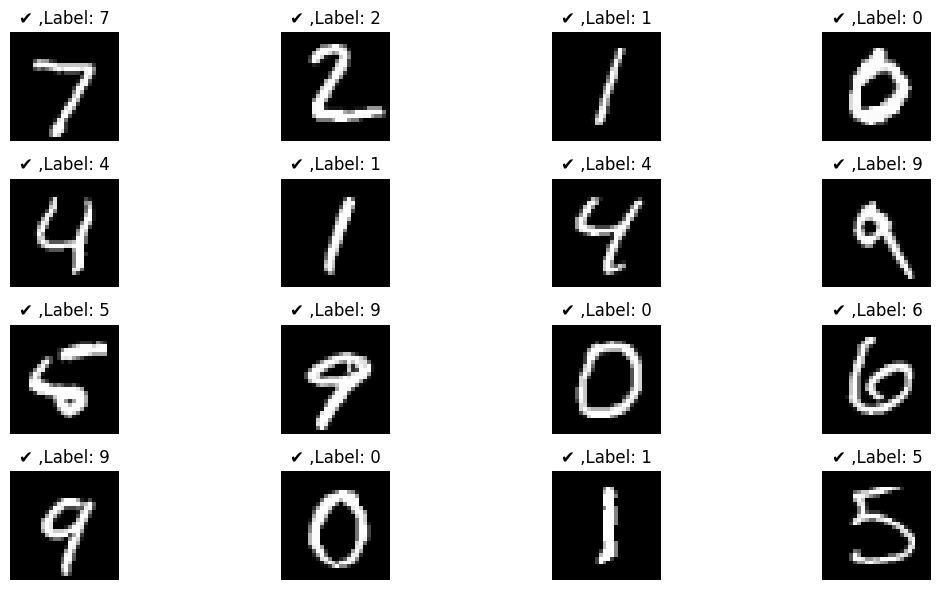

[2101,  100] loss : 0.000
[2101,  200] loss : 0.000
[2101,  300] loss : 0.000
[2101,  400] loss : 0.000
[2101,  500] loss : 0.000
[2101,  600] loss : 0.000
[2101,  700] loss : 0.000
[2101,  800] loss : 0.000
[2101,  900] loss : 0.000
acc =  98.85
[2102,  100] loss : 0.000
[2102,  200] loss : 0.000
[2102,  300] loss : 0.000
[2102,  400] loss : 0.000
[2102,  500] loss : 0.000
[2102,  600] loss : 0.000
[2102,  700] loss : 0.000
[2102,  800] loss : 0.000
[2102,  900] loss : 0.000
acc =  98.87
[2103,  100] loss : 0.000
[2103,  200] loss : 0.000
[2103,  300] loss : 0.000
[2103,  400] loss : 0.000
[2103,  500] loss : 0.000
[2103,  600] loss : 0.000
[2103,  700] loss : 0.000
[2103,  800] loss : 0.000
[2103,  900] loss : 0.000
acc =  98.87
[2104,  100] loss : 0.000
[2104,  200] loss : 0.000
[2104,  300] loss : 0.000
[2104,  400] loss : 0.000
[2104,  500] loss : 0.000
[2104,  600] loss : 0.000
[2104,  700] loss : 0.000
[2104,  800] loss : 0.000
[2104,  900] loss : 0.000
acc =  98.86
[2105,  100]

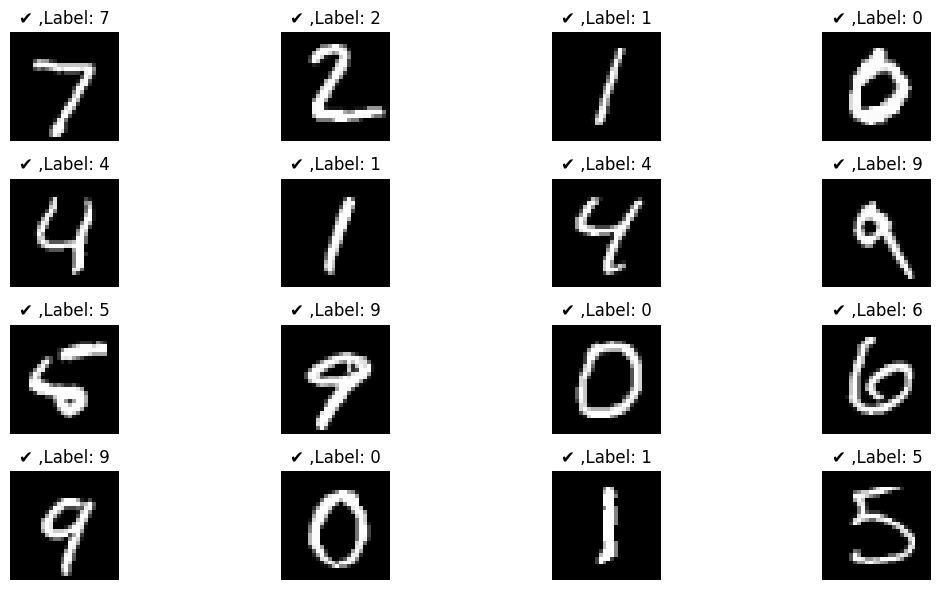

[2201,  100] loss : 0.000
[2201,  200] loss : 0.000
[2201,  300] loss : 0.000
[2201,  400] loss : 0.000
[2201,  500] loss : 0.000
[2201,  600] loss : 0.000
[2201,  700] loss : 0.000
[2201,  800] loss : 0.000
[2201,  900] loss : 0.000
acc =  98.85
[2202,  100] loss : 0.000
[2202,  200] loss : 0.000
[2202,  300] loss : 0.000
[2202,  400] loss : 0.000
[2202,  500] loss : 0.000
[2202,  600] loss : 0.000
[2202,  700] loss : 0.000
[2202,  800] loss : 0.000
[2202,  900] loss : 0.000
acc =  98.87
[2203,  100] loss : 0.000
[2203,  200] loss : 0.000
[2203,  300] loss : 0.000
[2203,  400] loss : 0.000
[2203,  500] loss : 0.000
[2203,  600] loss : 0.000
[2203,  700] loss : 0.000
[2203,  800] loss : 0.000
[2203,  900] loss : 0.000
acc =  98.85
[2204,  100] loss : 0.000
[2204,  200] loss : 0.000
[2204,  300] loss : 0.000
[2204,  400] loss : 0.000
[2204,  500] loss : 0.000
[2204,  600] loss : 0.000
[2204,  700] loss : 0.000
[2204,  800] loss : 0.000
[2204,  900] loss : 0.000
acc =  98.85
[2205,  100]

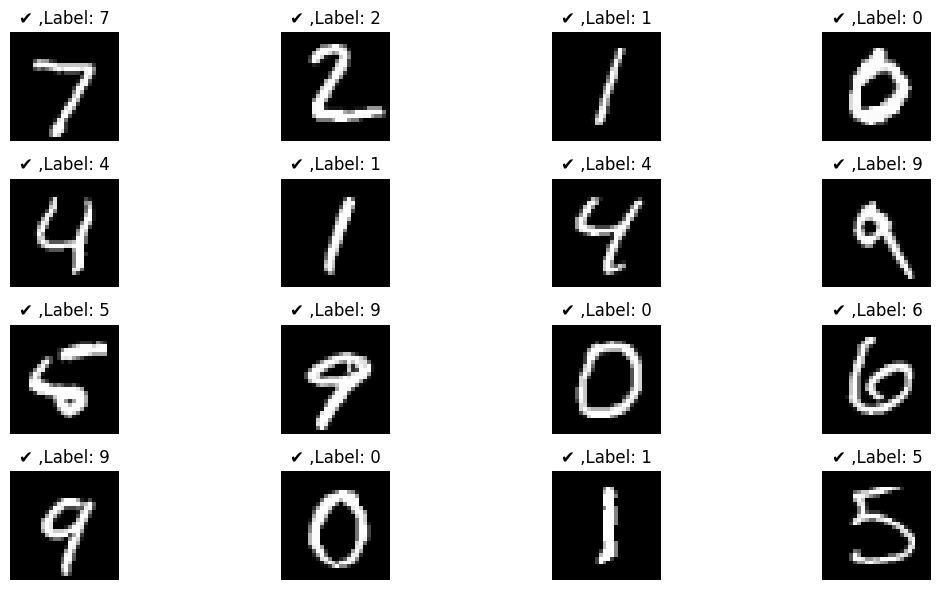

[2301,  100] loss : 0.000
[2301,  200] loss : 0.000
[2301,  300] loss : 0.000
[2301,  400] loss : 0.000
[2301,  500] loss : 0.000
[2301,  600] loss : 0.000
[2301,  700] loss : 0.000
[2301,  800] loss : 0.000
[2301,  900] loss : 0.000
acc =  98.86
[2302,  100] loss : 0.000
[2302,  200] loss : 0.000
[2302,  300] loss : 0.000
[2302,  400] loss : 0.000
[2302,  500] loss : 0.000
[2302,  600] loss : 0.000
[2302,  700] loss : 0.000
[2302,  800] loss : 0.000
[2302,  900] loss : 0.000
acc =  98.87
[2303,  100] loss : 0.000
[2303,  200] loss : 0.000
[2303,  300] loss : 0.000
[2303,  400] loss : 0.000
[2303,  500] loss : 0.000
[2303,  600] loss : 0.000
[2303,  700] loss : 0.000
[2303,  800] loss : 0.000
[2303,  900] loss : 0.000
acc =  98.87
[2304,  100] loss : 0.000
[2304,  200] loss : 0.000
[2304,  300] loss : 0.000
[2304,  400] loss : 0.000
[2304,  500] loss : 0.000
[2304,  600] loss : 0.000
[2304,  700] loss : 0.000
[2304,  800] loss : 0.000
[2304,  900] loss : 0.000
acc =  98.86
[2305,  100]

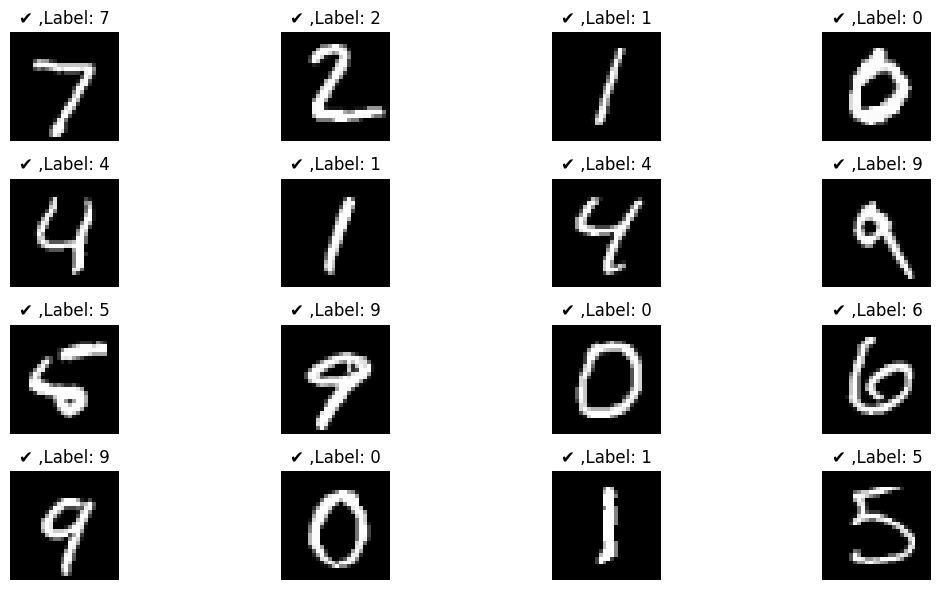

[2401,  100] loss : 0.000
[2401,  200] loss : 0.000
[2401,  300] loss : 0.000
[2401,  400] loss : 0.000
[2401,  500] loss : 0.000
[2401,  600] loss : 0.000
[2401,  700] loss : 0.000
[2401,  800] loss : 0.000
[2401,  900] loss : 0.000
acc =  98.86
[2402,  100] loss : 0.000
[2402,  200] loss : 0.000
[2402,  300] loss : 0.000
[2402,  400] loss : 0.000
[2402,  500] loss : 0.000
[2402,  600] loss : 0.000
[2402,  700] loss : 0.000
[2402,  800] loss : 0.000
[2402,  900] loss : 0.000
acc =  98.86
[2403,  100] loss : 0.000
[2403,  200] loss : 0.000
[2403,  300] loss : 0.000
[2403,  400] loss : 0.000
[2403,  500] loss : 0.000
[2403,  600] loss : 0.000
[2403,  700] loss : 0.000
[2403,  800] loss : 0.000
[2403,  900] loss : 0.000
acc =  98.86
[2404,  100] loss : 0.000
[2404,  200] loss : 0.000
[2404,  300] loss : 0.000
[2404,  400] loss : 0.000
[2404,  500] loss : 0.000
[2404,  600] loss : 0.000
[2404,  700] loss : 0.000
[2404,  800] loss : 0.000
[2404,  900] loss : 0.000
acc =  98.86
[2405,  100]

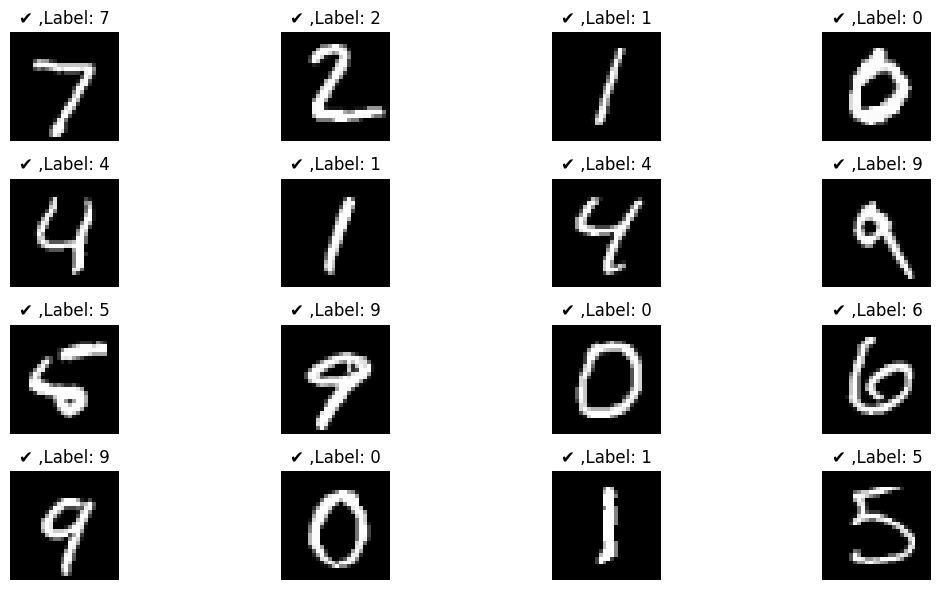

[2501,  100] loss : 0.000
[2501,  200] loss : 0.000
[2501,  300] loss : 0.000
[2501,  400] loss : 0.000
[2501,  500] loss : 0.000
[2501,  600] loss : 0.000
[2501,  700] loss : 0.000
[2501,  800] loss : 0.000
[2501,  900] loss : 0.000
acc =  98.86
[2502,  100] loss : 0.000
[2502,  200] loss : 0.000
[2502,  300] loss : 0.000
[2502,  400] loss : 0.000
[2502,  500] loss : 0.000
[2502,  600] loss : 0.000
[2502,  700] loss : 0.000
[2502,  800] loss : 0.000
[2502,  900] loss : 0.000
acc =  98.86
[2503,  100] loss : 0.000
[2503,  200] loss : 0.000
[2503,  300] loss : 0.000
[2503,  400] loss : 0.000
[2503,  500] loss : 0.000
[2503,  600] loss : 0.000
[2503,  700] loss : 0.000
[2503,  800] loss : 0.000
[2503,  900] loss : 0.000
acc =  98.86
[2504,  100] loss : 0.000
[2504,  200] loss : 0.000
[2504,  300] loss : 0.000
[2504,  400] loss : 0.000
[2504,  500] loss : 0.000
[2504,  600] loss : 0.000
[2504,  700] loss : 0.000
[2504,  800] loss : 0.000
[2504,  900] loss : 0.000
acc =  98.88
[2505,  100]

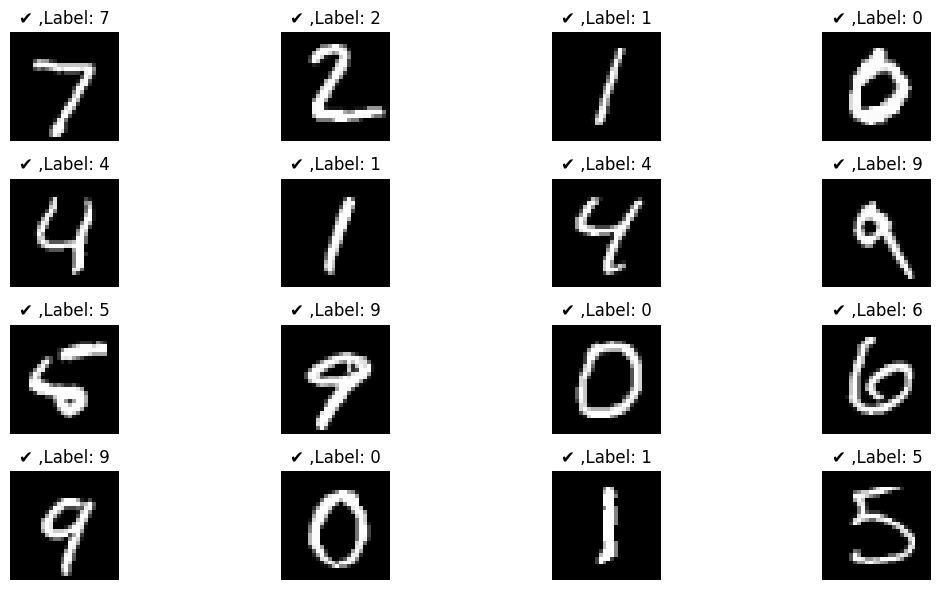

[2601,  100] loss : 0.000
[2601,  200] loss : 0.000
[2601,  300] loss : 0.000
[2601,  400] loss : 0.000
[2601,  500] loss : 0.000
[2601,  600] loss : 0.000
[2601,  700] loss : 0.000
[2601,  800] loss : 0.000
[2601,  900] loss : 0.000
acc =  98.86
[2602,  100] loss : 0.000
[2602,  200] loss : 0.000
[2602,  300] loss : 0.000
[2602,  400] loss : 0.000
[2602,  500] loss : 0.000
[2602,  600] loss : 0.000
[2602,  700] loss : 0.000
[2602,  800] loss : 0.000
[2602,  900] loss : 0.000
acc =  98.85
[2603,  100] loss : 0.000
[2603,  200] loss : 0.000
[2603,  300] loss : 0.000
[2603,  400] loss : 0.000
[2603,  500] loss : 0.000
[2603,  600] loss : 0.000
[2603,  700] loss : 0.000
[2603,  800] loss : 0.000
[2603,  900] loss : 0.000
acc =  98.87
[2604,  100] loss : 0.000
[2604,  200] loss : 0.000
[2604,  300] loss : 0.000
[2604,  400] loss : 0.000
[2604,  500] loss : 0.000
[2604,  600] loss : 0.000
[2604,  700] loss : 0.000
[2604,  800] loss : 0.000
[2604,  900] loss : 0.000
acc =  98.87
[2605,  100]

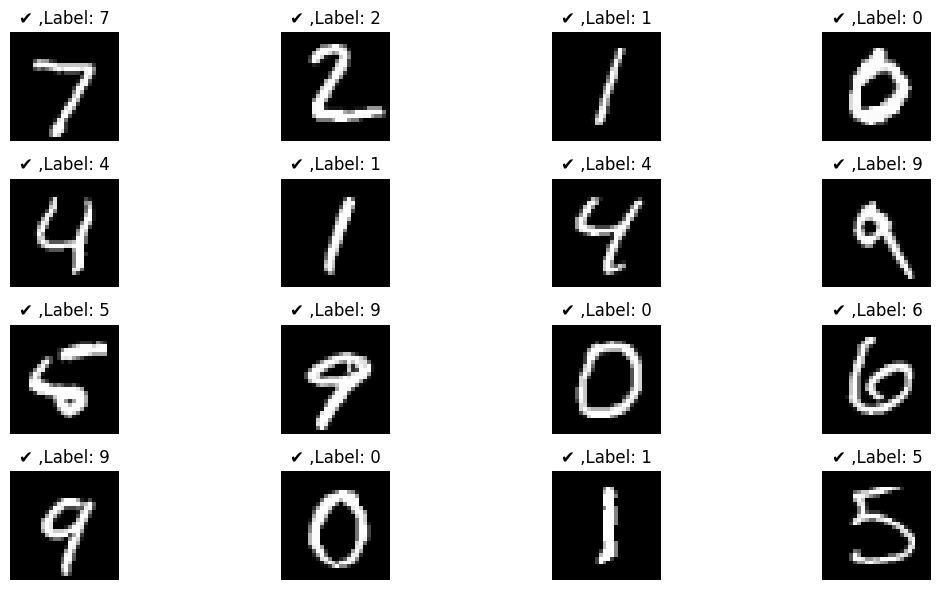

[2701,  100] loss : 0.000
[2701,  200] loss : 0.000
[2701,  300] loss : 0.000
[2701,  400] loss : 0.000
[2701,  500] loss : 0.000
[2701,  600] loss : 0.000
[2701,  700] loss : 0.000
[2701,  800] loss : 0.000
[2701,  900] loss : 0.000
acc =  98.87
[2702,  100] loss : 0.000
[2702,  200] loss : 0.000
[2702,  300] loss : 0.000
[2702,  400] loss : 0.000
[2702,  500] loss : 0.000
[2702,  600] loss : 0.000
[2702,  700] loss : 0.000
[2702,  800] loss : 0.000
[2702,  900] loss : 0.000
acc =  98.87
[2703,  100] loss : 0.000
[2703,  200] loss : 0.000
[2703,  300] loss : 0.000
[2703,  400] loss : 0.000
[2703,  500] loss : 0.000
[2703,  600] loss : 0.000
[2703,  700] loss : 0.000
[2703,  800] loss : 0.000
[2703,  900] loss : 0.000
acc =  98.86
[2704,  100] loss : 0.000
[2704,  200] loss : 0.000
[2704,  300] loss : 0.000
[2704,  400] loss : 0.000
[2704,  500] loss : 0.000
[2704,  600] loss : 0.000
[2704,  700] loss : 0.000
[2704,  800] loss : 0.000
[2704,  900] loss : 0.000
acc =  98.87
[2705,  100]

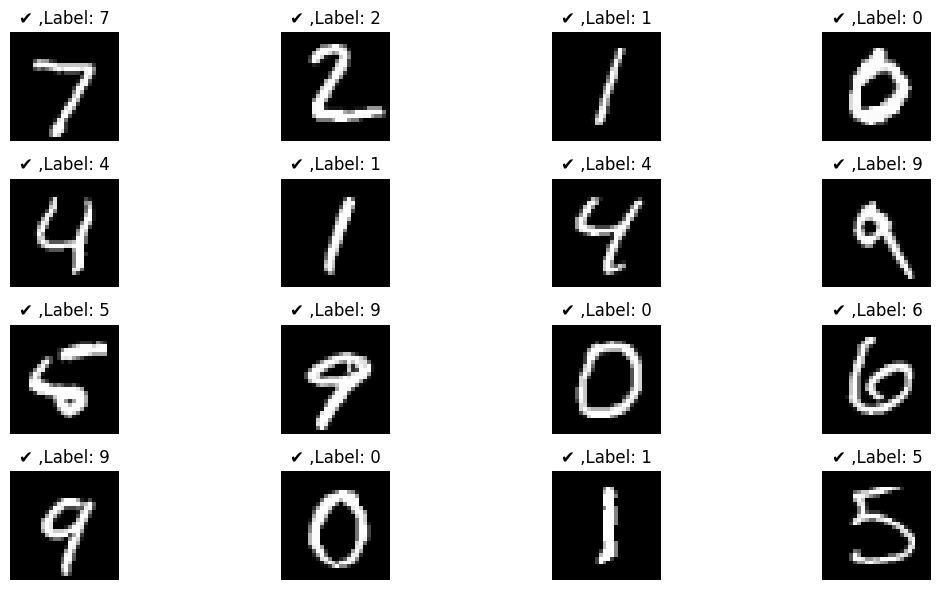

[2801,  100] loss : 0.000
[2801,  200] loss : 0.000
[2801,  300] loss : 0.000
[2801,  400] loss : 0.000
[2801,  500] loss : 0.000
[2801,  600] loss : 0.000
[2801,  700] loss : 0.000
[2801,  800] loss : 0.000
[2801,  900] loss : 0.000
acc =  98.86
[2802,  100] loss : 0.000
[2802,  200] loss : 0.000
[2802,  300] loss : 0.000
[2802,  400] loss : 0.000
[2802,  500] loss : 0.000
[2802,  600] loss : 0.000
[2802,  700] loss : 0.000
[2802,  800] loss : 0.000
[2802,  900] loss : 0.000
acc =  98.87
[2803,  100] loss : 0.000
[2803,  200] loss : 0.000
[2803,  300] loss : 0.000
[2803,  400] loss : 0.000
[2803,  500] loss : 0.000
[2803,  600] loss : 0.000
[2803,  700] loss : 0.000
[2803,  800] loss : 0.000
[2803,  900] loss : 0.000
acc =  98.87
[2804,  100] loss : 0.000
[2804,  200] loss : 0.000
[2804,  300] loss : 0.000
[2804,  400] loss : 0.000
[2804,  500] loss : 0.000
[2804,  600] loss : 0.000
[2804,  700] loss : 0.000
[2804,  800] loss : 0.000
[2804,  900] loss : 0.000
acc =  98.86
[2805,  100]

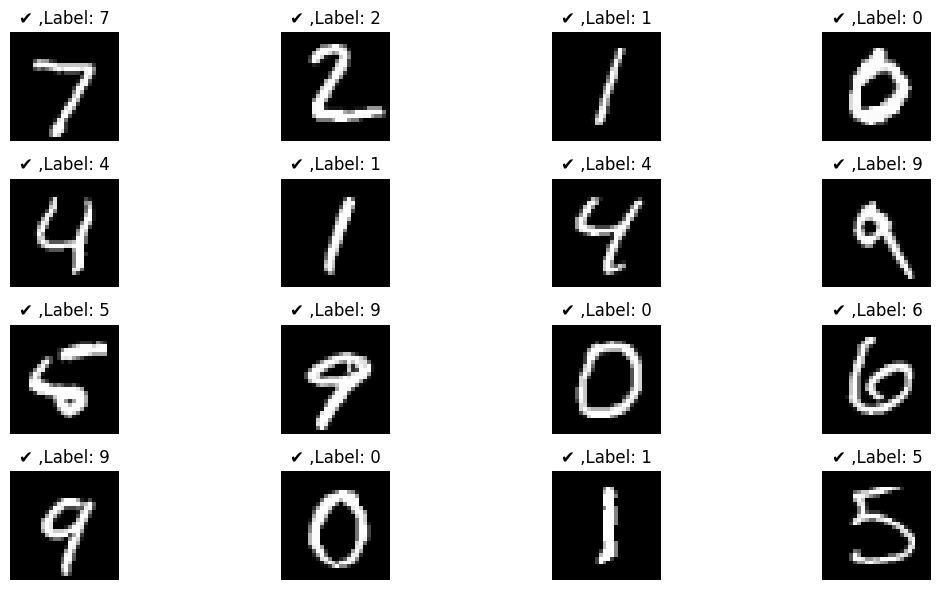

[2901,  100] loss : 0.000
[2901,  200] loss : 0.000
[2901,  300] loss : 0.000
[2901,  400] loss : 0.000
[2901,  500] loss : 0.000
[2901,  600] loss : 0.000
[2901,  700] loss : 0.000
[2901,  800] loss : 0.000
[2901,  900] loss : 0.000
acc =  98.86
[2902,  100] loss : 0.000
[2902,  200] loss : 0.000
[2902,  300] loss : 0.000
[2902,  400] loss : 0.000
[2902,  500] loss : 0.000
[2902,  600] loss : 0.000
[2902,  700] loss : 0.000
[2902,  800] loss : 0.000
[2902,  900] loss : 0.000
acc =  98.86
[2903,  100] loss : 0.000
[2903,  200] loss : 0.000
[2903,  300] loss : 0.000
[2903,  400] loss : 0.000
[2903,  500] loss : 0.000
[2903,  600] loss : 0.000
[2903,  700] loss : 0.000
[2903,  800] loss : 0.000
[2903,  900] loss : 0.000
acc =  98.87
[2904,  100] loss : 0.000
[2904,  200] loss : 0.000
[2904,  300] loss : 0.000
[2904,  400] loss : 0.000
[2904,  500] loss : 0.000
[2904,  600] loss : 0.000
[2904,  700] loss : 0.000
[2904,  800] loss : 0.000
[2904,  900] loss : 0.000
acc =  98.87
[2905,  100]

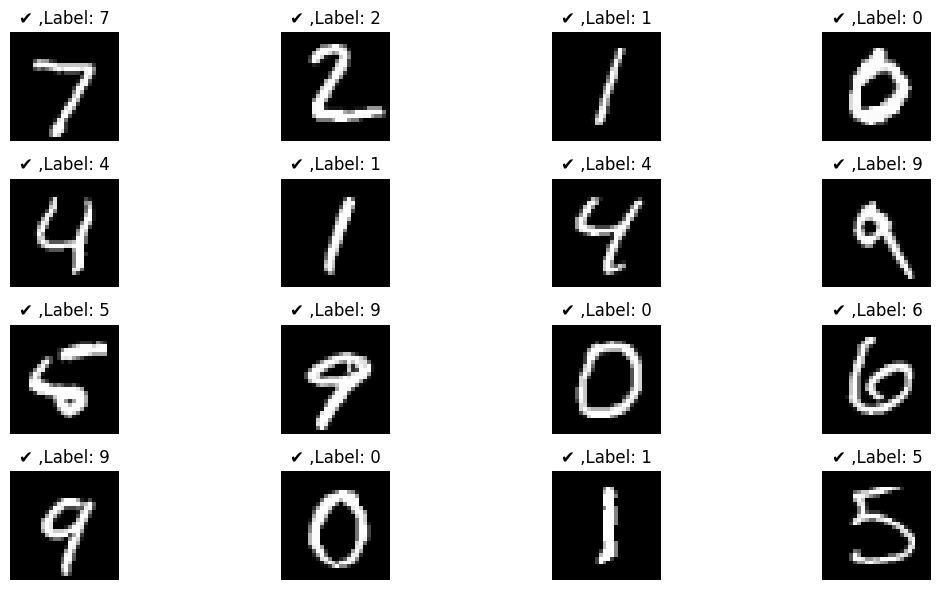

[3001,  100] loss : 0.000
[3001,  200] loss : 0.000
[3001,  300] loss : 0.000
[3001,  400] loss : 0.000
[3001,  500] loss : 0.000
[3001,  600] loss : 0.000
[3001,  700] loss : 0.000
[3001,  800] loss : 0.000
[3001,  900] loss : 0.000
acc =  98.86
[3002,  100] loss : 0.000
[3002,  200] loss : 0.000
[3002,  300] loss : 0.000
[3002,  400] loss : 0.000
[3002,  500] loss : 0.000
[3002,  600] loss : 0.000
[3002,  700] loss : 0.000
[3002,  800] loss : 0.000
[3002,  900] loss : 0.000
acc =  98.86
[3003,  100] loss : 0.000
[3003,  200] loss : 0.000
[3003,  300] loss : 0.000
[3003,  400] loss : 0.000
[3003,  500] loss : 0.000
[3003,  600] loss : 0.000
[3003,  700] loss : 0.000
[3003,  800] loss : 0.000
[3003,  900] loss : 0.000
acc =  98.86
[3004,  100] loss : 0.000
[3004,  200] loss : 0.000
[3004,  300] loss : 0.000
[3004,  400] loss : 0.000
[3004,  500] loss : 0.000
[3004,  600] loss : 0.000
[3004,  700] loss : 0.000
[3004,  800] loss : 0.000
[3004,  900] loss : 0.000
acc =  98.86
[3005,  100]

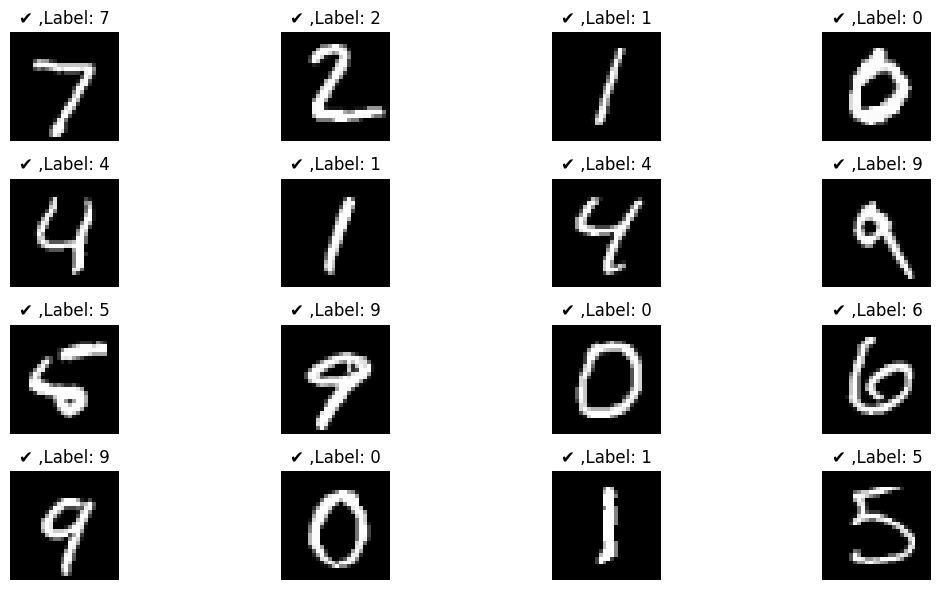

[3101,  100] loss : 0.000
[3101,  200] loss : 0.000
[3101,  300] loss : 0.000
[3101,  400] loss : 0.000
[3101,  500] loss : 0.000
[3101,  600] loss : 0.000
[3101,  700] loss : 0.000
[3101,  800] loss : 0.000
[3101,  900] loss : 0.000
acc =  98.86
[3102,  100] loss : 0.000
[3102,  200] loss : 0.000
[3102,  300] loss : 0.000
[3102,  400] loss : 0.000
[3102,  500] loss : 0.000
[3102,  600] loss : 0.000
[3102,  700] loss : 0.000
[3102,  800] loss : 0.000
[3102,  900] loss : 0.000
acc =  98.86
[3103,  100] loss : 0.000
[3103,  200] loss : 0.000
[3103,  300] loss : 0.000
[3103,  400] loss : 0.000
[3103,  500] loss : 0.000
[3103,  600] loss : 0.000
[3103,  700] loss : 0.000
[3103,  800] loss : 0.000
[3103,  900] loss : 0.000
acc =  98.86
[3104,  100] loss : 0.000
[3104,  200] loss : 0.000
[3104,  300] loss : 0.000
[3104,  400] loss : 0.000
[3104,  500] loss : 0.000
[3104,  600] loss : 0.000
[3104,  700] loss : 0.000
[3104,  800] loss : 0.000
[3104,  900] loss : 0.000
acc =  98.86
[3105,  100]

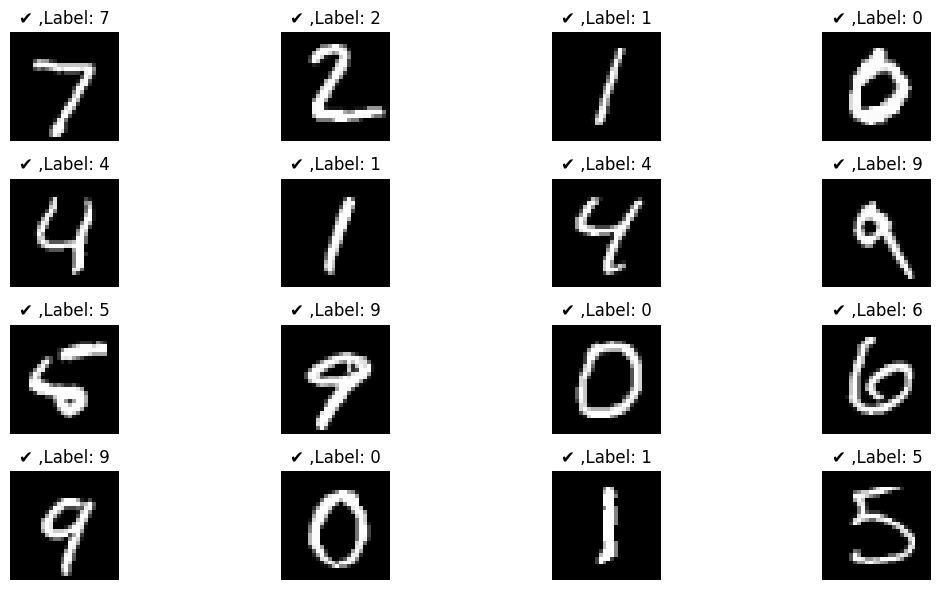

[3201,  100] loss : 0.000
[3201,  200] loss : 0.000
[3201,  300] loss : 0.000
[3201,  400] loss : 0.000
[3201,  500] loss : 0.000
[3201,  600] loss : 0.000
[3201,  700] loss : 0.000
[3201,  800] loss : 0.000
[3201,  900] loss : 0.000
acc =  98.86
[3202,  100] loss : 0.000
[3202,  200] loss : 0.000
[3202,  300] loss : 0.000
[3202,  400] loss : 0.000
[3202,  500] loss : 0.000
[3202,  600] loss : 0.000
[3202,  700] loss : 0.000
[3202,  800] loss : 0.000
[3202,  900] loss : 0.000
acc =  98.87
[3203,  100] loss : 0.000
[3203,  200] loss : 0.000
[3203,  300] loss : 0.000
[3203,  400] loss : 0.000
[3203,  500] loss : 0.000
[3203,  600] loss : 0.000
[3203,  700] loss : 0.000
[3203,  800] loss : 0.000
[3203,  900] loss : 0.000
acc =  98.86
[3204,  100] loss : 0.000
[3204,  200] loss : 0.000
[3204,  300] loss : 0.000
[3204,  400] loss : 0.000
[3204,  500] loss : 0.000
[3204,  600] loss : 0.000
[3204,  700] loss : 0.000
[3204,  800] loss : 0.000
[3204,  900] loss : 0.000
acc =  98.86
[3205,  100]

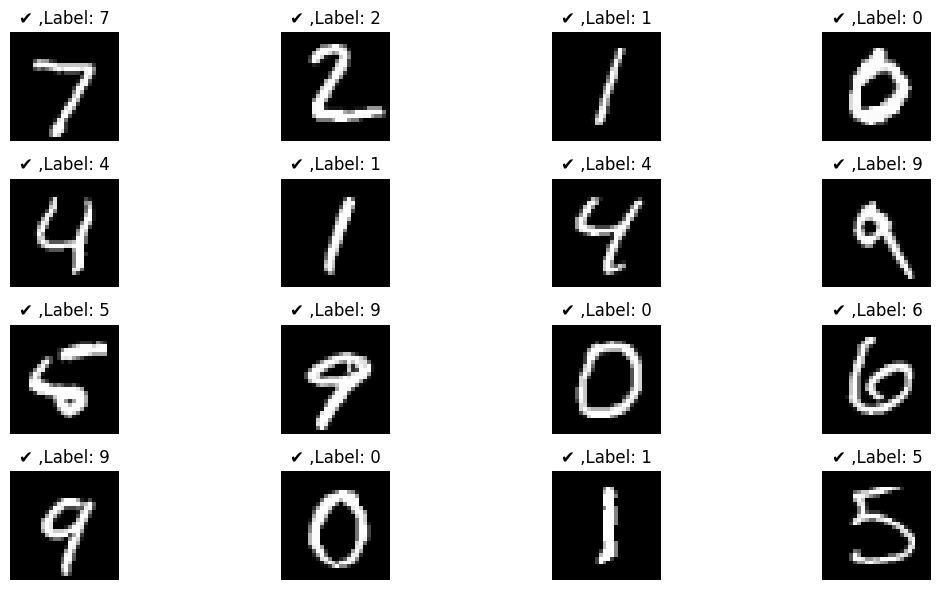

[3301,  100] loss : 0.000
[3301,  200] loss : 0.000
[3301,  300] loss : 0.000
[3301,  400] loss : 0.000
[3301,  500] loss : 0.000
[3301,  600] loss : 0.000
[3301,  700] loss : 0.000
[3301,  800] loss : 0.000
[3301,  900] loss : 0.000
acc =  98.85
[3302,  100] loss : 0.000
[3302,  200] loss : 0.000
[3302,  300] loss : 0.000
[3302,  400] loss : 0.000
[3302,  500] loss : 0.000
[3302,  600] loss : 0.000
[3302,  700] loss : 0.000
[3302,  800] loss : 0.000
[3302,  900] loss : 0.000
acc =  98.86
[3303,  100] loss : 0.000
[3303,  200] loss : 0.000
[3303,  300] loss : 0.000
[3303,  400] loss : 0.000
[3303,  500] loss : 0.000
[3303,  600] loss : 0.000
[3303,  700] loss : 0.000
[3303,  800] loss : 0.000
[3303,  900] loss : 0.000
acc =  98.85
[3304,  100] loss : 0.000
[3304,  200] loss : 0.000
[3304,  300] loss : 0.000
[3304,  400] loss : 0.000
[3304,  500] loss : 0.000
[3304,  600] loss : 0.000
[3304,  700] loss : 0.000
[3304,  800] loss : 0.000
[3304,  900] loss : 0.000
acc =  98.86
[3305,  100]

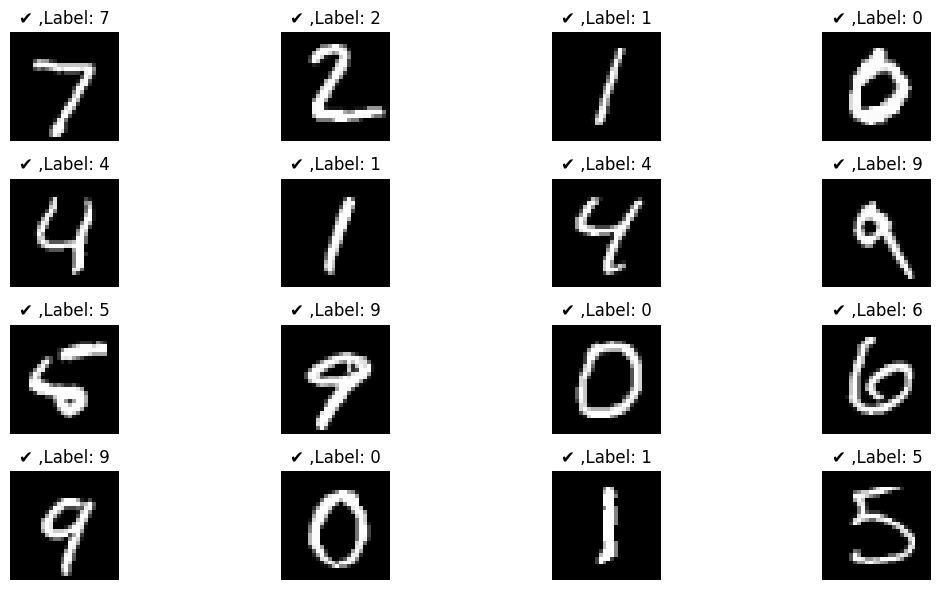

[3401,  100] loss : 0.000
[3401,  200] loss : 0.000
[3401,  300] loss : 0.000
[3401,  400] loss : 0.000
[3401,  500] loss : 0.000
[3401,  600] loss : 0.000
[3401,  700] loss : 0.000
[3401,  800] loss : 0.000
[3401,  900] loss : 0.000
acc =  98.86
[3402,  100] loss : 0.000
[3402,  200] loss : 0.000
[3402,  300] loss : 0.000
[3402,  400] loss : 0.000
[3402,  500] loss : 0.000
[3402,  600] loss : 0.000
[3402,  700] loss : 0.000
[3402,  800] loss : 0.000
[3402,  900] loss : 0.000
acc =  98.85
[3403,  100] loss : 0.000
[3403,  200] loss : 0.000
[3403,  300] loss : 0.000
[3403,  400] loss : 0.000
[3403,  500] loss : 0.000
[3403,  600] loss : 0.000
[3403,  700] loss : 0.000
[3403,  800] loss : 0.000
[3403,  900] loss : 0.000
acc =  98.85
[3404,  100] loss : 0.000
[3404,  200] loss : 0.000
[3404,  300] loss : 0.000
[3404,  400] loss : 0.000
[3404,  500] loss : 0.000
[3404,  600] loss : 0.000
[3404,  700] loss : 0.000
[3404,  800] loss : 0.000
[3404,  900] loss : 0.000
acc =  98.85
[3405,  100]

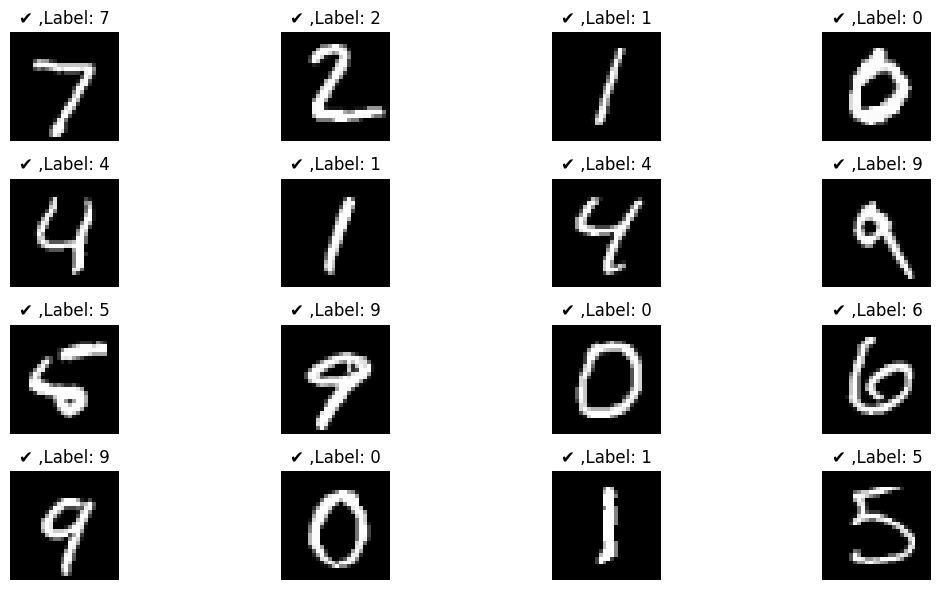

[3501,  100] loss : 0.000
[3501,  200] loss : 0.000
[3501,  300] loss : 0.000
[3501,  400] loss : 0.000
[3501,  500] loss : 0.000
[3501,  600] loss : 0.000
[3501,  700] loss : 0.000
[3501,  800] loss : 0.000
[3501,  900] loss : 0.000
acc =  98.85
[3502,  100] loss : 0.000
[3502,  200] loss : 0.000
[3502,  300] loss : 0.000
[3502,  400] loss : 0.000
[3502,  500] loss : 0.000
[3502,  600] loss : 0.000
[3502,  700] loss : 0.000
[3502,  800] loss : 0.000
[3502,  900] loss : 0.000
acc =  98.85
[3503,  100] loss : 0.000
[3503,  200] loss : 0.000
[3503,  300] loss : 0.000
[3503,  400] loss : 0.000
[3503,  500] loss : 0.000
[3503,  600] loss : 0.000
[3503,  700] loss : 0.000
[3503,  800] loss : 0.000
[3503,  900] loss : 0.000
acc =  98.85
[3504,  100] loss : 0.000
[3504,  200] loss : 0.000
[3504,  300] loss : 0.000
[3504,  400] loss : 0.000
[3504,  500] loss : 0.000
[3504,  600] loss : 0.000
[3504,  700] loss : 0.000
[3504,  800] loss : 0.000
[3504,  900] loss : 0.000
acc =  98.85
[3505,  100]

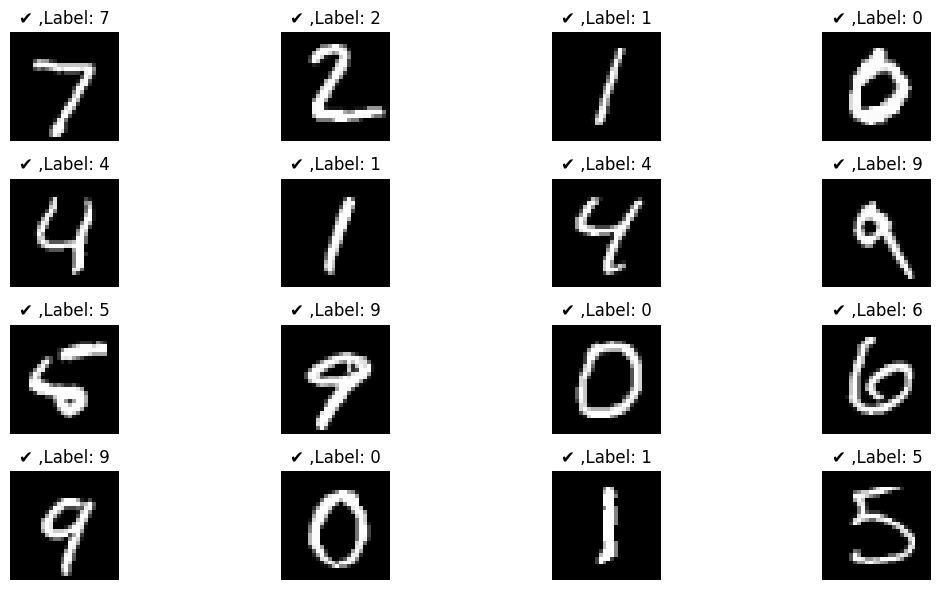

[3601,  100] loss : 0.000
[3601,  200] loss : 0.000
[3601,  300] loss : 0.000
[3601,  400] loss : 0.000
[3601,  500] loss : 0.000
[3601,  600] loss : 0.000
[3601,  700] loss : 0.000
[3601,  800] loss : 0.000
[3601,  900] loss : 0.000
acc =  98.85
[3602,  100] loss : 0.000
[3602,  200] loss : 0.000
[3602,  300] loss : 0.000
[3602,  400] loss : 0.000
[3602,  500] loss : 0.000
[3602,  600] loss : 0.000
[3602,  700] loss : 0.000
[3602,  800] loss : 0.000
[3602,  900] loss : 0.000
acc =  98.85
[3603,  100] loss : 0.000
[3603,  200] loss : 0.000
[3603,  300] loss : 0.000
[3603,  400] loss : 0.000
[3603,  500] loss : 0.000
[3603,  600] loss : 0.000
[3603,  700] loss : 0.000
[3603,  800] loss : 0.000
[3603,  900] loss : 0.000
acc =  98.85
[3604,  100] loss : 0.000
[3604,  200] loss : 0.000
[3604,  300] loss : 0.000
[3604,  400] loss : 0.000
[3604,  500] loss : 0.000
[3604,  600] loss : 0.000
[3604,  700] loss : 0.000
[3604,  800] loss : 0.000
[3604,  900] loss : 0.000
acc =  98.85
[3605,  100]

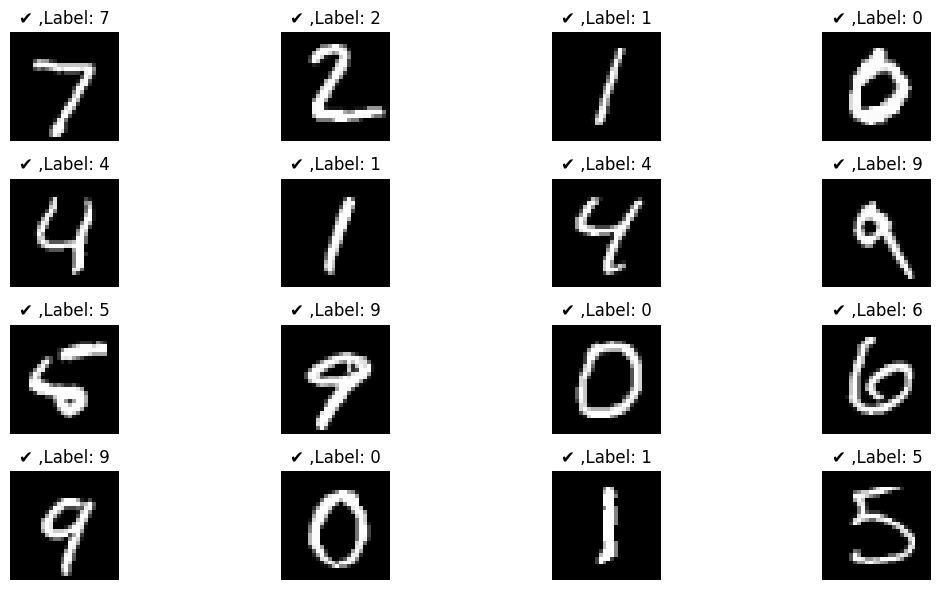

[3701,  100] loss : 0.000
[3701,  200] loss : 0.000
[3701,  300] loss : 0.000
[3701,  400] loss : 0.000
[3701,  500] loss : 0.000
[3701,  600] loss : 0.000
[3701,  700] loss : 0.000
[3701,  800] loss : 0.000
[3701,  900] loss : 0.000
acc =  98.85
[3702,  100] loss : 0.000
[3702,  200] loss : 0.000
[3702,  300] loss : 0.000
[3702,  400] loss : 0.000
[3702,  500] loss : 0.000
[3702,  600] loss : 0.000
[3702,  700] loss : 0.000
[3702,  800] loss : 0.000
[3702,  900] loss : 0.000
acc =  98.85
[3703,  100] loss : 0.000
[3703,  200] loss : 0.000
[3703,  300] loss : 0.000
[3703,  400] loss : 0.000
[3703,  500] loss : 0.000
[3703,  600] loss : 0.000
[3703,  700] loss : 0.000
[3703,  800] loss : 0.000
[3703,  900] loss : 0.000
acc =  98.85
[3704,  100] loss : 0.000
[3704,  200] loss : 0.000
[3704,  300] loss : 0.000
[3704,  400] loss : 0.000
[3704,  500] loss : 0.000
[3704,  600] loss : 0.000
[3704,  700] loss : 0.000
[3704,  800] loss : 0.000
[3704,  900] loss : 0.000
acc =  98.85
[3705,  100]

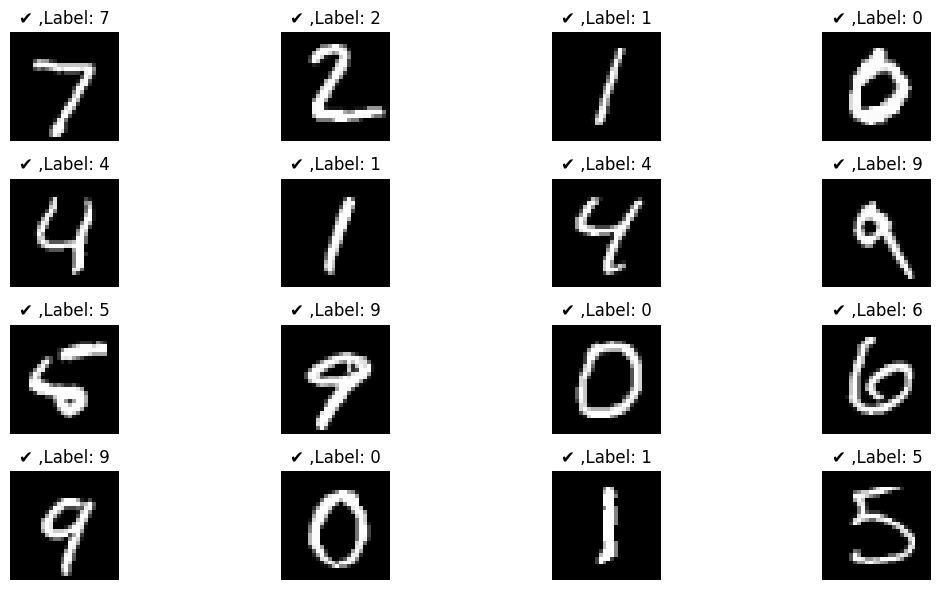

[3801,  100] loss : 0.000
[3801,  200] loss : 0.000
[3801,  300] loss : 0.000
[3801,  400] loss : 0.000
[3801,  500] loss : 0.000
[3801,  600] loss : 0.000
[3801,  700] loss : 0.000
[3801,  800] loss : 0.000
[3801,  900] loss : 0.000
acc =  98.85
[3802,  100] loss : 0.000
[3802,  200] loss : 0.000
[3802,  300] loss : 0.000
[3802,  400] loss : 0.000
[3802,  500] loss : 0.000
[3802,  600] loss : 0.000
[3802,  700] loss : 0.000
[3802,  800] loss : 0.000
[3802,  900] loss : 0.000
acc =  98.85
[3803,  100] loss : 0.000
[3803,  200] loss : 0.000
[3803,  300] loss : 0.000
[3803,  400] loss : 0.000
[3803,  500] loss : 0.000
[3803,  600] loss : 0.000
[3803,  700] loss : 0.000
[3803,  800] loss : 0.000
[3803,  900] loss : 0.000
acc =  98.85
[3804,  100] loss : 0.000
[3804,  200] loss : 0.000
[3804,  300] loss : 0.000
[3804,  400] loss : 0.000
[3804,  500] loss : 0.000
[3804,  600] loss : 0.000
[3804,  700] loss : 0.000
[3804,  800] loss : 0.000
[3804,  900] loss : 0.000
acc =  98.85
[3805,  100]

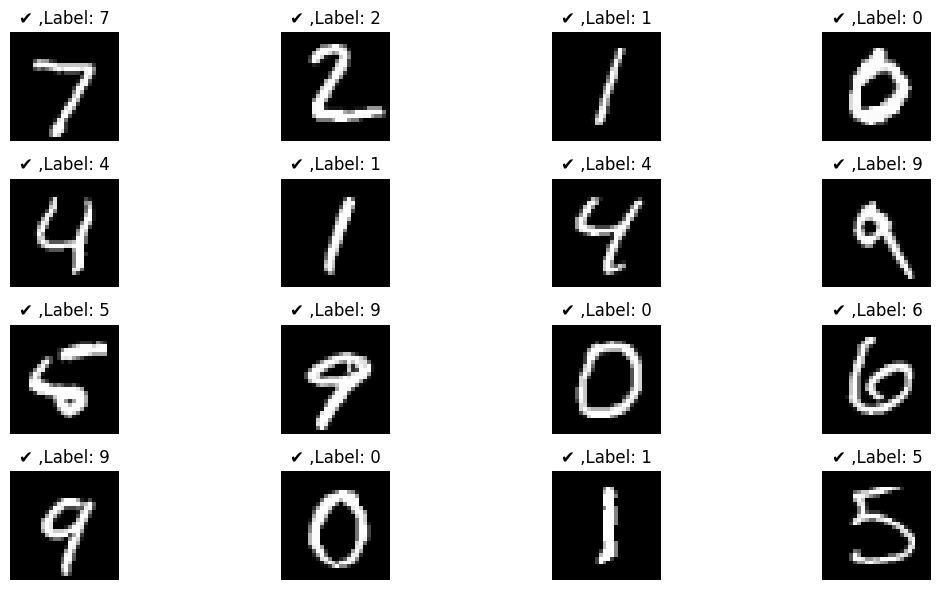

[3901,  100] loss : 0.000
[3901,  200] loss : 0.000
[3901,  300] loss : 0.000
[3901,  400] loss : 0.000
[3901,  500] loss : 0.000
[3901,  600] loss : 0.000
[3901,  700] loss : 0.000
[3901,  800] loss : 0.000
[3901,  900] loss : 0.000
acc =  98.85
[3902,  100] loss : 0.000
[3902,  200] loss : 0.000
[3902,  300] loss : 0.000
[3902,  400] loss : 0.000
[3902,  500] loss : 0.000
[3902,  600] loss : 0.000
[3902,  700] loss : 0.000
[3902,  800] loss : 0.000
[3902,  900] loss : 0.000
acc =  98.85
[3903,  100] loss : 0.000
[3903,  200] loss : 0.000
[3903,  300] loss : 0.000
[3903,  400] loss : 0.000
[3903,  500] loss : 0.000
[3903,  600] loss : 0.000
[3903,  700] loss : 0.000
[3903,  800] loss : 0.000
[3903,  900] loss : 0.000
acc =  98.85
[3904,  100] loss : 0.000
[3904,  200] loss : 0.000
[3904,  300] loss : 0.000
[3904,  400] loss : 0.000
[3904,  500] loss : 0.000
[3904,  600] loss : 0.000
[3904,  700] loss : 0.000
[3904,  800] loss : 0.000
[3904,  900] loss : 0.000
acc =  98.85
[3905,  100]

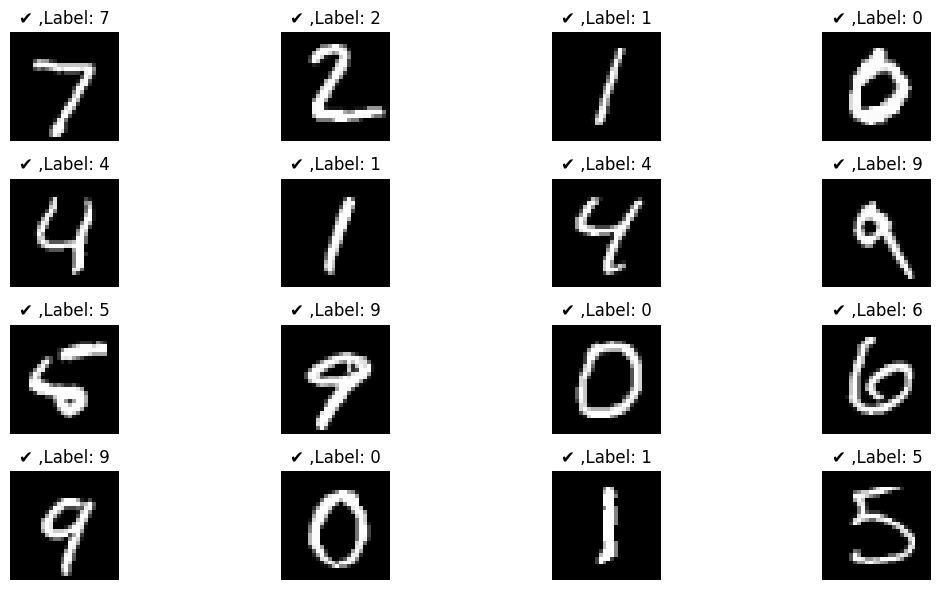

[4001,  100] loss : 0.000
[4001,  200] loss : 0.000
[4001,  300] loss : 0.000
[4001,  400] loss : 0.000
[4001,  500] loss : 0.000
[4001,  600] loss : 0.000
[4001,  700] loss : 0.000
[4001,  800] loss : 0.000
[4001,  900] loss : 0.000
acc =  98.85
[4002,  100] loss : 0.000
[4002,  200] loss : 0.000
[4002,  300] loss : 0.000
[4002,  400] loss : 0.000
[4002,  500] loss : 0.000
[4002,  600] loss : 0.000
[4002,  700] loss : 0.000
[4002,  800] loss : 0.000
[4002,  900] loss : 0.000
acc =  98.86
[4003,  100] loss : 0.000
[4003,  200] loss : 0.000
[4003,  300] loss : 0.000
[4003,  400] loss : 0.000
[4003,  500] loss : 0.000
[4003,  600] loss : 0.000
[4003,  700] loss : 0.000
[4003,  800] loss : 0.000
[4003,  900] loss : 0.000
acc =  98.85
[4004,  100] loss : 0.000
[4004,  200] loss : 0.000
[4004,  300] loss : 0.000
[4004,  400] loss : 0.000
[4004,  500] loss : 0.000
[4004,  600] loss : 0.000
[4004,  700] loss : 0.000
[4004,  800] loss : 0.000
[4004,  900] loss : 0.000
acc =  98.86
[4005,  100]

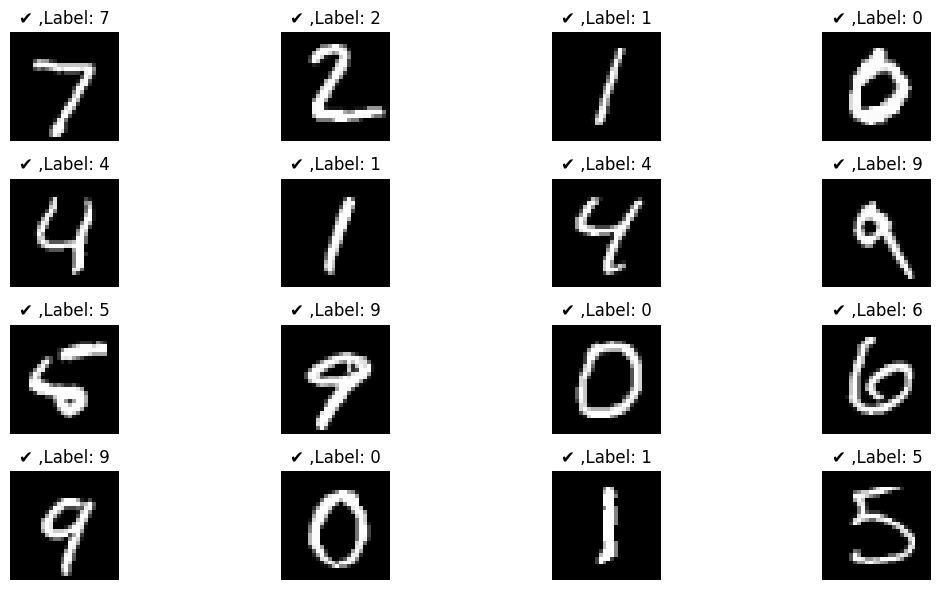

[4101,  100] loss : 0.000
[4101,  200] loss : 0.000
[4101,  300] loss : 0.000
[4101,  400] loss : 0.000
[4101,  500] loss : 0.000
[4101,  600] loss : 0.000
[4101,  700] loss : 0.000
[4101,  800] loss : 0.000
[4101,  900] loss : 0.000
acc =  98.85
[4102,  100] loss : 0.000
[4102,  200] loss : 0.000
[4102,  300] loss : 0.000
[4102,  400] loss : 0.000
[4102,  500] loss : 0.000
[4102,  600] loss : 0.000
[4102,  700] loss : 0.000
[4102,  800] loss : 0.000
[4102,  900] loss : 0.000
acc =  98.85
[4103,  100] loss : 0.000
[4103,  200] loss : 0.000
[4103,  300] loss : 0.000
[4103,  400] loss : 0.000
[4103,  500] loss : 0.000
[4103,  600] loss : 0.000
[4103,  700] loss : 0.000
[4103,  800] loss : 0.000
[4103,  900] loss : 0.000
acc =  98.85
[4104,  100] loss : 0.000
[4104,  200] loss : 0.000
[4104,  300] loss : 0.000
[4104,  400] loss : 0.000
[4104,  500] loss : 0.000
[4104,  600] loss : 0.000
[4104,  700] loss : 0.000
[4104,  800] loss : 0.000
[4104,  900] loss : 0.000
acc =  98.86
[4105,  100]

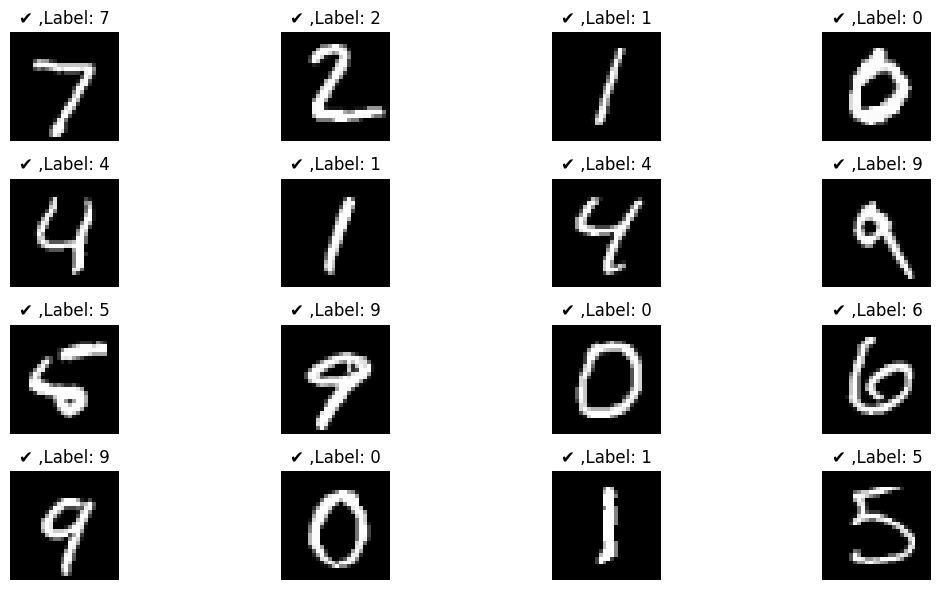

[4201,  100] loss : 0.000
[4201,  200] loss : 0.000
[4201,  300] loss : 0.000
[4201,  400] loss : 0.000
[4201,  500] loss : 0.000
[4201,  600] loss : 0.000
[4201,  700] loss : 0.000
[4201,  800] loss : 0.000
[4201,  900] loss : 0.000
acc =  98.86
[4202,  100] loss : 0.000
[4202,  200] loss : 0.000
[4202,  300] loss : 0.000
[4202,  400] loss : 0.000
[4202,  500] loss : 0.000
[4202,  600] loss : 0.000
[4202,  700] loss : 0.000
[4202,  800] loss : 0.000
[4202,  900] loss : 0.000
acc =  98.86
[4203,  100] loss : 0.000
[4203,  200] loss : 0.000
[4203,  300] loss : 0.000
[4203,  400] loss : 0.000
[4203,  500] loss : 0.000
[4203,  600] loss : 0.000
[4203,  700] loss : 0.000
[4203,  800] loss : 0.000
[4203,  900] loss : 0.000
acc =  98.85
[4204,  100] loss : 0.000
[4204,  200] loss : 0.000
[4204,  300] loss : 0.000
[4204,  400] loss : 0.000
[4204,  500] loss : 0.000
[4204,  600] loss : 0.000
[4204,  700] loss : 0.000
[4204,  800] loss : 0.000
[4204,  900] loss : 0.000
acc =  98.86
[4205,  100]

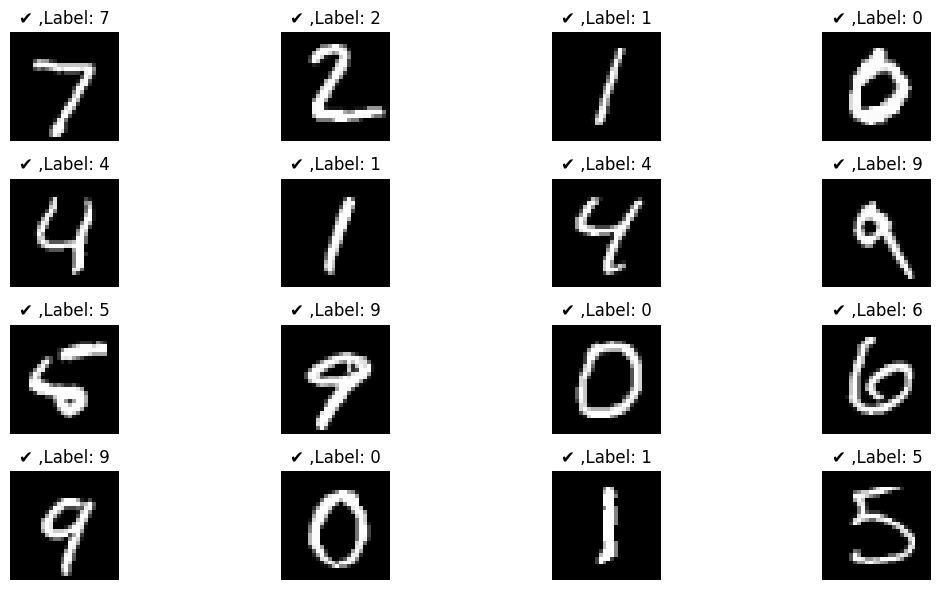

[4301,  100] loss : 0.000
[4301,  200] loss : 0.000
[4301,  300] loss : 0.000
[4301,  400] loss : 0.000
[4301,  500] loss : 0.000
[4301,  600] loss : 0.000
[4301,  700] loss : 0.000
[4301,  800] loss : 0.000
[4301,  900] loss : 0.000
acc =  98.85
[4302,  100] loss : 0.000
[4302,  200] loss : 0.000
[4302,  300] loss : 0.000
[4302,  400] loss : 0.000
[4302,  500] loss : 0.000
[4302,  600] loss : 0.000
[4302,  700] loss : 0.000
[4302,  800] loss : 0.000
[4302,  900] loss : 0.000
acc =  98.85
[4303,  100] loss : 0.000
[4303,  200] loss : 0.000
[4303,  300] loss : 0.000
[4303,  400] loss : 0.000
[4303,  500] loss : 0.000
[4303,  600] loss : 0.000
[4303,  700] loss : 0.000
[4303,  800] loss : 0.000
[4303,  900] loss : 0.000
acc =  98.85
[4304,  100] loss : 0.000
[4304,  200] loss : 0.000
[4304,  300] loss : 0.000
[4304,  400] loss : 0.000
[4304,  500] loss : 0.000
[4304,  600] loss : 0.000
[4304,  700] loss : 0.000
[4304,  800] loss : 0.000
[4304,  900] loss : 0.000
acc =  98.86
[4305,  100]

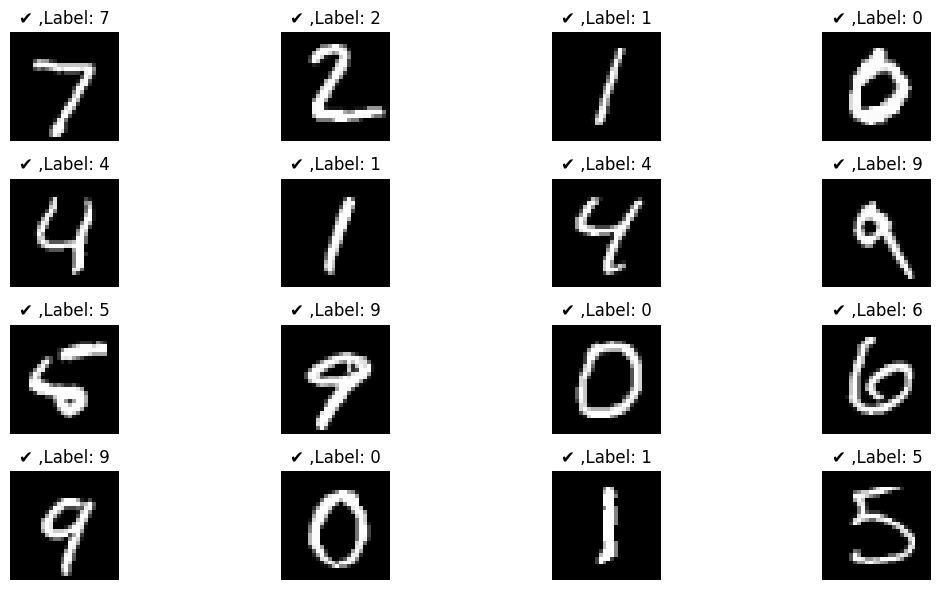

[4401,  100] loss : 0.000
[4401,  200] loss : 0.000
[4401,  300] loss : 0.000
[4401,  400] loss : 0.000
[4401,  500] loss : 0.000
[4401,  600] loss : 0.000
[4401,  700] loss : 0.000
[4401,  800] loss : 0.000
[4401,  900] loss : 0.000
acc =  98.85
[4402,  100] loss : 0.000
[4402,  200] loss : 0.000
[4402,  300] loss : 0.000
[4402,  400] loss : 0.000
[4402,  500] loss : 0.000
[4402,  600] loss : 0.000
[4402,  700] loss : 0.000
[4402,  800] loss : 0.000
[4402,  900] loss : 0.000
acc =  98.86
[4403,  100] loss : 0.000
[4403,  200] loss : 0.000
[4403,  300] loss : 0.000
[4403,  400] loss : 0.000
[4403,  500] loss : 0.000
[4403,  600] loss : 0.000
[4403,  700] loss : 0.000
[4403,  800] loss : 0.000
[4403,  900] loss : 0.000
acc =  98.85
[4404,  100] loss : 0.000
[4404,  200] loss : 0.000
[4404,  300] loss : 0.000
[4404,  400] loss : 0.000
[4404,  500] loss : 0.000
[4404,  600] loss : 0.000
[4404,  700] loss : 0.000
[4404,  800] loss : 0.000
[4404,  900] loss : 0.000
acc =  98.85
[4405,  100]

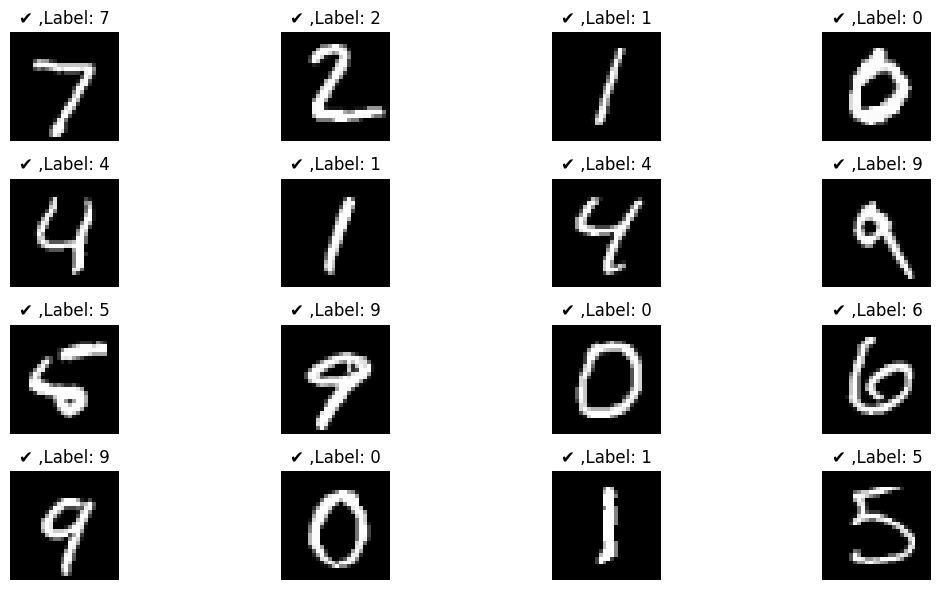

[4501,  100] loss : 0.000
[4501,  200] loss : 0.000
[4501,  300] loss : 0.000
[4501,  400] loss : 0.000
[4501,  500] loss : 0.000
[4501,  600] loss : 0.000
[4501,  700] loss : 0.000
[4501,  800] loss : 0.000
[4501,  900] loss : 0.000
acc =  98.86
[4502,  100] loss : 0.000
[4502,  200] loss : 0.000
[4502,  300] loss : 0.000
[4502,  400] loss : 0.000
[4502,  500] loss : 0.000
[4502,  600] loss : 0.000
[4502,  700] loss : 0.000
[4502,  800] loss : 0.000
[4502,  900] loss : 0.000
acc =  98.86
[4503,  100] loss : 0.000
[4503,  200] loss : 0.000
[4503,  300] loss : 0.000
[4503,  400] loss : 0.000
[4503,  500] loss : 0.000
[4503,  600] loss : 0.000
[4503,  700] loss : 0.000
[4503,  800] loss : 0.000
[4503,  900] loss : 0.000
acc =  98.85
[4504,  100] loss : 0.000
[4504,  200] loss : 0.000
[4504,  300] loss : 0.000
[4504,  400] loss : 0.000
[4504,  500] loss : 0.000
[4504,  600] loss : 0.000
[4504,  700] loss : 0.000
[4504,  800] loss : 0.000
[4504,  900] loss : 0.000
acc =  98.86
[4505,  100]

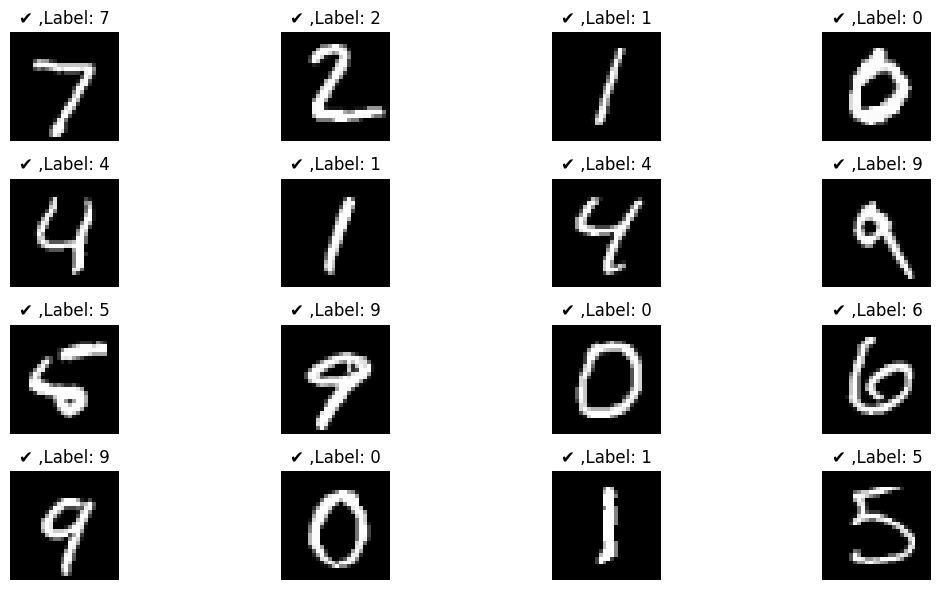

[4601,  100] loss : 0.000
[4601,  200] loss : 0.000
[4601,  300] loss : 0.000
[4601,  400] loss : 0.000
[4601,  500] loss : 0.000
[4601,  600] loss : 0.000
[4601,  700] loss : 0.000
[4601,  800] loss : 0.000
[4601,  900] loss : 0.000
acc =  98.86
[4602,  100] loss : 0.000
[4602,  200] loss : 0.000
[4602,  300] loss : 0.000
[4602,  400] loss : 0.000
[4602,  500] loss : 0.000
[4602,  600] loss : 0.000
[4602,  700] loss : 0.000
[4602,  800] loss : 0.000
[4602,  900] loss : 0.000
acc =  98.85
[4603,  100] loss : 0.000
[4603,  200] loss : 0.000
[4603,  300] loss : 0.000
[4603,  400] loss : 0.000
[4603,  500] loss : 0.000
[4603,  600] loss : 0.000
[4603,  700] loss : 0.000
[4603,  800] loss : 0.000
[4603,  900] loss : 0.000
acc =  98.86
[4604,  100] loss : 0.000
[4604,  200] loss : 0.000
[4604,  300] loss : 0.000
[4604,  400] loss : 0.000
[4604,  500] loss : 0.000
[4604,  600] loss : 0.000
[4604,  700] loss : 0.000
[4604,  800] loss : 0.000
[4604,  900] loss : 0.000
acc =  98.86
[4605,  100]

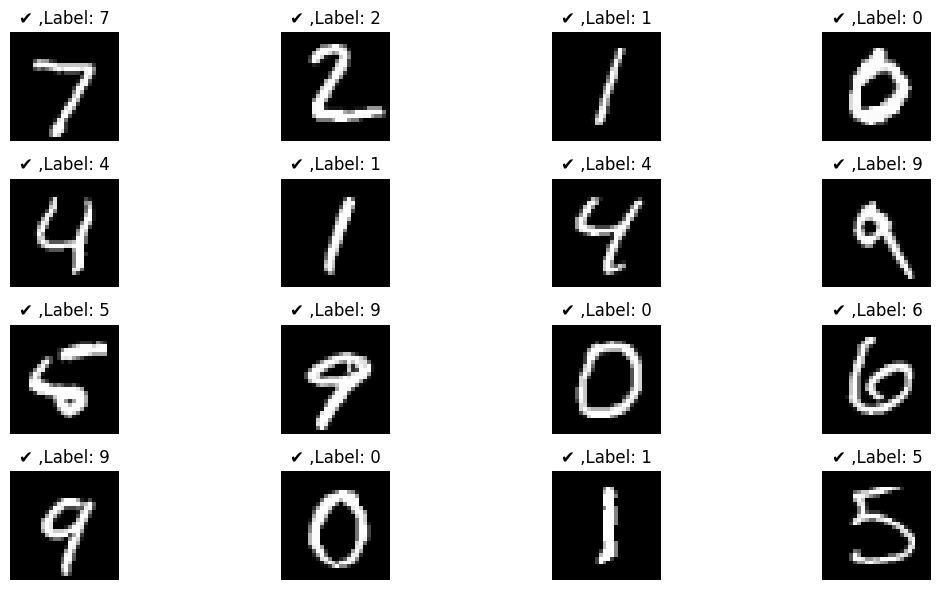

[4701,  100] loss : 0.000
[4701,  200] loss : 0.000
[4701,  300] loss : 0.000
[4701,  400] loss : 0.000
[4701,  500] loss : 0.000
[4701,  600] loss : 0.000
[4701,  700] loss : 0.000
[4701,  800] loss : 0.000
[4701,  900] loss : 0.000
acc =  98.85
[4702,  100] loss : 0.000
[4702,  200] loss : 0.000
[4702,  300] loss : 0.000
[4702,  400] loss : 0.000
[4702,  500] loss : 0.000
[4702,  600] loss : 0.000
[4702,  700] loss : 0.000
[4702,  800] loss : 0.000
[4702,  900] loss : 0.000
acc =  98.86
[4703,  100] loss : 0.000
[4703,  200] loss : 0.000
[4703,  300] loss : 0.000
[4703,  400] loss : 0.000
[4703,  500] loss : 0.000
[4703,  600] loss : 0.000
[4703,  700] loss : 0.000
[4703,  800] loss : 0.000
[4703,  900] loss : 0.000
acc =  98.85
[4704,  100] loss : 0.000
[4704,  200] loss : 0.000
[4704,  300] loss : 0.000
[4704,  400] loss : 0.000
[4704,  500] loss : 0.000
[4704,  600] loss : 0.000
[4704,  700] loss : 0.000
[4704,  800] loss : 0.000
[4704,  900] loss : 0.000
acc =  98.86
[4705,  100]

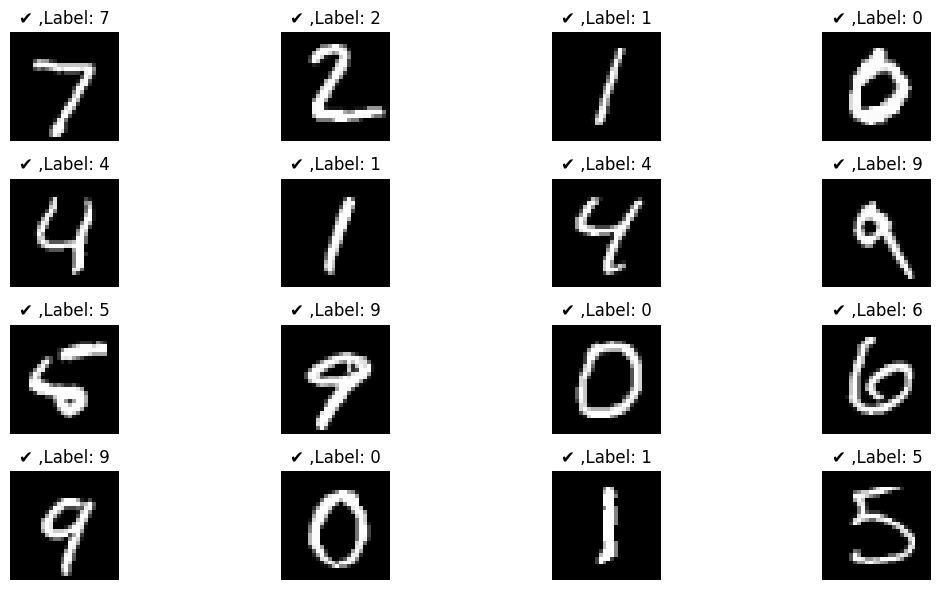

[4801,  100] loss : 0.000
[4801,  200] loss : 0.000
[4801,  300] loss : 0.000
[4801,  400] loss : 0.000
[4801,  500] loss : 0.000
[4801,  600] loss : 0.000
[4801,  700] loss : 0.000
[4801,  800] loss : 0.000
[4801,  900] loss : 0.000
acc =  98.86
[4802,  100] loss : 0.000
[4802,  200] loss : 0.000
[4802,  300] loss : 0.000
[4802,  400] loss : 0.000
[4802,  500] loss : 0.000
[4802,  600] loss : 0.000
[4802,  700] loss : 0.000
[4802,  800] loss : 0.000
[4802,  900] loss : 0.000
acc =  98.86
[4803,  100] loss : 0.000
[4803,  200] loss : 0.000
[4803,  300] loss : 0.000
[4803,  400] loss : 0.000
[4803,  500] loss : 0.000
[4803,  600] loss : 0.000
[4803,  700] loss : 0.000
[4803,  800] loss : 0.000
[4803,  900] loss : 0.000
acc =  98.86
[4804,  100] loss : 0.000
[4804,  200] loss : 0.000
[4804,  300] loss : 0.000
[4804,  400] loss : 0.000
[4804,  500] loss : 0.000
[4804,  600] loss : 0.000
[4804,  700] loss : 0.000
[4804,  800] loss : 0.000
[4804,  900] loss : 0.000
acc =  98.86
[4805,  100]

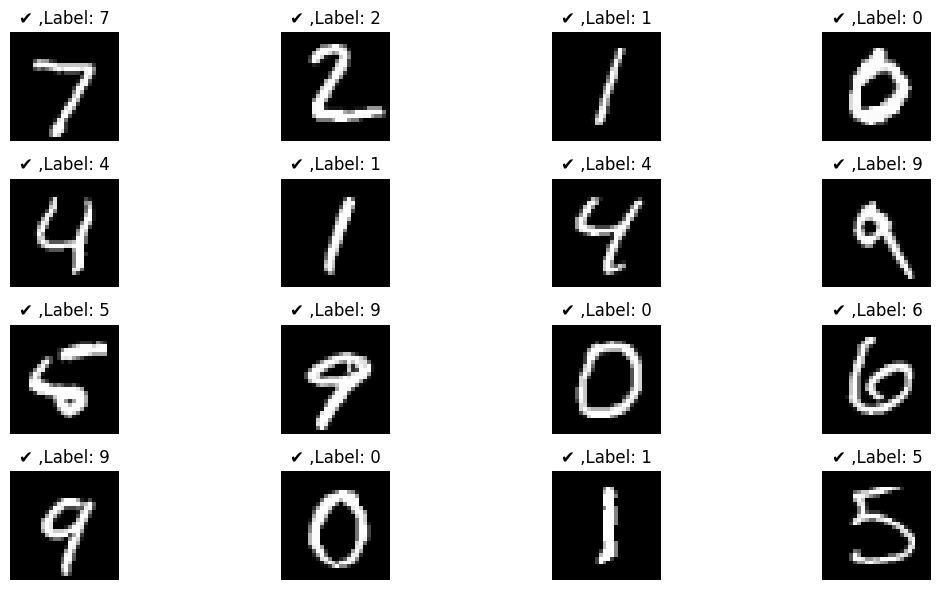

[4901,  100] loss : 0.000
[4901,  200] loss : 0.000
[4901,  300] loss : 0.000
[4901,  400] loss : 0.000
[4901,  500] loss : 0.000
[4901,  600] loss : 0.000
[4901,  700] loss : 0.000
[4901,  800] loss : 0.000
[4901,  900] loss : 0.000
acc =  98.86
[4902,  100] loss : 0.000
[4902,  200] loss : 0.000
[4902,  300] loss : 0.000
[4902,  400] loss : 0.000
[4902,  500] loss : 0.000
[4902,  600] loss : 0.000
[4902,  700] loss : 0.000
[4902,  800] loss : 0.000
[4902,  900] loss : 0.000
acc =  98.86
[4903,  100] loss : 0.000
[4903,  200] loss : 0.000
[4903,  300] loss : 0.000
[4903,  400] loss : 0.000
[4903,  500] loss : 0.000
[4903,  600] loss : 0.000
[4903,  700] loss : 0.000
[4903,  800] loss : 0.000
[4903,  900] loss : 0.000
acc =  98.86
[4904,  100] loss : 0.000
[4904,  200] loss : 0.000
[4904,  300] loss : 0.000
[4904,  400] loss : 0.000
[4904,  500] loss : 0.000
[4904,  600] loss : 0.000
[4904,  700] loss : 0.000
[4904,  800] loss : 0.000
[4904,  900] loss : 0.000
acc =  98.86
[4905,  100]

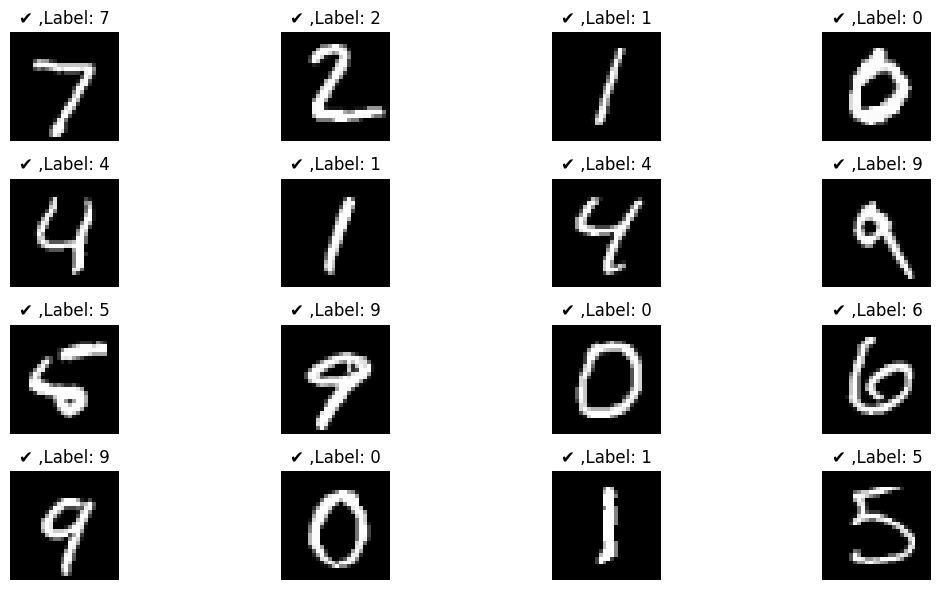

[5001,  100] loss : 0.000
[5001,  200] loss : 0.000
[5001,  300] loss : 0.000
[5001,  400] loss : 0.000
[5001,  500] loss : 0.000
[5001,  600] loss : 0.000
[5001,  700] loss : 0.000
[5001,  800] loss : 0.000
[5001,  900] loss : 0.000
acc =  98.86
[5002,  100] loss : 0.000
[5002,  200] loss : 0.000
[5002,  300] loss : 0.000
[5002,  400] loss : 0.000
[5002,  500] loss : 0.000
[5002,  600] loss : 0.000
[5002,  700] loss : 0.000
[5002,  800] loss : 0.000
[5002,  900] loss : 0.000
acc =  98.85
[5003,  100] loss : 0.000
[5003,  200] loss : 0.000
[5003,  300] loss : 0.000
[5003,  400] loss : 0.000
[5003,  500] loss : 0.000
[5003,  600] loss : 0.000
[5003,  700] loss : 0.000
[5003,  800] loss : 0.000
[5003,  900] loss : 0.000
acc =  98.86
[5004,  100] loss : 0.000
[5004,  200] loss : 0.000
[5004,  300] loss : 0.000
[5004,  400] loss : 0.000
[5004,  500] loss : 0.000
[5004,  600] loss : 0.000
[5004,  700] loss : 0.000
[5004,  800] loss : 0.000
[5004,  900] loss : 0.000
acc =  98.86
[5005,  100]

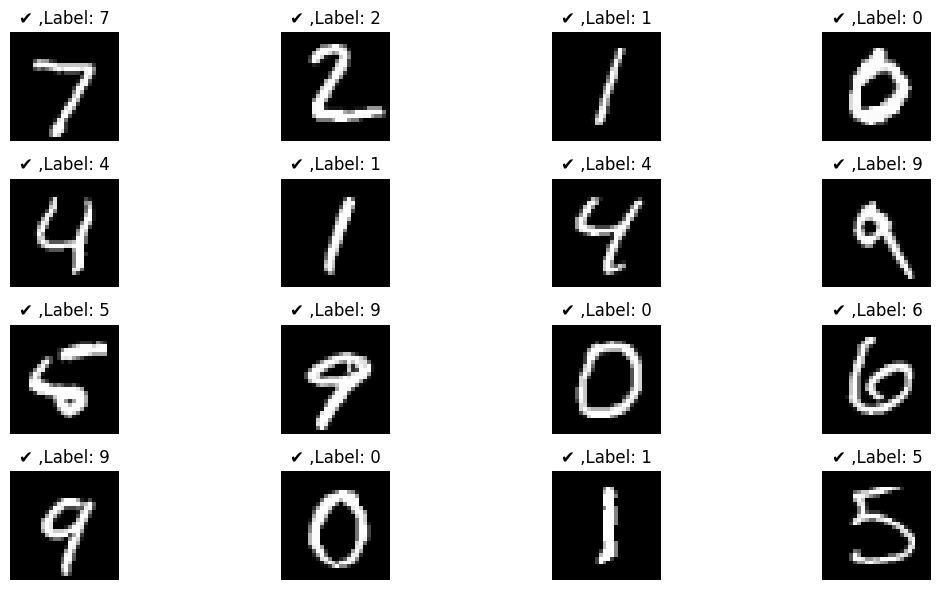

[5101,  100] loss : 0.000
[5101,  200] loss : 0.000
[5101,  300] loss : 0.000
[5101,  400] loss : 0.000
[5101,  500] loss : 0.000
[5101,  600] loss : 0.000
[5101,  700] loss : 0.000
[5101,  800] loss : 0.000
[5101,  900] loss : 0.000
acc =  98.86
[5102,  100] loss : 0.000
[5102,  200] loss : 0.000
[5102,  300] loss : 0.000
[5102,  400] loss : 0.000
[5102,  500] loss : 0.000
[5102,  600] loss : 0.000
[5102,  700] loss : 0.000
[5102,  800] loss : 0.000
[5102,  900] loss : 0.000
acc =  98.86
[5103,  100] loss : 0.000
[5103,  200] loss : 0.000
[5103,  300] loss : 0.000
[5103,  400] loss : 0.000
[5103,  500] loss : 0.000
[5103,  600] loss : 0.000
[5103,  700] loss : 0.000
[5103,  800] loss : 0.000
[5103,  900] loss : 0.000
acc =  98.86
[5104,  100] loss : 0.000
[5104,  200] loss : 0.000
[5104,  300] loss : 0.000
[5104,  400] loss : 0.000
[5104,  500] loss : 0.000
[5104,  600] loss : 0.000
[5104,  700] loss : 0.000
[5104,  800] loss : 0.000
[5104,  900] loss : 0.000
acc =  98.86
[5105,  100]

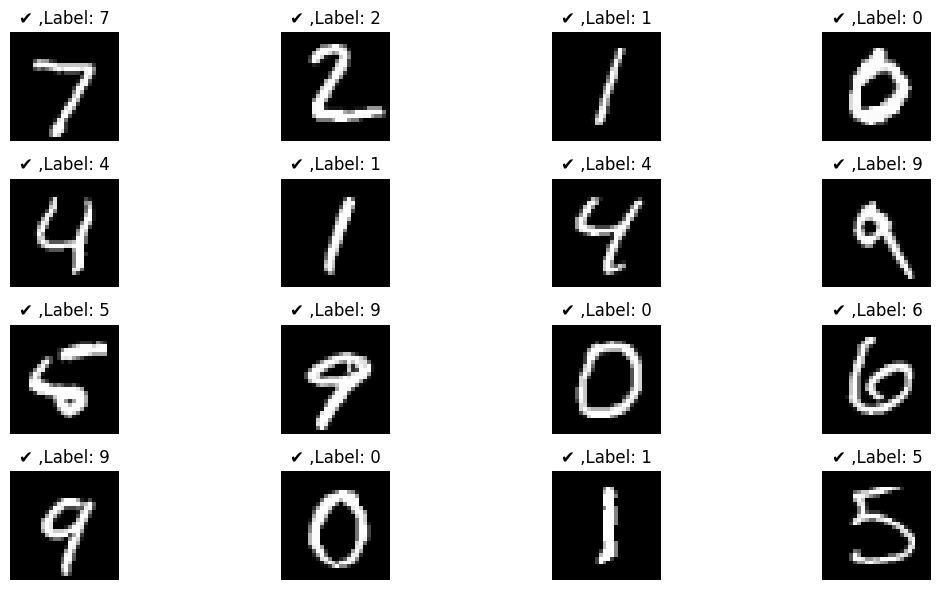

[5201,  100] loss : 0.000
[5201,  200] loss : 0.000
[5201,  300] loss : 0.000
[5201,  400] loss : 0.000
[5201,  500] loss : 0.000
[5201,  600] loss : 0.000
[5201,  700] loss : 0.000
[5201,  800] loss : 0.000
[5201,  900] loss : 0.000
acc =  98.86
[5202,  100] loss : 0.000
[5202,  200] loss : 0.000
[5202,  300] loss : 0.000
[5202,  400] loss : 0.000
[5202,  500] loss : 0.000
[5202,  600] loss : 0.000
[5202,  700] loss : 0.000
[5202,  800] loss : 0.000
[5202,  900] loss : 0.000
acc =  98.86
[5203,  100] loss : 0.000
[5203,  200] loss : 0.000
[5203,  300] loss : 0.000
[5203,  400] loss : 0.000
[5203,  500] loss : 0.000
[5203,  600] loss : 0.000
[5203,  700] loss : 0.000
[5203,  800] loss : 0.000
[5203,  900] loss : 0.000
acc =  98.86
[5204,  100] loss : 0.000
[5204,  200] loss : 0.000
[5204,  300] loss : 0.000
[5204,  400] loss : 0.000
[5204,  500] loss : 0.000
[5204,  600] loss : 0.000
[5204,  700] loss : 0.000
[5204,  800] loss : 0.000
[5204,  900] loss : 0.000
acc =  98.86
[5205,  100]

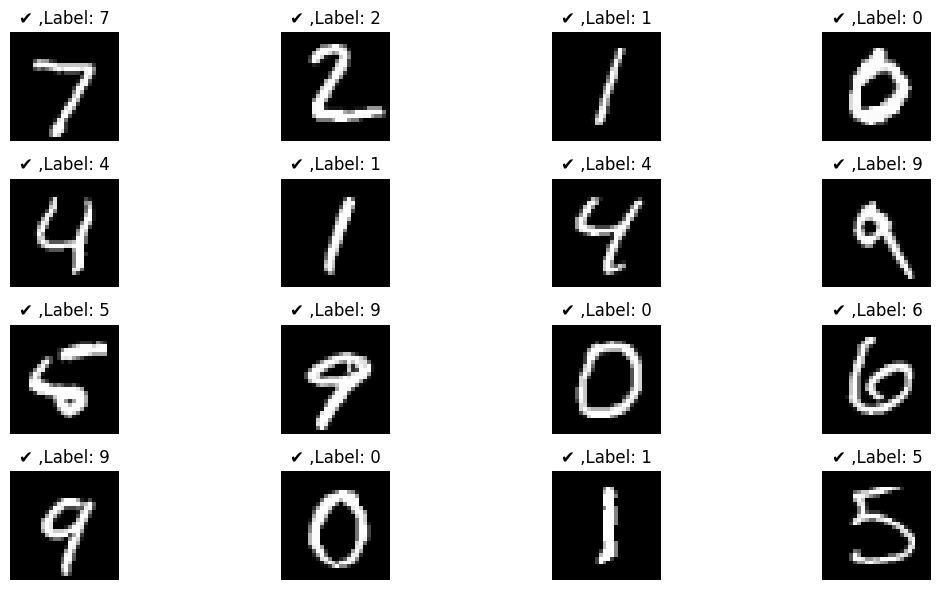

[5301,  100] loss : 0.000
[5301,  200] loss : 0.000
[5301,  300] loss : 0.000
[5301,  400] loss : 0.000
[5301,  500] loss : 0.000
[5301,  600] loss : 0.000
[5301,  700] loss : 0.000
[5301,  800] loss : 0.000
[5301,  900] loss : 0.000
acc =  98.86
[5302,  100] loss : 0.000
[5302,  200] loss : 0.000
[5302,  300] loss : 0.000
[5302,  400] loss : 0.000
[5302,  500] loss : 0.000
[5302,  600] loss : 0.000
[5302,  700] loss : 0.000
[5302,  800] loss : 0.000
[5302,  900] loss : 0.000
acc =  98.86
[5303,  100] loss : 0.000
[5303,  200] loss : 0.000
[5303,  300] loss : 0.000
[5303,  400] loss : 0.000
[5303,  500] loss : 0.000
[5303,  600] loss : 0.000
[5303,  700] loss : 0.000
[5303,  800] loss : 0.000
[5303,  900] loss : 0.000
acc =  98.86
[5304,  100] loss : 0.000
[5304,  200] loss : 0.000
[5304,  300] loss : 0.000
[5304,  400] loss : 0.000
[5304,  500] loss : 0.000
[5304,  600] loss : 0.000
[5304,  700] loss : 0.000
[5304,  800] loss : 0.000
[5304,  900] loss : 0.000
acc =  98.86
[5305,  100]

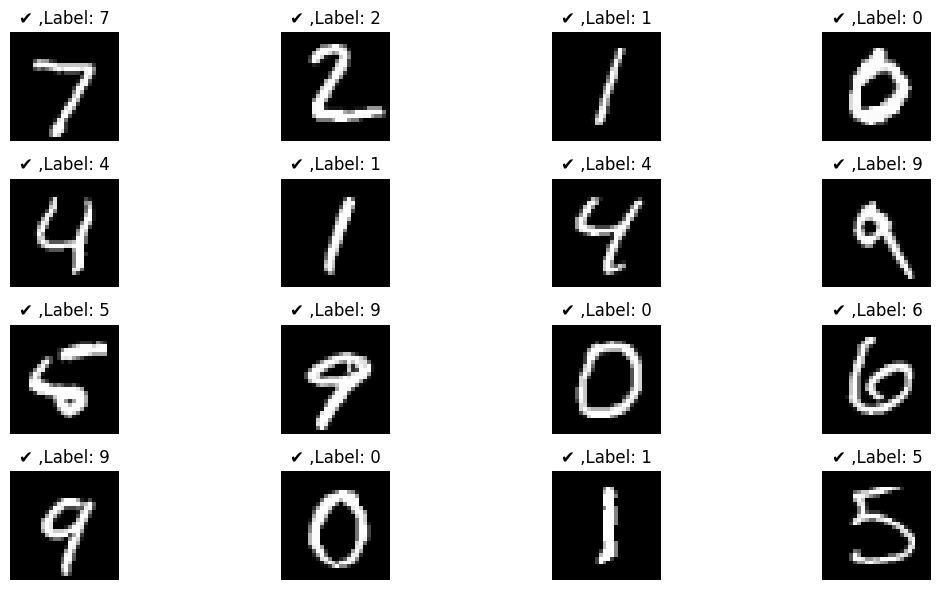

[5401,  100] loss : 0.000
[5401,  200] loss : 0.000
[5401,  300] loss : 0.000
[5401,  400] loss : 0.000
[5401,  500] loss : 0.000
[5401,  600] loss : 0.000
[5401,  700] loss : 0.000
[5401,  800] loss : 0.000
[5401,  900] loss : 0.000
acc =  98.86
[5402,  100] loss : 0.000
[5402,  200] loss : 0.000
[5402,  300] loss : 0.000
[5402,  400] loss : 0.000
[5402,  500] loss : 0.000
[5402,  600] loss : 0.000
[5402,  700] loss : 0.000
[5402,  800] loss : 0.000
[5402,  900] loss : 0.000
acc =  98.86
[5403,  100] loss : 0.000
[5403,  200] loss : 0.000
[5403,  300] loss : 0.000
[5403,  400] loss : 0.000
[5403,  500] loss : 0.000
[5403,  600] loss : 0.000
[5403,  700] loss : 0.000
[5403,  800] loss : 0.000
[5403,  900] loss : 0.000
acc =  98.86
[5404,  100] loss : 0.000
[5404,  200] loss : 0.000
[5404,  300] loss : 0.000
[5404,  400] loss : 0.000
[5404,  500] loss : 0.000
[5404,  600] loss : 0.000
[5404,  700] loss : 0.000
[5404,  800] loss : 0.000
[5404,  900] loss : 0.000
acc =  98.86
[5405,  100]

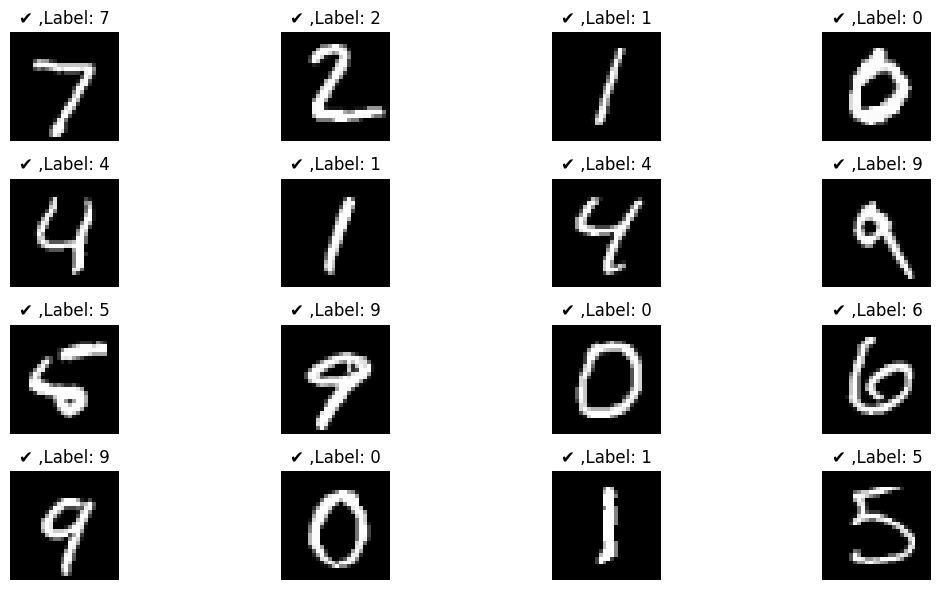

[5501,  100] loss : 0.000
[5501,  200] loss : 0.000
[5501,  300] loss : 0.000
[5501,  400] loss : 0.000
[5501,  500] loss : 0.000
[5501,  600] loss : 0.000
[5501,  700] loss : 0.000
[5501,  800] loss : 0.000
[5501,  900] loss : 0.000
acc =  98.86
[5502,  100] loss : 0.000
[5502,  200] loss : 0.000
[5502,  300] loss : 0.000
[5502,  400] loss : 0.000
[5502,  500] loss : 0.000
[5502,  600] loss : 0.000
[5502,  700] loss : 0.000
[5502,  800] loss : 0.000
[5502,  900] loss : 0.000
acc =  98.86
[5503,  100] loss : 0.000
[5503,  200] loss : 0.000
[5503,  300] loss : 0.000
[5503,  400] loss : 0.000
[5503,  500] loss : 0.000
[5503,  600] loss : 0.000
[5503,  700] loss : 0.000
[5503,  800] loss : 0.000
[5503,  900] loss : 0.000
acc =  98.86
[5504,  100] loss : 0.000
[5504,  200] loss : 0.000
[5504,  300] loss : 0.000
[5504,  400] loss : 0.000
[5504,  500] loss : 0.000
[5504,  600] loss : 0.000
[5504,  700] loss : 0.000
[5504,  800] loss : 0.000
[5504,  900] loss : 0.000
acc =  98.86
[5505,  100]

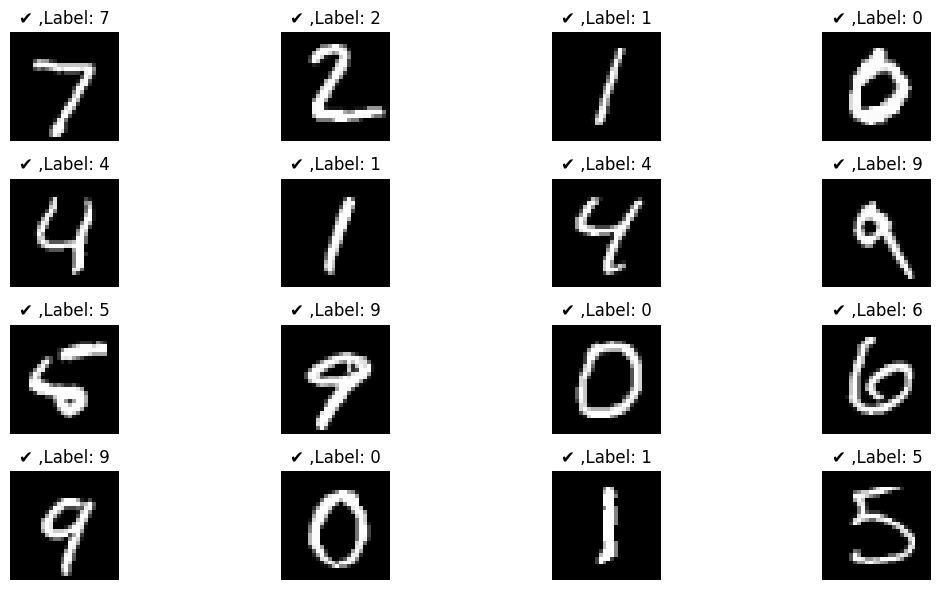

[5601,  100] loss : 0.000
[5601,  200] loss : 0.000
[5601,  300] loss : 0.000
[5601,  400] loss : 0.000
[5601,  500] loss : 0.000
[5601,  600] loss : 0.000
[5601,  700] loss : 0.000
[5601,  800] loss : 0.000
[5601,  900] loss : 0.000
acc =  98.86
[5602,  100] loss : 0.000
[5602,  200] loss : 0.000
[5602,  300] loss : 0.000
[5602,  400] loss : 0.000
[5602,  500] loss : 0.000
[5602,  600] loss : 0.000
[5602,  700] loss : 0.000
[5602,  800] loss : 0.000
[5602,  900] loss : 0.000
acc =  98.86
[5603,  100] loss : 0.000
[5603,  200] loss : 0.000
[5603,  300] loss : 0.000
[5603,  400] loss : 0.000
[5603,  500] loss : 0.000
[5603,  600] loss : 0.000
[5603,  700] loss : 0.000
[5603,  800] loss : 0.000
[5603,  900] loss : 0.000
acc =  98.86
[5604,  100] loss : 0.000
[5604,  200] loss : 0.000
[5604,  300] loss : 0.000
[5604,  400] loss : 0.000
[5604,  500] loss : 0.000
[5604,  600] loss : 0.000
[5604,  700] loss : 0.000
[5604,  800] loss : 0.000
[5604,  900] loss : 0.000
acc =  98.86
[5605,  100]

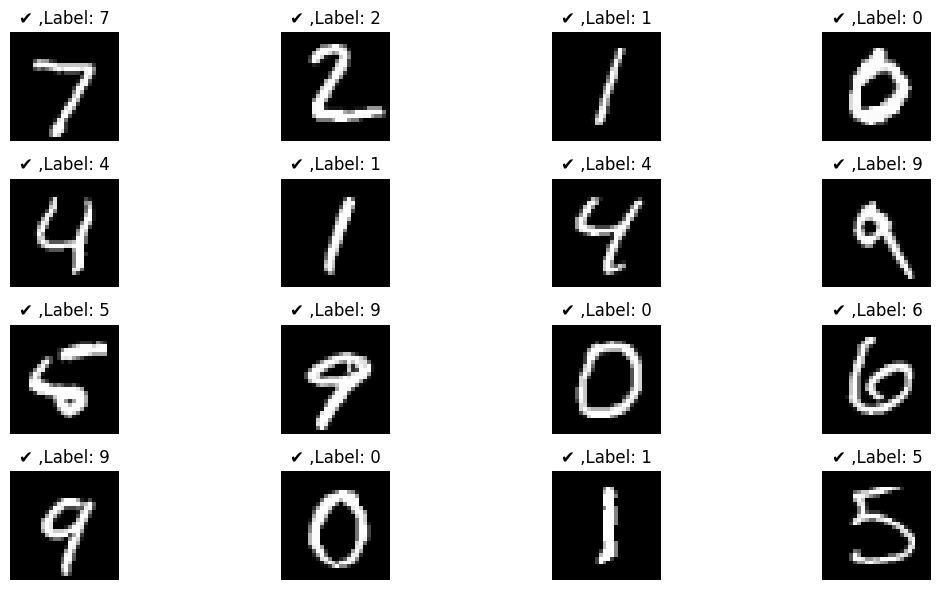

[5701,  100] loss : 0.000
[5701,  200] loss : 0.000
[5701,  300] loss : 0.000
[5701,  400] loss : 0.000
[5701,  500] loss : 0.000
[5701,  600] loss : 0.000
[5701,  700] loss : 0.000
[5701,  800] loss : 0.000
[5701,  900] loss : 0.000
acc =  98.86
[5702,  100] loss : 0.000
[5702,  200] loss : 0.000
[5702,  300] loss : 0.000
[5702,  400] loss : 0.000
[5702,  500] loss : 0.000
[5702,  600] loss : 0.000
[5702,  700] loss : 0.000
[5702,  800] loss : 0.000
[5702,  900] loss : 0.000
acc =  98.86
[5703,  100] loss : 0.000
[5703,  200] loss : 0.000
[5703,  300] loss : 0.000
[5703,  400] loss : 0.000
[5703,  500] loss : 0.000
[5703,  600] loss : 0.000
[5703,  700] loss : 0.000
[5703,  800] loss : 0.000
[5703,  900] loss : 0.000
acc =  98.86
[5704,  100] loss : 0.000
[5704,  200] loss : 0.000
[5704,  300] loss : 0.000
[5704,  400] loss : 0.000
[5704,  500] loss : 0.000
[5704,  600] loss : 0.000
[5704,  700] loss : 0.000
[5704,  800] loss : 0.000
[5704,  900] loss : 0.000
acc =  98.86
[5705,  100]

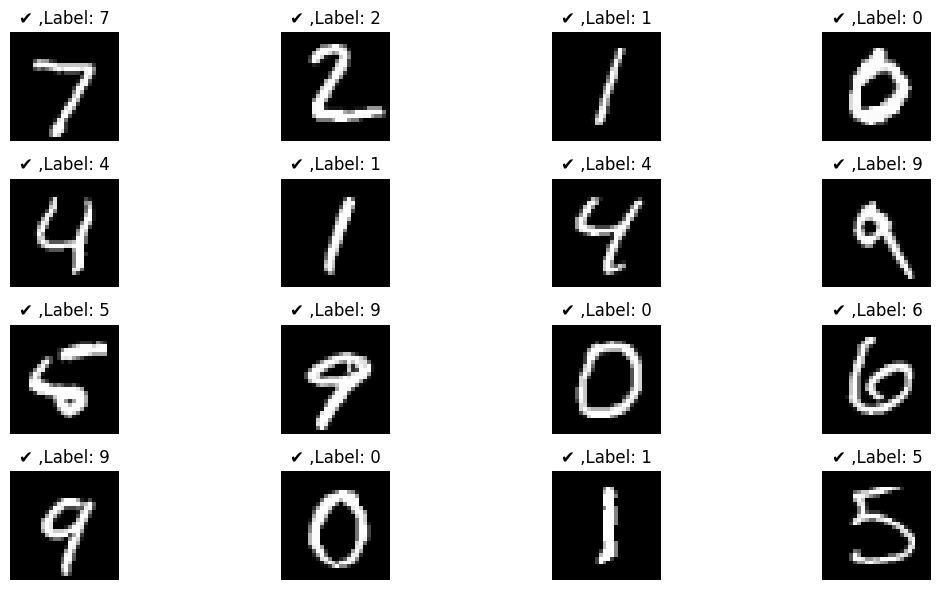

[5801,  100] loss : 0.000
[5801,  200] loss : 0.000
[5801,  300] loss : 0.000
[5801,  400] loss : 0.000
[5801,  500] loss : 0.000
[5801,  600] loss : 0.000
[5801,  700] loss : 0.000
[5801,  800] loss : 0.000
[5801,  900] loss : 0.000
acc =  98.86
[5802,  100] loss : 0.000
[5802,  200] loss : 0.000
[5802,  300] loss : 0.000
[5802,  400] loss : 0.000
[5802,  500] loss : 0.000
[5802,  600] loss : 0.000
[5802,  700] loss : 0.000
[5802,  800] loss : 0.000
[5802,  900] loss : 0.000
acc =  98.86
[5803,  100] loss : 0.000
[5803,  200] loss : 0.000
[5803,  300] loss : 0.000
[5803,  400] loss : 0.000
[5803,  500] loss : 0.000
[5803,  600] loss : 0.000
[5803,  700] loss : 0.000
[5803,  800] loss : 0.000
[5803,  900] loss : 0.000
acc =  98.86
[5804,  100] loss : 0.000
[5804,  200] loss : 0.000
[5804,  300] loss : 0.000
[5804,  400] loss : 0.000
[5804,  500] loss : 0.000
[5804,  600] loss : 0.000
[5804,  700] loss : 0.000
[5804,  800] loss : 0.000
[5804,  900] loss : 0.000
acc =  98.86
[5805,  100]

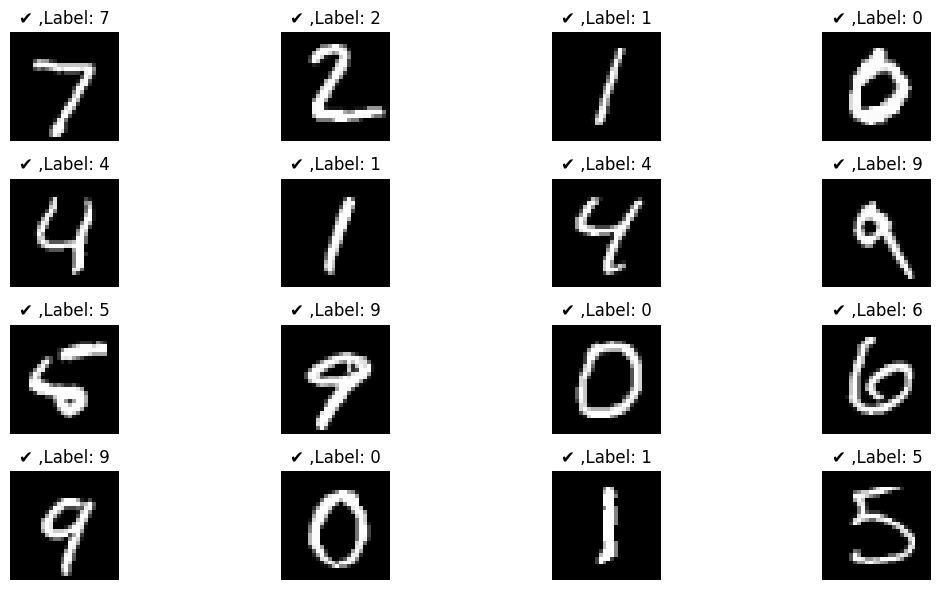

[5901,  100] loss : 0.000
[5901,  200] loss : 0.000
[5901,  300] loss : 0.000
[5901,  400] loss : 0.000
[5901,  500] loss : 0.000
[5901,  600] loss : 0.000
[5901,  700] loss : 0.000
[5901,  800] loss : 0.000
[5901,  900] loss : 0.000
acc =  98.86
[5902,  100] loss : 0.000
[5902,  200] loss : 0.000
[5902,  300] loss : 0.000
[5902,  400] loss : 0.000
[5902,  500] loss : 0.000
[5902,  600] loss : 0.000
[5902,  700] loss : 0.000
[5902,  800] loss : 0.000
[5902,  900] loss : 0.000
acc =  98.86
[5903,  100] loss : 0.000
[5903,  200] loss : 0.000
[5903,  300] loss : 0.000
[5903,  400] loss : 0.000
[5903,  500] loss : 0.000
[5903,  600] loss : 0.000
[5903,  700] loss : 0.000
[5903,  800] loss : 0.000
[5903,  900] loss : 0.000
acc =  98.86
[5904,  100] loss : 0.000
[5904,  200] loss : 0.000
[5904,  300] loss : 0.000
[5904,  400] loss : 0.000
[5904,  500] loss : 0.000
[5904,  600] loss : 0.000
[5904,  700] loss : 0.000
[5904,  800] loss : 0.000
[5904,  900] loss : 0.000
acc =  98.86
[5905,  100]

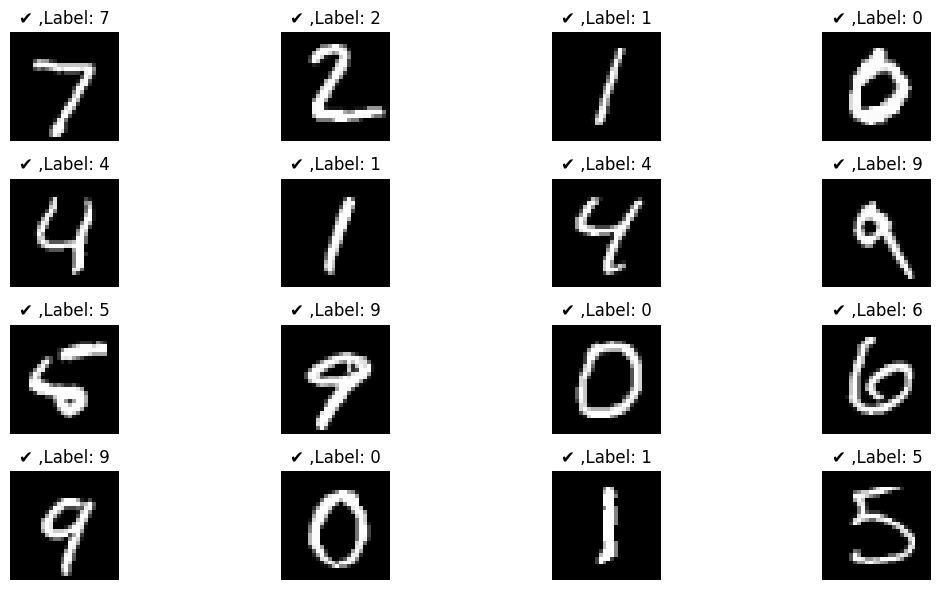

[6001,  100] loss : 0.000
[6001,  200] loss : 0.000
[6001,  300] loss : 0.000
[6001,  400] loss : 0.000
[6001,  500] loss : 0.000
[6001,  600] loss : 0.000
[6001,  700] loss : 0.000
[6001,  800] loss : 0.000
[6001,  900] loss : 0.000
acc =  98.86
[6002,  100] loss : 0.000
[6002,  200] loss : 0.000
[6002,  300] loss : 0.000
[6002,  400] loss : 0.000
[6002,  500] loss : 0.000
[6002,  600] loss : 0.000
[6002,  700] loss : 0.000
[6002,  800] loss : 0.000
[6002,  900] loss : 0.000
acc =  98.86
[6003,  100] loss : 0.000
[6003,  200] loss : 0.000
[6003,  300] loss : 0.000
[6003,  400] loss : 0.000
[6003,  500] loss : 0.000
[6003,  600] loss : 0.000
[6003,  700] loss : 0.000
[6003,  800] loss : 0.000
[6003,  900] loss : 0.000
acc =  98.86
[6004,  100] loss : 0.000
[6004,  200] loss : 0.000
[6004,  300] loss : 0.000
[6004,  400] loss : 0.000
[6004,  500] loss : 0.000
[6004,  600] loss : 0.000
[6004,  700] loss : 0.000
[6004,  800] loss : 0.000
[6004,  900] loss : 0.000
acc =  98.86
[6005,  100]

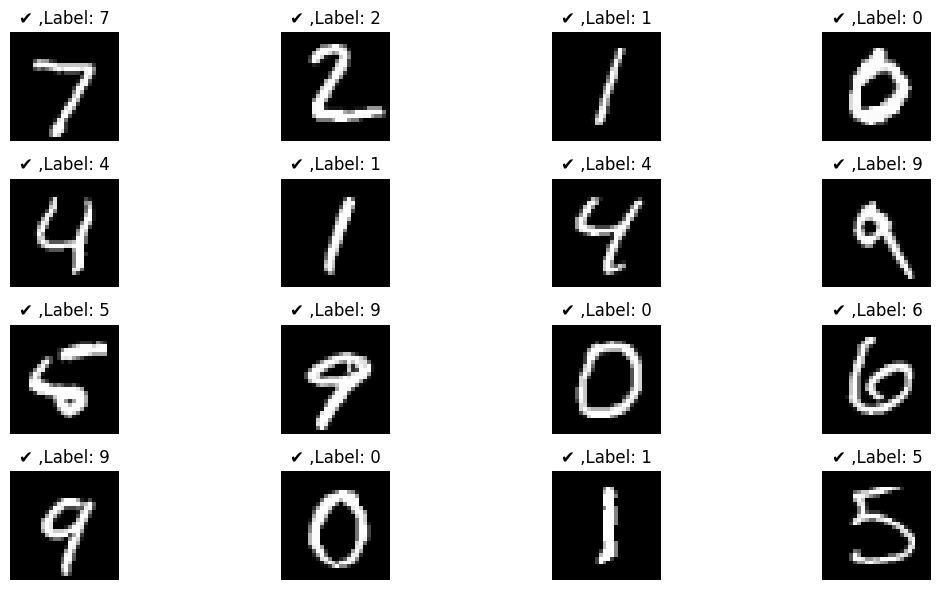

[6101,  100] loss : 0.000
[6101,  200] loss : 0.000
[6101,  300] loss : 0.000
[6101,  400] loss : 0.000
[6101,  500] loss : 0.000
[6101,  600] loss : 0.000
[6101,  700] loss : 0.000
[6101,  800] loss : 0.000
[6101,  900] loss : 0.000
acc =  98.86
[6102,  100] loss : 0.000
[6102,  200] loss : 0.000
[6102,  300] loss : 0.000
[6102,  400] loss : 0.000
[6102,  500] loss : 0.000
[6102,  600] loss : 0.000
[6102,  700] loss : 0.000
[6102,  800] loss : 0.000
[6102,  900] loss : 0.000
acc =  98.86
[6103,  100] loss : 0.000
[6103,  200] loss : 0.000
[6103,  300] loss : 0.000
[6103,  400] loss : 0.000
[6103,  500] loss : 0.000
[6103,  600] loss : 0.000
[6103,  700] loss : 0.000
[6103,  800] loss : 0.000
[6103,  900] loss : 0.000
acc =  98.86
[6104,  100] loss : 0.000
[6104,  200] loss : 0.000
[6104,  300] loss : 0.000
[6104,  400] loss : 0.000
[6104,  500] loss : 0.000
[6104,  600] loss : 0.000
[6104,  700] loss : 0.000
[6104,  800] loss : 0.000
[6104,  900] loss : 0.000
acc =  98.86
[6105,  100]

KeyboardInterrupt: 

In [110]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model = Net().to(device)
summary(model,(1,28,28))
criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=1e-3,momentum=0.5)


def train(rpoch):
    running_loss= 0.0
    for batch_idx,data in enumerate(train_loader,0):
        inputs,target = data
        inputs = inputs.to(device)
        target = target.to(device)
        optimizer.zero_grad() #优化器清零
        outputs = model(inputs)
        loss = criterion(outputs, target)
        loss.backward() 
        optimizer.step()
        running_loss += loss.item()
        if batch_idx %100 ==99:
            print('[%d,%5d] loss : %.3f' % (epoch, batch_idx+1, running_loss/100))
            running_loss = 0 

def test():
    correct =0
    total = 0
    with torch.no_grad():
        for data in test_loader:
            images,labels = data
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _,predicted = torch.max(outputs.data,dim = 1 ) #dim=0 :row
            total += labels.size(0)
            correct+= (predicted==labels).sum().item()
    print('acc = ',(100 * correct)/total)
if __name__ == '__main__':
    for epoch in range(100000):
        train(epoch)
        test()
        if epoch % 100 ==0:
            with torch.no_grad():
                for data in test_loader:
                    images,labels = data
                    images = images.to(device)
                    labels = labels.to(device)
                    outputs = model(images)
                    _,predicted = torch.max(outputs.data,dim = 1 ) #dim=0 :row
                    # print(predicted)
                    show_images(images,labels,predicted)
                    break


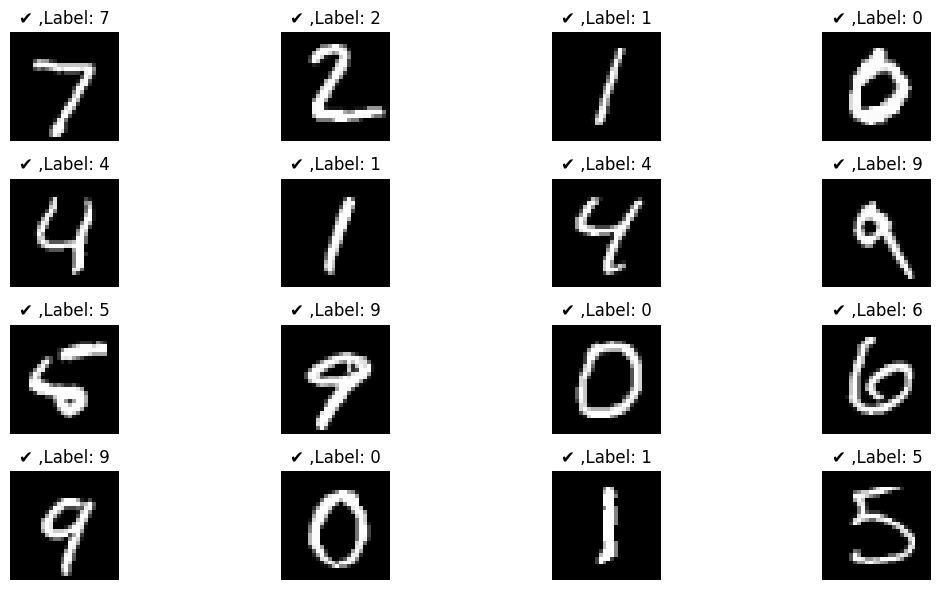

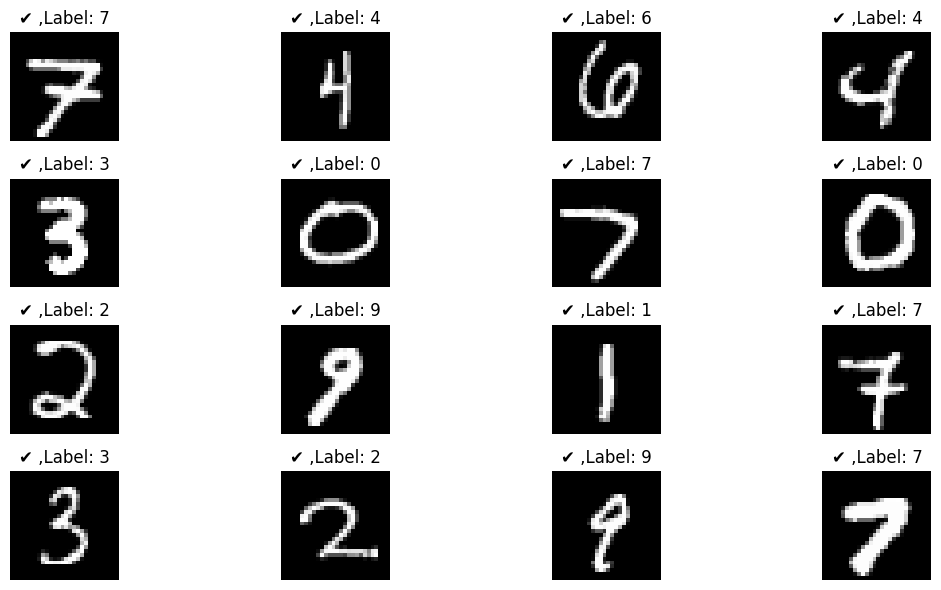

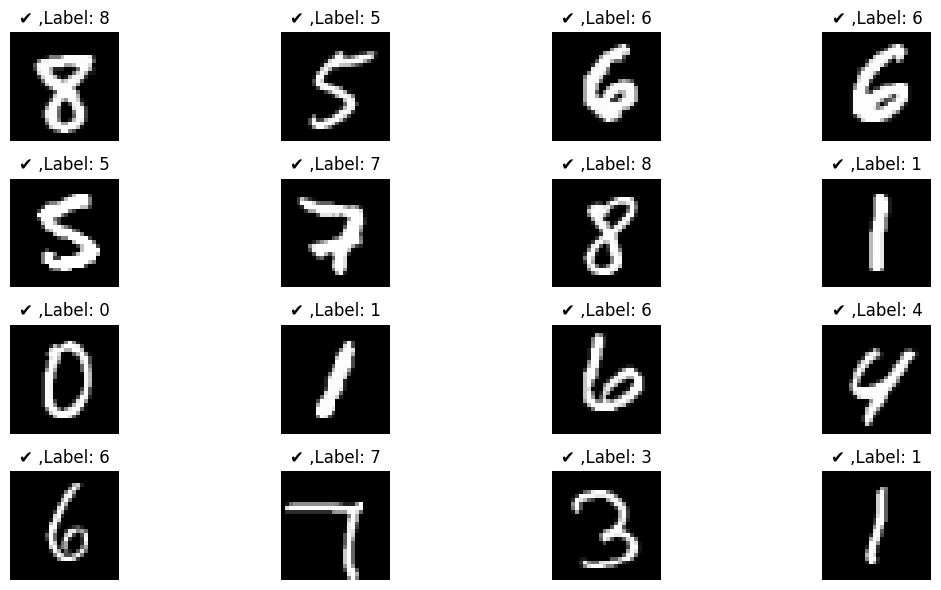

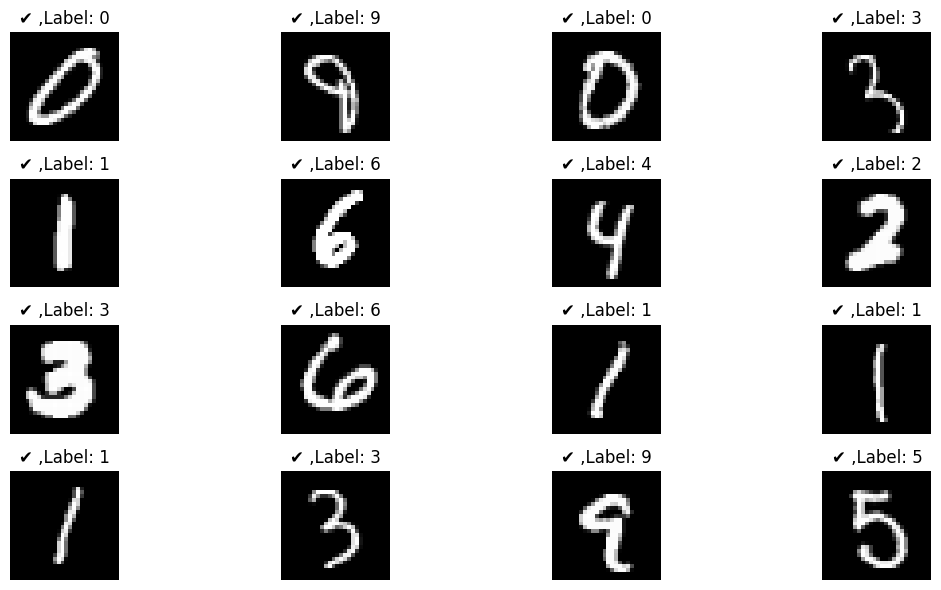

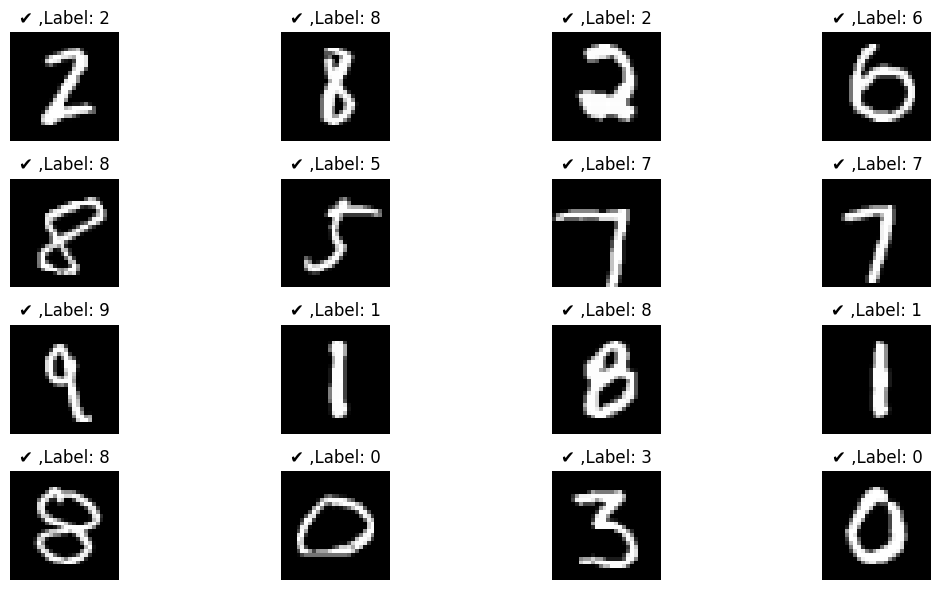

...

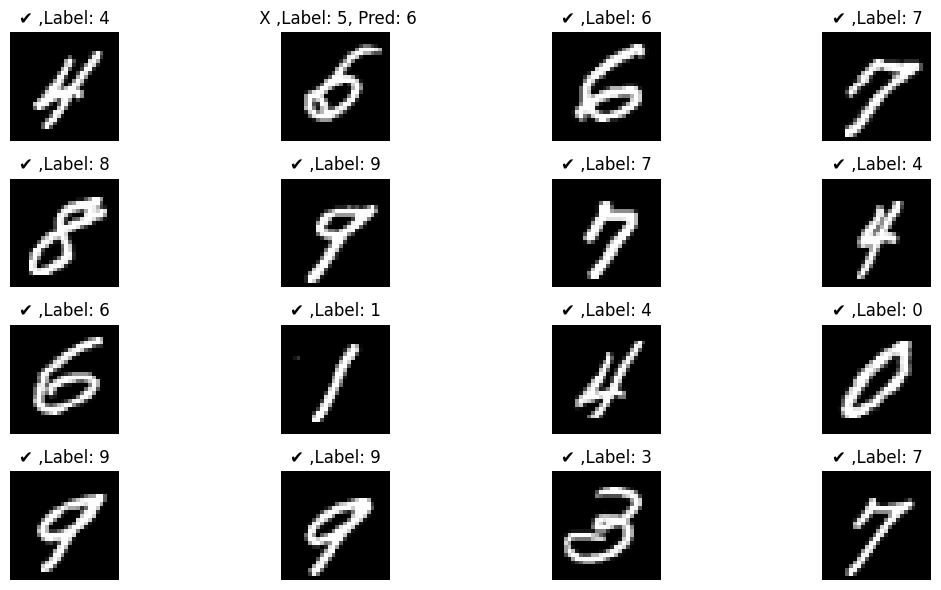

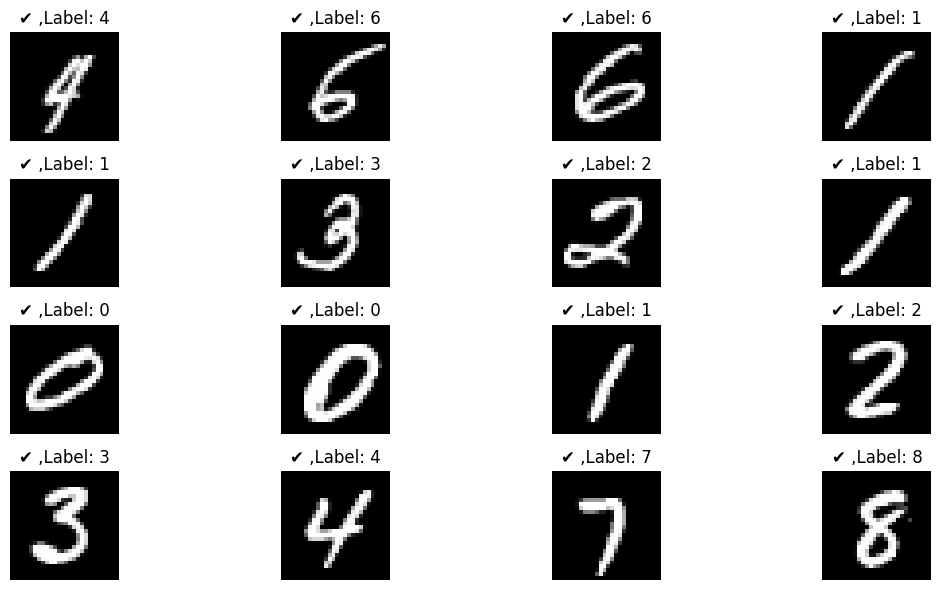

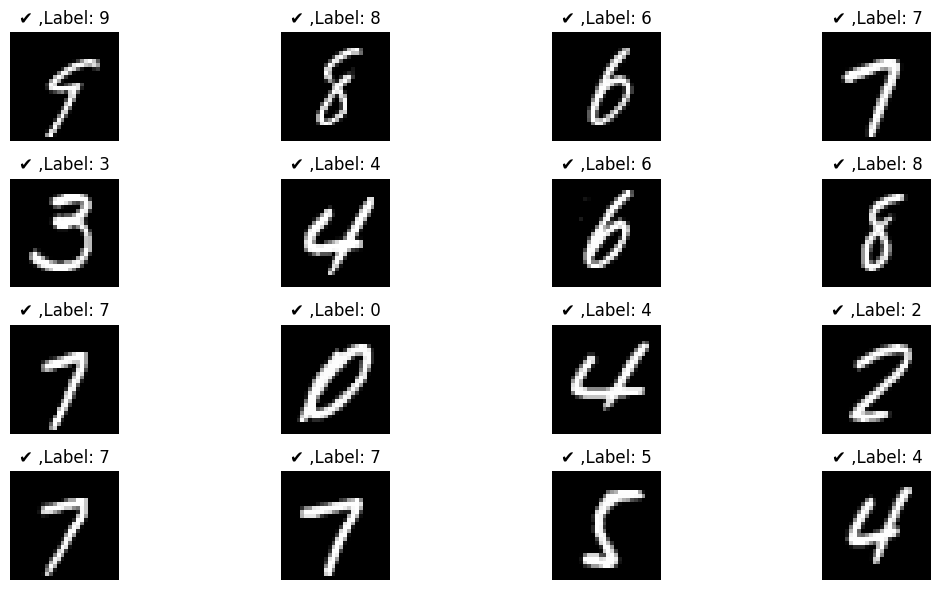

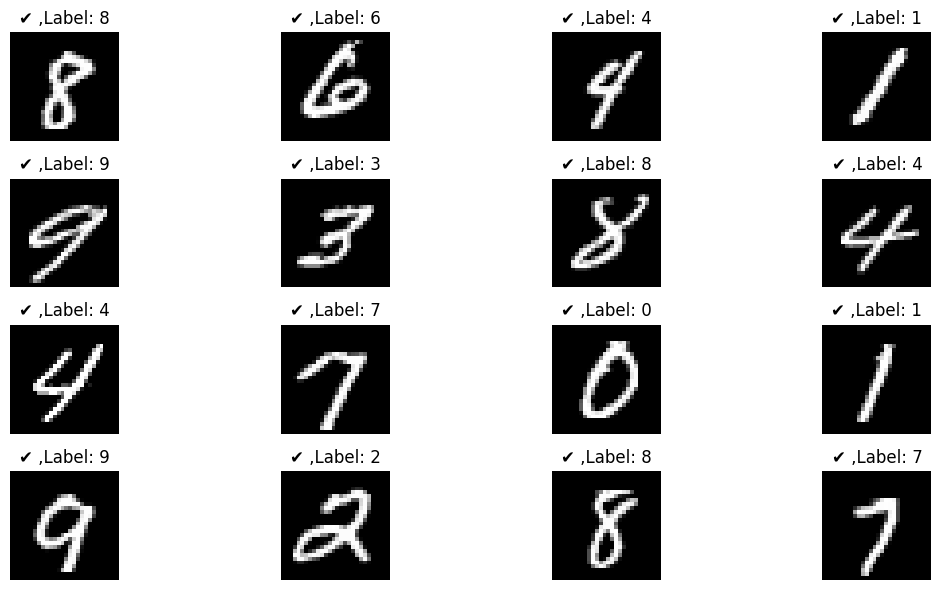

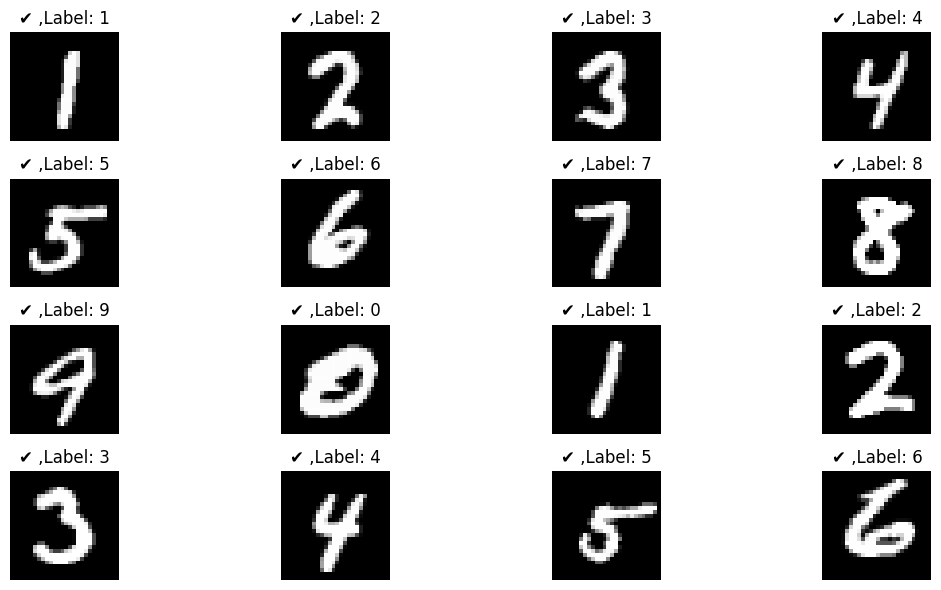

In [111]:
with torch.no_grad():
    for data in test_loader:
        images,labels = data
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _,predicted = torch.max(outputs.data,dim = 1 ) #dim=0 :row
        # print(predicted)
        show_images(images,labels,predicted)
        # break